In [0]:
#Tratamiento de datos
import pandas as pd
import numpy as np

#Graficos
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
import plotly.express as px

pd.set_option('display.max_columns', None)
pd.set_option('display.expand_frame_repr', False)
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', None)
#Configuramos pandas para que lanze valores con una precision de hasta 6 decimales
pd.set_option('display.float_format', '{:.6f}'.format)
import sys
# Establecer la opción de impresión para mostrar el array completo
np.set_printoptions(threshold=sys.maxsize)

## 1. Modelo de Machine Learning Con Datos Balanceados en Series Temporales

 Leemos los datos de PRESENTATION la tabla Delta con los datos Crudos Sin Balanceo

In [0]:
#1. Leemos los datos de PROCEESED la tabla Delta 
df_delta = spark.read.format("delta").load("/mnt/datalakemlopsd4m/presentation/proyectocongestion_presentation/tablacaracteristicas_congestion_tabladelta")
datos = df_delta.toPandas()
datos.head()

,congestion,eq_id,x,y,z,bearing_t,speed_t,gear_t,pitch_t,roll_t,n_sat,tramosidsnew_t,id_trabaj_t,tempeje1_t,tempeje2_t,tempeje3_t,tempeje4_t,tempeje5_t,tempeje6_t,presllanta1_t,presllanta2_t,presllanta3_t,presllanta4_t,presllanta5_t,presllanta6_t,isload_t,tonelaje_t,marcha_t,latitude_t,longitud_t,precisiongps_t,direccion_t,combustibleint_t,frecuencia_t,templlanta1_t,templlanta2_t,templlanta3_t,templlanta4_t,templlanta5_t,templlanta6_t,bateriasensorllanta1_t,bateriasensorllanta2_t,bateriasensorllanta3_t,bateriasensorllanta4_t,bateriasensorllanta5_t,bateriasensorllanta6_t,segment_angle_t,fuel_rate_t,instant_date_t,id_equipment,id_path,id_worker,start_xcoorint,start_ycoorint,start_zcoorint,end_xcoorint,end_ycoorint,end_zcoorint,alert_level,id_equipment_congestion,id_equipo,nombre,nombre_equipo,ENG_SPD,BOOST_PRES,SYS_VOLTAGE,ENG_OIL_PRES,THROTTL_POS,GROUND_SPD,AMB_AIR_TEMP,AIR_FLTR,HI_BOOST_PRES,ENG_COOL_TEMP,RT_LT_EXH_TEMP,LO_BOOST_PRES,LCKUP_SLIP,TRN_LUBE_TEMP,DIFF_LUBE_PRES,DIFF_TEMP,AUTO_LUBE,TRN_OUT_SPD,TC_OUT_TEMP,Gear,BRK/AIR_PRES,BRK_STROKE,RETARDER,RETARDER_MODE,RTF_LTF_BRKTEMP,RTR_LTR_BRKTEMP,RT_F_BRK_TEMP,RT_R_BRK_TEMP,LT_R_BRK_TEMP,SERV_BRK_STAT,PAYLOAD,Z_Coor,Tire_Press_N4,Hourmeter_MSPU,Lon_Coor,Speed_GPS,Direction,Lat_Coor,Tire_Press_N6,Lat,year,mes,dia,hora,minuto
0,1,199,5968211,6699450,86198,93,1426,3,614,417,17,-1,682,80,84,85,85,0,0,0,0,0,0,0,0,1,1426,3,-15207804,-75090507,300,93,82,2,0,0,0,0,0,0,0,0,0,0,0,0,0,2702,2024-04-06 14:26:46,124.000000,15885.000000,7.000000,5908928.000000,6788600.000000,70500.000000,5938466.000000,6699596.000000,82380.000000,2.000000,199.000000,199,FC98,FC98,1861.500000,148.000000,0.000000,462.000000,99.590000,16.000000,24.600000,3.500000,0.000000,89.000000,-15.000000,0.000000,1.500000,94.000000,49.000000,80.000000,1.000000,479.000000,85.000000,3.000000,728.000000,0.000000,0.000000,3.000000,-4.000000,1.000000,80.000000,85.000000,85.000000,0.000000,142.600000,861.900000,-75.090000,88.800000,-15.200000,-15.207805,-75.090384,49029272.000000,831868740.000000,86190.000000,2024,4,6,14,26
1,1,199,5746127,6742174,50138,349,0,0,-7,163,11,15087,-1,93,96,92,90,0,0,0,0,0,0,0,0,1,1464,0,-15203932,-75111183,500,349,74,2,0,0,0,0,0,0,0,0,0,0,0,0,-320,178,2024-04-03 06:39:32,72.000000,6943.000000,46.000000,5675596.000000,6699089.000000,54053.000000,5692638.000000,6704035.000000,52201.000000,2.000000,199.000000,199,FC98,FC98,700.000000,2.000000,0.000000,316.000000,0.000000,0.000000,26.290000,0.000000,0.000000,89.000000,-10.000000,0.000000,1.250000,94.000000,0.000000,85.000000,0.000000,0.000000,94.000000,0.000000,705.000000,0.000000,0.000000,1.000000,-3.000000,2.000000,92.000000,92.000000,90.000000,0.000000,146.390000,501.380000,-75.110000,0.000000,-15.200000,-15.203933,-75.111184,48805816.000000,831911500.000000,50138.000000,2024,4,3,6,39
2,1,199,5818642,6751165,65952,220,4055,6,-533,65,14,5732,17,93,96,97,96,0,0,0,0,0,0,0,0,0,0,6,-15203123,-75104431,450,220,89,2,0,0,0,0,0,0,0,0,0,0,0,0,-906,0,2024-04-05 19:30:08,124.000000,15885.000000,7.000000,5908928.000000,6788600.000000,70500.000000,5938466.000000,6699596.000000,82380.000000,2.000000,199.000000,199,FC98,FC98,1789.500000,2.000000,0.000000,488.000000,0.000000,40.000000,20.000000,0.500000,0.000000,83.000000,-2.000000,0.000000,0.940000,88.000000,145.000000,84.000000,0.000000,1503.000000,97.000000,6.000000,725.000000,0.000000,0.000000,1.000000,-3.000000,2.000000,93.000000,97.000000,96.000000,0.000000,0.000000,657.480000,-75.100000,222.600000,-15.200000,-15.203278,-75.104568,48876864.000000,831918800.000000,65749.000000,2024,4,5,19,30
3,1,199,5673432,6762462,80575,181,0,0,369,237,16,-1,17,78,82,84,83,0,0,0,0,0,0,0,0,1,1478,0,-15202095,-75117950,350,181,82,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2024-04-03 08:18:52,204.000000,6927.000000,147.000000,5746209.000000,6740697.000000,47810.000000,5746209.000000,6740697.000000,47810.000000,2.000000,199.000000,199,FC98,FC98,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,26.600000,0.000000,0.000000,97.000000,-2.0000

In [0]:
#datos.shape

In [0]:
datos['congestion'].value_counts()

1    778341
0     46423
Name: congestion, dtype: int64

#### 2.Eliminar las variables que no ingresaran al Modelo de ML

In [0]:
#datos.dtypes

In [0]:
# 2. Limpieza de variables No prioritarias
columnas_a_eliminar = ['nombre_equipo','nombre','start_time_alert','end_time_alert','Event_Date']

# 2.1 Filtrar las columnas que existen en el DataFrame
columnas_existentes = [col for col in columnas_a_eliminar if col in datos_sin_balanceo.columns]

# 2.2 Verificar si hay columnas para eliminar
if columnas_existentes:
    datos_sin_balanceo.drop(columnas_existentes, axis=1, inplace=True)

In [0]:
import pandas as pd
import numpy as np
from imblearn.over_sampling import SMOTE

# Convertimos a index la fecha
datos = datos.set_index('instant_date_t')

# Filtrar las fechas donde congestion == 1
fechas_congestion_1 = datos[datos['congestion'] == 1].index

In [0]:
fechas_congestion_1

DatetimeIndex(['2024-03-29 00:08:56', '2024-04-06 19:52:08',
               '2024-04-04 20:11:42', '2024-04-02 04:45:24',
               '2024-04-01 04:06:06', '2024-03-28 17:46:28',
               '2024-04-04 16:20:08', '2024-04-02 05:29:58',
               '2024-04-05 20:03:48', '2024-04-06 06:11:12',
               ...
               '2024-04-02 15:43:28', '2024-03-30 20:47:14',
               '2024-04-05 21:40:04', '2024-04-12 19:03:36',
               '2024-04-06 13:28:22', '2024-03-31 21:28:28',
               '2024-04-19 09:35:30', '2024-03-27 05:06:50',
               '2024-04-06 22:58:26', '2024-04-21 08:43:28'],
              dtype='datetime64[ns]', name='instant_date_t', length=778341, freq=None)

In [0]:
# Generar un rango de fechas completo dentro del rango del DataFrame
fecha_min = datos.index.min()
fecha_max = datos.index.max()
rango_completo = pd.date_range(start=fecha_min, end=fecha_max, freq='S')

In [0]:
fecha_min, fecha_max

(Timestamp('2024-03-27 01:15:28'), Timestamp('2024-04-23 23:59:30'))

In [0]:
rango_completo

DatetimeIndex(['2024-03-27 01:15:28', '2024-03-27 01:15:29',
               '2024-03-27 01:15:30', '2024-03-27 01:15:31',
               '2024-03-27 01:15:32', '2024-03-27 01:15:33',
               '2024-03-27 01:15:34', '2024-03-27 01:15:35',
               '2024-03-27 01:15:36', '2024-03-27 01:15:37',
               ...
               '2024-04-23 23:59:21', '2024-04-23 23:59:22',
               '2024-04-23 23:59:23', '2024-04-23 23:59:24',
               '2024-04-23 23:59:25', '2024-04-23 23:59:26',
               '2024-04-23 23:59:27', '2024-04-23 23:59:28',
               '2024-04-23 23:59:29', '2024-04-23 23:59:30'],
              dtype='datetime64[ns]', length=2414643, freq='S')

In [0]:
# Excluir las fechas de congestion == 1 del rango completo
fechas_disponibles = rango_completo.difference(fechas_congestion_1)

In [0]:
fechas_disponibles

DatetimeIndex(['2024-03-27 01:15:29', '2024-03-27 01:15:31',
               '2024-03-27 01:15:33', '2024-03-27 01:15:35',
               '2024-03-27 01:15:37', '2024-03-27 01:15:39',
               '2024-03-27 01:15:41', '2024-03-27 01:15:43',
               '2024-03-27 01:15:45', '2024-03-27 01:15:47',
               ...
               '2024-04-23 23:59:21', '2024-04-23 23:59:22',
               '2024-04-23 23:59:23', '2024-04-23 23:59:24',
               '2024-04-23 23:59:25', '2024-04-23 23:59:26',
               '2024-04-23 23:59:27', '2024-04-23 23:59:28',
               '2024-04-23 23:59:29', '2024-04-23 23:59:30'],
              dtype='datetime64[ns]', length=1737103, freq=None)

In [0]:
# Aplicar SMOTE para generar nuevas muestras de la clase minoritaria (congestion == 0)
smote = SMOTE(sampling_strategy='auto', random_state=42) # la clase minoritaria será sobre-muestreada hasta sea igual al mayoritario
X = np.arange(len(datos)).reshape(-1, 1)  # Crear una secuencia numérica, SMOTE espera que X sea una matriz de dos dimensiones
y = datos['congestion']  #variable objetivo (target)

In [0]:
# Aplicar SMOTE
X_res, y_res = smote.fit_resample(X, y)

# Convertir las nuevas muestras a DataFrame
datos_resampleados = pd.DataFrame({'index': X_res.flatten(), 'congestion': y_res})

In [0]:
datos_resampleados.shape

(1556682, 2)

In [0]:
datos_resampleados['congestion'].value_counts()

1    778341
0    778341
Name: congestion, dtype: int64

In [0]:
# Filtrar las nuevas muestras generadas por SMOTE (la diferencia entre las originales y las nuevas)
nuevas_muestras = datos_resampleados[len(datos):]

In [0]:
nuevas_muestras.head()

,index,congestion
824764,794982,0
824765,799964,0
824766,796975,0
824767,791326,0
824768,794563,0


In [0]:
# Asignar nuevas fechas secuenciales de fechas_disponibles a las nuevas muestras
nuevas_fechas_asignadas = fechas_disponibles[:len(nuevas_muestras)]
nuevas_muestras['instant_date'] = nuevas_fechas_asignadas

/root/.ipykernel/1373/command-64098860943727-2910242307:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nuevas_muestras['instant_date'] = nuevas_fechas_asignadas


In [0]:
nuevas_fechas_asignadas

DatetimeIndex(['2024-03-27 01:15:29', '2024-03-27 01:15:31',
               '2024-03-27 01:15:33', '2024-03-27 01:15:35',
               '2024-03-27 01:15:37', '2024-03-27 01:15:39',
               '2024-03-27 01:15:41', '2024-03-27 01:15:43',
               '2024-03-27 01:15:45', '2024-03-27 01:15:47',
               ...
               '2024-04-08 07:19:17', '2024-04-08 07:19:19',
               '2024-04-08 07:19:21', '2024-04-08 07:19:23',
               '2024-04-08 07:19:25', '2024-04-08 07:19:27',
               '2024-04-08 07:19:29', '2024-04-08 07:19:31',
               '2024-04-08 07:19:33', '2024-04-08 07:19:35'],
              dtype='datetime64[ns]', length=731918, freq=None)

In [0]:
nuevas_muestras.head()

,index,congestion,instant_date
824764,794982,0,2024-03-27 01:15:29
824765,799964,0,2024-03-27 01:15:31
824766,796975,0,2024-03-27 01:15:33
824767,791326,0,2024-03-27 01:15:35
824768,794563,0,2024-03-27 01:15:37


In [0]:
#Solo se han de agregar las etiquetas que tienen la clase minoritaria en este caso 0
nuevas_muestras['congestion'].value_counts()

0    731918
Name: congestion, dtype: int64

In [0]:
# Crear el DataFrame final combinando los datos originales y las nuevas muestras
nuevas_muestras.set_index('instant_date', inplace=True)
datos_balanceados = pd.concat([datos, nuevas_muestras[['congestion']]]).sort_index()

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-64098860943731>, line 2
      1 # Crear el DataFrame final combinando los datos originales y las nuevas muestras
----> 2 nuevas_muestras.set_index('instant_date', inplace=True)
      3 datos_balanceados = pd.concat([datos, nuevas_muestras[['congestion']]]).sort_index()

NameError: name 'nuevas_muestras' is not defined

In [0]:
datos.dtypes

congestion                   int64
eq_id                        int64
x                            int64
y                            int64
z                            int64
bearing_t                    int64
speed_t                      int64
gear_t                       int64
pitch_t                      int64
roll_t                       int64
n_sat                        int64
tramosidsnew_t               int64
id_trabaj_t                  int64
tempeje1_t                   int64
tempeje2_t                   int64
tempeje3_t                   int64
tempeje4_t                   int64
tempeje5_t                   int64
tempeje6_t                   int64
presllanta1_t                int64
presllanta2_t                int64
presllanta3_t                int64
presllanta4_t                int64
presllanta5_t                int64
presllanta6_t                int64
isload_t                     int64
tonelaje_t                   int64
marcha_t                     int64
latitude_t          

#### 3. Hacer el Balanceo de datos mediante SMOTE (aumentando la clase minoritoria)

In [0]:
import pandas as pd
import numpy as np
from imblearn.over_sampling import SMOTE

# Convertimos a index la fecha
datos = datos.set_index('instant_date_t')

# Filtrar las fechas donde congestion == 1
fechas_congestion_1 = datos[datos['congestion'] == 1].index

# Generar un rango de fechas completo dentro del rango del DataFrame
fecha_min = datos.index.min()
fecha_max = datos.index.max()
rango_completo = pd.date_range(start=fecha_min, end=fecha_max, freq='S')

# Excluir las fechas de congestion == 1 del rango completo
fechas_disponibles = rango_completo.difference(fechas_congestion_1)

# Aplicar SMOTE para generar nuevas muestras de la clase minoritaria (congestion == 0)
smote = SMOTE(sampling_strategy='auto', random_state=42)

# Usar todas las columnas como características para SMOTE excepto 'congestion'
X = datos.drop(columns=['congestion'])
y = datos['congestion']

# Convertir las fechas del índice a números para usarlas con SMOTE
X['instant_date_num'] = X.index.astype(int) / 10**9  # Convertir a segundos

# Aplicar SMOTE
X_res, y_res = smote.fit_resample(X, y)

# Convertir de nuevo a DataFrame
X_res = pd.DataFrame(X_res, columns=X.columns)
y_res = pd.Series(y_res, name='congestion')

# Filtrar las nuevas muestras generadas por SMOTE (la diferencia entre las originales y las nuevas)
nuevas_muestras = X_res[len(datos):]
nuevas_congestion = y_res[len(datos):]

# Asignar nuevas fechas secuenciales de fechas_disponibles a las nuevas muestras
nuevas_fechas_asignadas = fechas_disponibles[:len(nuevas_muestras)]
nuevas_muestras['instant_date'] = nuevas_fechas_asignadas

# Crear el DataFrame final combinando los datos originales y las nuevas muestras
nuevas_muestras = nuevas_muestras.set_index('instant_date')
nuevas_muestras = nuevas_muestras.drop(columns=['instant_date_num'])
nuevas_muestras['congestion'] = nuevas_congestion.values

# Combinar los datos originales y las nuevas muestras
datos_balanceados = pd.concat([datos, nuevas_muestras]).sort_index()

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fe3087ee8c0>
Traceback (most recent call last):
  File "/databricks/python/lib/python3.10/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/databricks/python/lib/python3.10/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/databricks/python/lib/python3.10/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/databricks/python/lib/python3.10/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
/root/.ipykernel/28960/command-64098860943734-3508128452:42: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result

In [0]:
datos_balanceados.head()

,congestion,eq_id,x,y,z,bearing_t,speed_t,gear_t,pitch_t,roll_t,n_sat,tramosidsnew_t,id_trabaj_t,tempeje1_t,tempeje2_t,tempeje3_t,tempeje4_t,tempeje5_t,tempeje6_t,presllanta1_t,presllanta2_t,presllanta3_t,presllanta4_t,presllanta5_t,presllanta6_t,isload_t,tonelaje_t,marcha_t,latitude_t,longitud_t,precisiongps_t,direccion_t,combustibleint_t,frecuencia_t,templlanta1_t,templlanta2_t,templlanta3_t,templlanta4_t,templlanta5_t,templlanta6_t,bateriasensorllanta1_t,bateriasensorllanta2_t,bateriasensorllanta3_t,bateriasensorllanta4_t,bateriasensorllanta5_t,bateriasensorllanta6_t,segment_angle_t,fuel_rate_t,id_equipment,id_path,id_worker,start_xcoorint,start_ycoorint,start_zcoorint,end_xcoorint,end_ycoorint,end_zcoorint,alert_level,id_equipment_congestion,id_equipo,ENG_SPD,BOOST_PRES,SYS_VOLTAGE,ENG_OIL_PRES,THROTTL_POS,GROUND_SPD,AMB_AIR_TEMP,AIR_FLTR,HI_BOOST_PRES,ENG_COOL_TEMP,RT_LT_EXH_TEMP,LO_BOOST_PRES,LCKUP_SLIP,TRN_LUBE_TEMP,DIFF_LUBE_PRES,DIFF_TEMP,AUTO_LUBE,TRN_OUT_SPD,TC_OUT_TEMP,Gear,BRK/AIR_PRES,BRK_STROKE,RETARDER,RETARDER_MODE,RTF_LTF_BRKTEMP,RTR_LTR_BRKTEMP,RT_F_BRK_TEMP,RT_R_BRK_TEMP,LT_R_BRK_TEMP,SERV_BRK_STAT,PAYLOAD,Z_Coor,Tire_Press_N4,Hourmeter_MSPU,Lon_Coor,Speed_GPS,Direction,Lat_Coor,Tire_Press_N6,Lat,year,mes,dia,hora,minuto
2024-03-27 01:15:28,1,61,0,0,0,0,0,0,0,0,0,-1,671,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,100,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,3,27,1,15
2024-03-27 01:15:29,0,61,5724920,6716457,53057,228,1185,3,591,126,12,-1,671,83,83,82,82,0,0,0,0,0,0,0,0,1,1417,3,-15206256,-75113158,437,228,95,2,0,0,0,0,0,0,0,0,0,0,0,0,0,2448,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,61,1388.564647,152.920845,0.000000,468.000000,99.590000,12.123021,21.500000,1.500000,0.000000,83.000000,0.000000,0.000000,0.000000,88.000000,92.000000,80.000000,0.000000,487.000000,83.000000,3.000000,826.000000,0.000000,0.000000,3.000000,0.000000,0.000000,83.000000,82.000000,82.000000,0.000000,141.690000,531.146042,-75.110000,233.111590,-15.200000,-15.206305,-75.113218,48783998.464352,831885257.928741,53114.604224,2024,4,23,21,0
2024-03-27 01:15:30,1,61,5860974,6645449,80200,0,0,0,0,0,0,-1,671,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,100,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,3,27,1,15
2024-03-27 01:15:31,0,61,5667163,6694799,58288,231,1233,3,495,28,12,-1,671,83,83,83,83,0,0,0,0,0,0,0,0,1,1559,3,-15208211,-75118536,420,231,86,2,0,0,0,0,0,0,0,0,0,0,0,0,0,2582,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,61,1509.335784,180.409234,0.000000,481.000000,99.590000,13.034103,21.000000,3.000000,0.000000,85.000000,-9.000000,0.000000,0.000000,91.000000,74.000000,82.000000,0.000000,450.000000,83.000000,3.000000,895.000000,0.000000,0.000000,3.000000,0.000000,0.000000,83.000000,83.000000,83.000000,0.000000,155.890000,583.734103,-75.110000,227.439905,-15.200000,-15.208274,-75.118611,48726114.123780,831863437.943301,58373.410287,2024,4,23,22,32
2024-03-27 01:15:32,1,61

In [0]:
#### Verificamos si se hizo el Balanceo adecuadamente

In [0]:
print(datos_balanceados['congestion'].value_counts())

1    778341
0    778341
Name: congestion, dtype: int64


#### 3.1 Verificamos la peridocidad entre nuestra serie temporal, si hay periocidad exacta, o es por distintas periocidades

In [0]:
#2.3 Ordenamos el dataset de forma ascendente segun el datetime
datos_balanceados.sort_index(inplace=True)

#2.4 Identificamos la periocidad de la serie temporal
df_time_diffs = datos_balanceados.index.to_series().diff().dt.total_seconds()

# # 2.4.1 Contar cuántas diferencias de tiempo tienen cada valor específico
diferencias_frecuencias = df_time_diffs.value_counts().sort_index()
# # 2.4.2 Mostrar los recuentos
print(diferencias_frecuencias)

0.0         112870
1.0        1058648
2.0         384929
4.0             44
6.0             44
            ...   
27660.0          1
31806.0          1
51156.0          1
55782.0          1
58932.0          1
Length: 134, dtype: int64


In [0]:
spark.sql("SHOW DATABASES").show(truncate=False)

+---------------------------------+
|databaseName                     |
+---------------------------------+
|dbproyectocongestion_presentation|
|dbproyectocongestion_processed   |
|default                          |
|f1_demo                          |
|presentation_db                  |
|presentation_db_v2               |
|processed                        |
|processed_db                     |
|proyectopases_presentation       |
|proyectopases_processed          |
|prueba                           |
+---------------------------------+



In [0]:
from pyspark.sql.functions import col

# Resetear el índice de Pandas y renombrarlo como "fecha_hora"
datos_balanceados.reset_index(inplace=True)
datos_balanceados.rename(columns={"index": "instant_date_t"}, inplace=True)

# Convertir el DataFrame de Pandas a un DataFrame de Spark
spark_datos = spark.createDataFrame(datos_balanceados)

# Nombre de la tabla Delta a guardar
nombre_tabla_delta = "dbproyectocongestion_presentation.data_congestion_serietemp_balanceada"

# Verificar si ya existe la tabla Delta
if spark.catalog.tableExists(nombre_tabla_delta):
    # Eliminar la tabla Delta existente
    spark.sql("DROP TABLE IF EXISTS " + nombre_tabla_delta)

# 12. Guardar los datos preprocesados en una tabla Delta
spark_datos.write.format("delta").mode("overwrite").option("mergeSchema", "true").saveAsTable(nombre_tabla_delta)

#### 3.2 Uniformizamos la periocidad de la serie temporal, a la deseada

Leemos los datos de PRESENTATION la tabla Delta con los datos Balanceados

In [0]:
#1. Leemos los datos de PROCEESED la tabla Delta 
df_delta2 = spark.read.format("delta").load("/mnt/datalakemlopsd4m/presentation/proyectocongestion_presentation/data_congestion_serietemp_balanceada")
datos_cong_balanceado = df_delta2.toPandas()
datos_cong_balanceado.head()

,instant_date_t,congestion,eq_id,x,y,z,bearing_t,speed_t,gear_t,pitch_t,roll_t,n_sat,tramosidsnew_t,id_trabaj_t,tempeje1_t,tempeje2_t,tempeje3_t,tempeje4_t,tempeje5_t,tempeje6_t,presllanta1_t,presllanta2_t,presllanta3_t,presllanta4_t,presllanta5_t,presllanta6_t,isload_t,tonelaje_t,marcha_t,latitude_t,longitud_t,precisiongps_t,direccion_t,combustibleint_t,frecuencia_t,templlanta1_t,templlanta2_t,templlanta3_t,templlanta4_t,templlanta5_t,templlanta6_t,bateriasensorllanta1_t,bateriasensorllanta2_t,bateriasensorllanta3_t,bateriasensorllanta4_t,bateriasensorllanta5_t,bateriasensorllanta6_t,segment_angle_t,fuel_rate_t,id_equipment,id_path,id_worker,start_xcoorint,start_ycoorint,start_zcoorint,end_xcoorint,end_ycoorint,end_zcoorint,alert_level,id_equipment_congestion,id_equipo,ENG_SPD,BOOST_PRES,SYS_VOLTAGE,ENG_OIL_PRES,THROTTL_POS,GROUND_SPD,AMB_AIR_TEMP,AIR_FLTR,HI_BOOST_PRES,ENG_COOL_TEMP,RT_LT_EXH_TEMP,LO_BOOST_PRES,LCKUP_SLIP,TRN_LUBE_TEMP,DIFF_LUBE_PRES,DIFF_TEMP,AUTO_LUBE,TRN_OUT_SPD,TC_OUT_TEMP,Gear,BRK/AIR_PRES,BRK_STROKE,RETARDER,RETARDER_MODE,RTF_LTF_BRKTEMP,RTR_LTR_BRKTEMP,RT_F_BRK_TEMP,RT_R_BRK_TEMP,LT_R_BRK_TEMP,SERV_BRK_STAT,PAYLOAD,Z_Coor,Tire_Press_N4,Hourmeter_MSPU,Lon_Coor,Speed_GPS,Direction,Lat_Coor,Tire_Press_N6,Lat,year,mes,dia,hora,minuto
0,2024-04-07 20:22:07,0,61,5747788,6698336,64520,50,19,0,189,-168,12,-1,673,86,86,85,85,0,0,0,0,0,0,0,0,1,1383,0,-15207896,-75111030,400,50,88,2,0,0,0,0,0,0,0,0,0,0,0,0,0,204,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,61,698.691243,4.000000,0.000000,465.000000,0.000000,0.000000,30.790000,0.000000,0.000000,87.000000,2.000000,0.000000,0.920000,94.000000,0.000000,82.000000,0.000000,0.000000,86.000000,0.000000,829.000000,0.000000,0.000000,3.000000,0.000000,0.000000,86.000000,85.000000,85.000000,0.000000,138.300000,645.107834,-75.110000,182.640000,-15.200000,-15.207896,-75.111032,48807509.529940,831867650.000000,64510.783433,2024,4,23,16,7
1,2024-04-07 20:22:08,0,199,5869496,6644852,76607,144,0,0,52,504,19,-1,-1,56,59,61,62,0,0,0,0,0,0,0,0,0,0,0,-15212737,-75099700,300,144,66,2,0,0,0,0,0,0,0,0,0,0,0,0,0,170,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,199,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,4,19,16,38
2,2024-04-07 20:22:09,0,199,5858844,6644509,78579,221,13,0,25,73,12,-1,-1,50,53,57,57,0,0,0,0,0,0,0,0,0,0,0,-15212767,-75100692,350,221,78,2,0,0,0,0,0,0,0,0,0,0,0,0,0,168,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,199,699.534432,0.000000,0.000000,444.000000,0.000000,0.000000,18.790000,0.000000,0.000000,62.000000,12.000000,0.000000,1.070000,59.000000,0.000000,28.000000,0.000000,0.000000,54.000000,0.000000,737.000000,0.000000,0.000000,1.000000,-3.000000,0.000000,50.000000,57.000000,57.000000,0.000000,0.000000,785.780000,-75.100000,0.000000,-15.210000,-15.212768,-75.100688,48918576.000000,831813800.000000,78579.000000,2024,4,8,21,19
3,2024-04-07 20:22:10,0,199,5888426,6701673,79886,66,2987,6,287,213,16,-1,324,86,90,94,94,0,0,0,0,0,0,0,0,0,0,6,-15207600,-75097935,350,66,85,2,0,0,0,0,0,0,0,0,0,0,0,0,0,1161,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,199,1397.085295,75.183778,0.000000,479.000000,71.657043,30.461217,25.500000,0.500000,0.000000,85.000000,-6.718378,0.000000,1.268819,94.640811,155.718378,83.640811,0.000000,1648.951078,89.000000,6.000000,753.028644,0.000000,0.000000,2.000000,-3.640811,1.000000,87.359189,94.640811,93.640811,0.000000,0.000000,799.805774,-75.090000,51.485078,-15.200000,-15.207498,-75.097749,48950156.109478,831872112.648898,7

In [0]:
print(datos_cong_balanceado['congestion'].value_counts())

congestion
0    778341
1    778341
Name: count, dtype: int64


In [0]:
datos_cong_balanceado.shape

(1556682, 106)

In [0]:
# #2. Ajuste de los datos a Series Temporales
# #2.1 Se establece la columna 'Time' como el índice del DataFrame "datos"
datos_cong_balanceado = datos_cong_balanceado.set_index('instant_date_t')

# #2.3 Ordenamos el dataset de forma ascendente segun el datetime
datos_cong_balanceado.sort_index(inplace=True)

#2.4 Identificamos la periocidad de la serie temporal
df_time_diffs = datos_cong_balanceado.index.to_series().diff().dt.total_seconds()

# # 2.4.1 Contar cuántas diferencias de tiempo tienen cada valor específico
# diferencias_frecuencias = df_time_diffs.value_counts().sort_index()
# # 2.4.2 Mostrar los recuentos
# print(diferencias_frecuencias)

#3. Eliminamos o Filtramos las filas donde la diferencia es distinta de cero (Con ello eliminamos las filas o registros de fechas duplicadas)
datos_cong_balanceado = datos_cong_balanceado[df_time_diffs != 0]

#4. # Reinterpolar el dataset con una periosidad en especifico
# 'S' o 'seg' : Segundo, 'T' o 'min': Minuto,'H' o 'Hr': Hora,'D': Día,'W': Semana,'M': Mes,'Q': Trimestre,'Y': Año
datos_cong_balanceado = datos_cong_balanceado.asfreq(freq='5T', method='bfill')

datos_cong_balanceado.head()

/root/.ipykernel/1524/command-3965471914943700-3769267950:21: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  datos_cong_balanceado = datos_cong_balanceado.asfreq(freq='5T', method='bfill')


,congestion,eq_id,x,y,z,bearing_t,speed_t,gear_t,pitch_t,roll_t,n_sat,tramosidsnew_t,id_trabaj_t,tempeje1_t,tempeje2_t,tempeje3_t,tempeje4_t,tempeje5_t,tempeje6_t,presllanta1_t,presllanta2_t,presllanta3_t,presllanta4_t,presllanta5_t,presllanta6_t,isload_t,tonelaje_t,marcha_t,latitude_t,longitud_t,precisiongps_t,direccion_t,combustibleint_t,frecuencia_t,templlanta1_t,templlanta2_t,templlanta3_t,templlanta4_t,templlanta5_t,templlanta6_t,bateriasensorllanta1_t,bateriasensorllanta2_t,bateriasensorllanta3_t,bateriasensorllanta4_t,bateriasensorllanta5_t,bateriasensorllanta6_t,segment_angle_t,fuel_rate_t,id_equipment,id_path,id_worker,start_xcoorint,start_ycoorint,start_zcoorint,end_xcoorint,end_ycoorint,end_zcoorint,alert_level,id_equipment_congestion,id_equipo,ENG_SPD,BOOST_PRES,SYS_VOLTAGE,ENG_OIL_PRES,THROTTL_POS,GROUND_SPD,AMB_AIR_TEMP,AIR_FLTR,HI_BOOST_PRES,ENG_COOL_TEMP,RT_LT_EXH_TEMP,LO_BOOST_PRES,LCKUP_SLIP,TRN_LUBE_TEMP,DIFF_LUBE_PRES,DIFF_TEMP,AUTO_LUBE,TRN_OUT_SPD,TC_OUT_TEMP,Gear,BRK/AIR_PRES,BRK_STROKE,RETARDER,RETARDER_MODE,RTF_LTF_BRKTEMP,RTR_LTR_BRKTEMP,RT_F_BRK_TEMP,RT_R_BRK_TEMP,LT_R_BRK_TEMP,SERV_BRK_STAT,PAYLOAD,Z_Coor,Tire_Press_N4,Hourmeter_MSPU,Lon_Coor,Speed_GPS,Direction,Lat_Coor,Tire_Press_N6,Lat,year,mes,dia,hora,minuto
instant_date_t,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2024-03-27 01:15:28,1,61,0,0,0,0,0,0,0,0,0,-1,671,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,100,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,3,27,1,15
2024-03-27 01:20:28,1,61,5857942,6647009,79260,0,0,0,43,33,12,-1,671,44,43,48,47,0,0,0,0,0,0,0,0,0,0,0,-15212541,-75100776,330,0,82,2,0,0,0,0,0,0,0,0,0,0,0,0,0,178,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,3,27,1,20
2024-03-27 01:25:28,1,61,5858844,6645047,79360,112,188,1,265,42,12,-1,671,49,49,51,50,0,0,0,0,0,0,0,0,0,0,1,-15212718,-75100692,419,112,81,2,0,0,0,0,0,0,0,0,0,0,0,0,0,299,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,3,27,1,25
2024-03-27 01:30:28,1,61,5861711,6646863,80280,186,1,0,-11,130,12,-1,671,51,51,54,54,0,0,0,0,0,0,0,0,0,0,0,-15212554,-75100425,330,186,81,2,0,0,0,0,0,0,0,0,0,0,0,0,0,174,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000

#### 3.3 Verificamos los en cuantos datos nos quedamos luego de uniformizar la periocidad de la serie temporal

In [0]:
datos_cong_balanceado['congestion'].value_counts()

congestion
1    5987
0    2062
Name: count, dtype: int64

In [0]:
df_time_diffs2 = datos_cong_balanceado.index.to_series().diff().dt.total_seconds()

# # 2.4.1 Contar cuántas diferencias de tiempo tienen cada valor específico
diferencias_frecuencias2 = df_time_diffs2.value_counts().sort_index()
# # 2.4.2 Mostrar los recuentos
print(diferencias_frecuencias2)

instant_date_t
300.000000    8048
Name: count, dtype: int64


In [0]:
# Verificar si hay valores nulos en el DataFrame
valores_nulos = datos_cong_balanceado.isnull().sum()
valores_nulos

congestion                 0
eq_id                      0
x                          0
y                          0
z                          0
bearing_t                  0
speed_t                    0
gear_t                     0
pitch_t                    0
roll_t                     0
n_sat                      0
tramosidsnew_t             0
id_trabaj_t                0
tempeje1_t                 0
tempeje2_t                 0
tempeje3_t                 0
tempeje4_t                 0
tempeje5_t                 0
tempeje6_t                 0
presllanta1_t              0
presllanta2_t              0
presllanta3_t              0
presllanta4_t              0
presllanta5_t              0
presllanta6_t              0
isload_t                   0
tonelaje_t                 0
marcha_t                   0
latitude_t                 0
longitud_t                 0
precisiongps_t             0
direccion_t                0
combustibleint_t           0
frecuencia_t               0
templlanta1_t 

In [0]:
datos_cong_balanceado.head()

,congestion,eq_id,x,y,z,bearing_t,speed_t,gear_t,pitch_t,roll_t,n_sat,tramosidsnew_t,id_trabaj_t,tempeje1_t,tempeje2_t,tempeje3_t,tempeje4_t,tempeje5_t,tempeje6_t,presllanta1_t,presllanta2_t,presllanta3_t,presllanta4_t,presllanta5_t,presllanta6_t,isload_t,tonelaje_t,marcha_t,latitude_t,longitud_t,precisiongps_t,direccion_t,combustibleint_t,frecuencia_t,templlanta1_t,templlanta2_t,templlanta3_t,templlanta4_t,templlanta5_t,templlanta6_t,bateriasensorllanta1_t,bateriasensorllanta2_t,bateriasensorllanta3_t,bateriasensorllanta4_t,bateriasensorllanta5_t,bateriasensorllanta6_t,segment_angle_t,fuel_rate_t,id_equipment,id_path,id_worker,start_xcoorint,start_ycoorint,start_zcoorint,end_xcoorint,end_ycoorint,end_zcoorint,alert_level,id_equipment_congestion,id_equipo,ENG_SPD,BOOST_PRES,SYS_VOLTAGE,ENG_OIL_PRES,THROTTL_POS,GROUND_SPD,AMB_AIR_TEMP,AIR_FLTR,HI_BOOST_PRES,ENG_COOL_TEMP,RT_LT_EXH_TEMP,LO_BOOST_PRES,LCKUP_SLIP,TRN_LUBE_TEMP,DIFF_LUBE_PRES,DIFF_TEMP,AUTO_LUBE,TRN_OUT_SPD,TC_OUT_TEMP,Gear,BRK/AIR_PRES,BRK_STROKE,RETARDER,RETARDER_MODE,RTF_LTF_BRKTEMP,RTR_LTR_BRKTEMP,RT_F_BRK_TEMP,RT_R_BRK_TEMP,LT_R_BRK_TEMP,SERV_BRK_STAT,PAYLOAD,Z_Coor,Tire_Press_N4,Hourmeter_MSPU,Lon_Coor,Speed_GPS,Direction,Lat_Coor,Tire_Press_N6,Lat,year,mes,dia,hora,minuto
instant_date_t,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2024-03-27 01:15:28,1,61,0,0,0,0,0,0,0,0,0,-1,671,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,100,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,3,27,1,15
2024-03-27 01:20:28,1,61,5857942,6647009,79260,0,0,0,43,33,12,-1,671,44,43,48,47,0,0,0,0,0,0,0,0,0,0,0,-15212541,-75100776,330,0,82,2,0,0,0,0,0,0,0,0,0,0,0,0,0,178,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,3,27,1,20
2024-03-27 01:25:28,1,61,5858844,6645047,79360,112,188,1,265,42,12,-1,671,49,49,51,50,0,0,0,0,0,0,0,0,0,0,1,-15212718,-75100692,419,112,81,2,0,0,0,0,0,0,0,0,0,0,0,0,0,299,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,3,27,1,25
2024-03-27 01:30:28,1,61,5861711,6646863,80280,186,1,0,-11,130,12,-1,671,51,51,54,54,0,0,0,0,0,0,0,0,0,0,0,-15212554,-75100425,330,186,81,2,0,0,0,0,0,0,0,0,0,0,0,0,0,174,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000

### 4. Modelos de Machine learning en Problemas de Series Temporales

#### 4.1 Modelo Forecaster LGBM(Light Gradient Boosting Machine)

 4.1.1 Separacion de los datos en Train-Validation-Test

In [0]:
datos_cong_balanceado.index.min(),datos_cong_balanceado.index.max()

(Timestamp('2024-03-27 01:15:28'), Timestamp('2024-04-23 23:55:28'))

In [0]:
#Separacion de los datos en Train-Validation-Test
datos_cong_balanceado = datos_cong_balanceado.loc['2024-03-27 01:15:28' : '2024-04-23 23:59:30']
fin_train = '2024-04-15 23:59:30'
fin_validacion = '2024-04-19 23:59:30'
datos_train = datos_cong_balanceado.loc[:fin_train, :] #20 dias
datos_val = datos_cong_balanceado.loc[fin_train:fin_validacion, :] #5 dias
datos_test = datos_cong_balanceado.loc[fin_validacion: , :] # 5 dias

print(f"Fechas train: {datos_train.index.min()} ... {datos_train.index.max()} (n={len(datos_train)})")
print(f"Fechas validacion: {datos_val.index.min()} ... {datos_val.index.max()} (n={len(datos_val)})")
print(f"Fechas test: {datos_test.index.min()} ... {datos_test.index.max()} (n={len(datos_test)})")

Fechas train: 2024-03-27 01:15:28 ... 2024-04-15 23:55:28 (n=5745)
Fechas validacion: 2024-04-16 00:00:28 ... 2024-04-19 23:55:28 (n=1152)
Fechas test: 2024-04-20 00:00:28 ... 2024-04-23 23:55:28 (n=1152)


In [0]:
print(datos_train.shape,datos_val.shape, datos_test.shape)

(5745, 105) (1152, 105) (1152, 105)


4.1.2 Exploracion Grafica

py4j.clientserver INFO  Received command c on object id p0


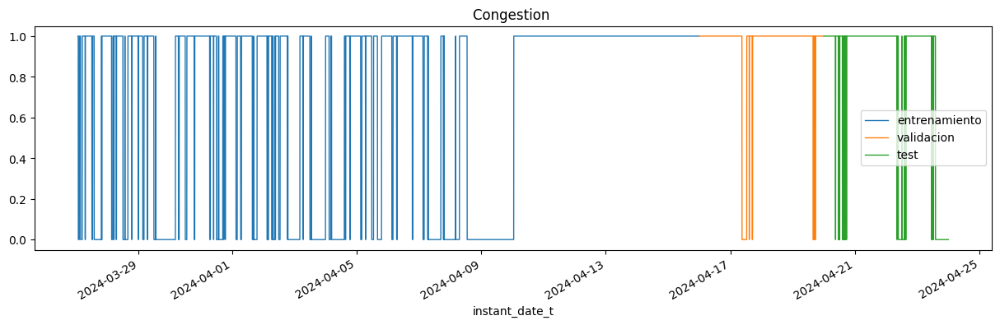

In [0]:
#Grafico de la serie temporal

#crea una nueva figura y un par de ejes (axes) dentro de la figura
fig, ax = plt.subplots(figsize=(15,4)) # figsize=(15,4) establece el tamaño de la figura en 15 unidades de ancho y 4 unidades de alto.

#Las series se colorean automáticamente según una paleta de colores predefinida por matplotlib
datos_train.congestion.plot(ax=ax, label="entrenamiento", linewidth=1)
datos_val.congestion.plot(ax=ax, label="validacion", linewidth=1)
datos_test.congestion.plot(ax=ax, label="test", linewidth=1)
ax.set_title('Congestion ')
ax.legend();

4.1.3 Grafico de Autocorrelacion 

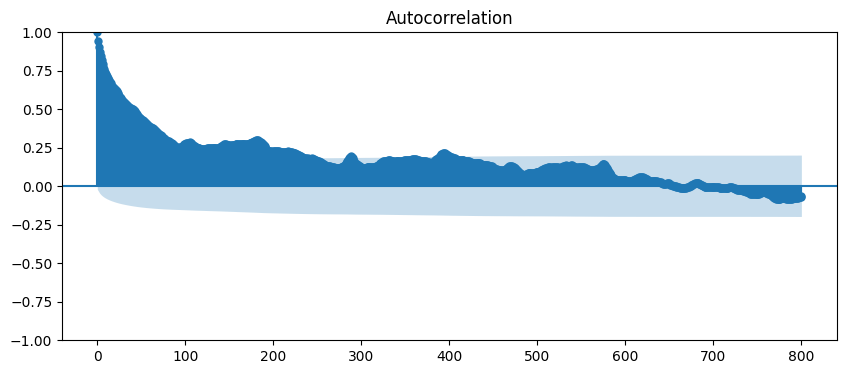

In [0]:
#Grafico autocorrelación

#Crea una figura y un conjunto de ejes (ax)
fig, ax = plt.subplots(figsize=(10,4))

#Aquí utilizamos la función plot_acf para trazar la función de autocorrelación
#ax=ax indica que el gráfico se dibujará en los ejes que has creado anteriormente. 
# lags=72 define el número máximo de intervalos de tiempo pasados que se considerarán al calcular la función de autocorrelación. 
plot_acf(datos_cong_balanceado.congestion, ax=ax, lags=800)
plt.show()

#Podemos ver que la correlacion de la prediccion esta altamente correlaciona con el la demanda en el dia anterior a la misma hora.

/databricks/python/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


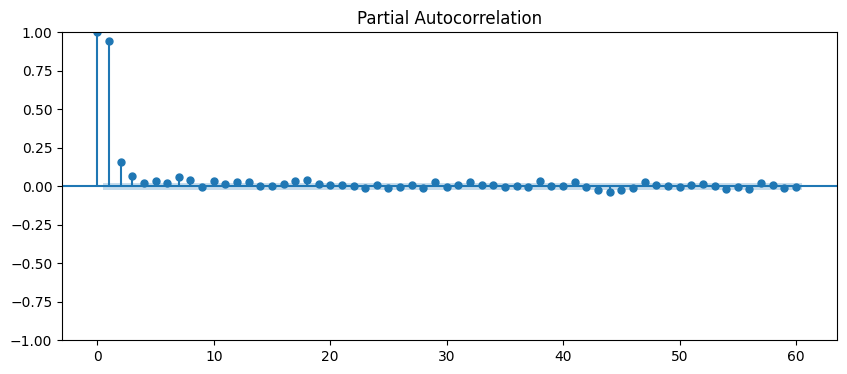

In [0]:
#Grafico de Autocorrelacion parcial
fig, ax = plt.subplots(figsize=(10,4))

#plot_pacf para trazar la función de autocorrelación parcial
plot_pacf(datos_cong_balanceado.congestion, ax=ax, lags=60)

# PACF muestra la correlación directa entre la serie y sus 
# valores anteriores hasta 60 intervalos de tiempo atrás, teniendo en cuenta las correlaciones indirecta
plt.show()

#### 4.1.4 Algoritmo de LGBM(Ligth Bosting)

In [0]:
# Modelado y Forescasting
from lightgbm import LGBMRegressor, LGBMClassifier    #Regressor mas potente de gradient bossting
from skforecast.ForecasterAutoreg import ForecasterAutoreg  # Modelo autoregressivo
from skforecast.model_selection import grid_search_forecaster # Encontrar los mejores hiperparametros(optimizar el modelo)
from skforecast.model_selection import backtesting_forecaster # Evaluar el modelo si hubiese estado en produccion

In [0]:
#Crear  y entrenar forescaster
forescaster = ForecasterAutoreg(
    regressor=LGBMClassifier(max_depth=3, learning_rate=0.1, n_estimators=70),
    lags= 5 #[1, 2, 3, 24]
)
forescaster #forescaster.summary()

Entrenamiento del Forescaster

In [0]:
forescaster.fit(y=datos_cong_balanceado.loc[:fin_validacion, 'congestion']) #Entrenamiento con conjuntos de train + validacion
forescaster

Predicciones

In [0]:
predicciones = forescaster.predict(steps=1000)
predicciones

py4j.clientserver INFO  Received command c on object id p0


2024-04-20 00:00:28   1.000000
2024-04-20 00:05:28   1.000000
2024-04-20 00:10:28   1.000000
2024-04-20 00:15:28   1.000000
2024-04-20 00:20:28   1.000000
2024-04-20 00:25:28   1.000000
2024-04-20 00:30:28   1.000000
2024-04-20 00:35:28   1.000000
2024-04-20 00:40:28   1.000000
2024-04-20 00:45:28   1.000000
2024-04-20 00:50:28   1.000000
2024-04-20 00:55:28   1.000000
2024-04-20 01:00:28   1.000000
2024-04-20 01:05:28   1.000000
2024-04-20 01:10:28   1.000000
2024-04-20 01:15:28   1.000000
2024-04-20 01:20:28   1.000000
2024-04-20 01:25:28   1.000000
2024-04-20 01:30:28   1.000000
2024-04-20 01:35:28   1.000000
2024-04-20 01:40:28   1.000000
2024-04-20 01:45:28   1.000000
2024-04-20 01:50:28   1.000000
2024-04-20 01:55:28   1.000000
2024-04-20 02:00:28   1.000000
2024-04-20 02:05:28   1.000000
2024-04-20 02:10:28   1.000000
2024-04-20 02:15:28   1.000000
2024-04-20 02:20:28   1.000000
2024-04-20 02:25:28   1.000000
2024-04-20 02:30:28   1.000000
2024-04-20 02:35:28   1.000000
2024-04-

In [0]:
forescaster.last_window

py4j.clientserver INFO  Received command c on object id p0


instant_date_t
2024-04-19 23:35:28    1
2024-04-19 23:40:28    1
2024-04-19 23:45:28    1
2024-04-19 23:50:28    1
2024-04-19 23:55:28    1
Freq: 5T, Name: congestion, dtype: int64

In [0]:
# Obtener las probabilidades para las predicciones
probabilidades = forescaster.regressor.predict_proba(forescaster.last_window.values.reshape(1, -1))

py4j.clientserver INFO  Received command c on object id p0


In [0]:
probabilidades

py4j.clientserver INFO  Received command c on object id p0


array([[0.01080405, 0.98919595]])

In [0]:
# Inicializar una lista para almacenar las probabilidades para cada predicción
probabilidades_predicciones = []

# Iterar sobre las predicciones y obtener las probabilidades para cada una
for pred in predicciones:
    # Obtener las probabilidades para la predicción actual
    proba = forescaster.regressor.predict_proba(forescaster.last_window.values.reshape(1, -1))
    probabilidades_predicciones.append(proba)

py4j.clientserver INFO  Received command c on object id p0


In [0]:
probabilidades_predicciones

[array([[0.01080405, 0.98919595]]),
 array([[0.01080405, 0.98919595]]),
 array([[0.01080405, 0.98919595]]),
 array([[0.01080405, 0.98919595]]),
 array([[0.01080405, 0.98919595]]),
 array([[0.01080405, 0.98919595]]),
 array([[0.01080405, 0.98919595]]),
 array([[0.01080405, 0.98919595]]),
 array([[0.01080405, 0.98919595]]),
 array([[0.01080405, 0.98919595]]),
 array([[0.01080405, 0.98919595]]),
 array([[0.01080405, 0.98919595]]),
 array([[0.01080405, 0.98919595]]),
 array([[0.01080405, 0.98919595]]),
 array([[0.01080405, 0.98919595]]),
 array([[0.01080405, 0.98919595]]),
 array([[0.01080405, 0.98919595]]),
 array([[0.01080405, 0.98919595]]),
 array([[0.01080405, 0.98919595]]),
 array([[0.01080405, 0.98919595]]),
 array([[0.01080405, 0.98919595]]),
 array([[0.01080405, 0.98919595]]),
 array([[0.01080405, 0.98919595]]),
 array([[0.01080405, 0.98919595]]),
 array([[0.01080405, 0.98919595]]),
 array([[0.01080405, 0.98919595]]),
 array([[0.01080405, 0.98919595]]),
 array([[0.01080405, 0.98919

#### 4.1.5 Algoritmo Time Series Forest Clasification 

In [0]:
#!pip install sktime

py4j.clientserver INFO  Received command c on object id p0


In [0]:
#pip install --upgrade pip

In [0]:
from sktime.classification.interval_based import TimeSeriesForestClassifier
from sktime.datasets import load_arrow_head
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

py4j.clientserver INFO  Received command c on object id p0


In [0]:
datos_cong_balanceado.tail()

py4j.clientserver INFO  Received command c on object id p0


,congestion,eq_id,x,y,z,bearing_t,speed_t,gear_t,pitch_t,roll_t,n_sat,tramosidsnew_t,id_trabaj_t,tempeje1_t,tempeje2_t,tempeje3_t,tempeje4_t,tempeje5_t,tempeje6_t,presllanta1_t,presllanta2_t,presllanta3_t,presllanta4_t,presllanta5_t,presllanta6_t,isload_t,tonelaje_t,marcha_t,latitude_t,longitud_t,precisiongps_t,direccion_t,combustibleint_t,frecuencia_t,templlanta1_t,templlanta2_t,templlanta3_t,templlanta4_t,templlanta5_t,templlanta6_t,bateriasensorllanta1_t,bateriasensorllanta2_t,bateriasensorllanta3_t,bateriasensorllanta4_t,bateriasensorllanta5_t,bateriasensorllanta6_t,segment_angle_t,fuel_rate_t,id_equipment,id_path,id_worker,start_xcoorint,start_ycoorint,start_zcoorint,end_xcoorint,end_ycoorint,end_zcoorint,alert_level,id_equipment_congestion,id_equipo,ENG_SPD,BOOST_PRES,SYS_VOLTAGE,ENG_OIL_PRES,THROTTL_POS,GROUND_SPD,AMB_AIR_TEMP,AIR_FLTR,HI_BOOST_PRES,ENG_COOL_TEMP,RT_LT_EXH_TEMP,LO_BOOST_PRES,LCKUP_SLIP,TRN_LUBE_TEMP,DIFF_LUBE_PRES,DIFF_TEMP,AUTO_LUBE,TRN_OUT_SPD,TC_OUT_TEMP,Gear,BRK/AIR_PRES,BRK_STROKE,RETARDER,RETARDER_MODE,RTF_LTF_BRKTEMP,RTR_LTR_BRKTEMP,RT_F_BRK_TEMP,RT_R_BRK_TEMP,LT_R_BRK_TEMP,SERV_BRK_STAT,PAYLOAD,Z_Coor,Tire_Press_N4,Hourmeter_MSPU,Lon_Coor,Speed_GPS,Direction,Lat_Coor,Tire_Press_N6,Lat,year,mes,dia,hora,minuto
instant_date_t,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2024-04-23 23:35:28,0,61,5604653,6666973,81290,87,4465,0,-515,24,12,-1,671,84,83,82,82,0,0,0,0,0,0,0,0,0,0,0,-15210724,-75124359,300,87,79,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,61,1579.500000,8.000000,0.000000,488.000000,0.000000,47.000000,19.500000,0.500000,0.000000,82.000000,-6.000000,0.000000,0.000000,92.000000,314.000000,83.000000,0.000000,1880.000000,84.000000,0.000000,905.000000,0.000000,0.000000,1.000000,0.000000,2.000000,85.000000,91.000000,90.000000,0.000000,0.000000,809.700000,-75.120000,88.720000,-15.210000,-15.210713,-75.124000,48668208.000000,831836400.000000,80970.000000,2024,4,23,23,35
2024-04-23 23:40:28,0,61,5668063,6690182,59090,233,2948,5,-342,-125,12,-1,671,95,94,98,101,0,0,0,0,0,0,0,0,0,0,5,-15208629,-75118453,410,233,80,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,61,1894.000000,6.000000,0.000000,498.000000,0.000000,30.500000,20.200000,0.500000,0.000000,83.000000,3.000000,0.000000,0.000000,91.000000,212.000000,84.000000,0.000000,1245.000000,99.000000,5.000000,832.000000,0.000000,0.000000,2.000000,0.000000,-2.000000,93.000000,97.000000,100.000000,0.000000,0.000000,589.090000,-75.110000,231.160000,-15.200000,-15.208766,-75.118632,48725884.000000,831858000.000000,58910.000000,2024,4,23,23,40
2024-04-23 23:45:28,0,61,5779291,6787727,49990,71,1,0,-59,10,12,-1,671,93,92,87,87,0,0,0,0,0,0,0,0,0,0,0,-15199815,-75108093,395,71,78,2,0,0,0,0,0,0,0,0,0,0,0,0,0,196,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,61,700.500000,2.000000,0.000000,350.000000,0.000000,0.000000,21.500000,0.000000,0.000000,83.000000,4.000000,0.000000,0.000000,90.000000,0.000000,83.000000,0.000000,0.000000,91.000000,0.000000,778.000000,0.000000,0.000000,1.000000,1.000000,-1.000000,93.000000,87.000000,87.000000,0.000000,0.000000,499.790000,-75.100000,294.350000,-15.190000,-15.199818,-75.108096,48839016.000000,831957000.000000,49980.000000,2024,4,23,23,45
2024-04-23 23:50:28,0,61,5779455,6787822,49960,71,1,0,-47,0,12,-1,671,86,85,82,82,0,0,0,0,0,0,0,0,0,0,0,-15199807,-75108078,450,71,79,2,0,0,0,0,0,0,0,0,0,0,0,0,0,183,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,61,701.000000,0.000000,0.000000,370.000000,0.000000,0.000000,20.790000,0.000000,0.000000,80.000000,11.000000,0.000000,0.000000,88.000000,0.000000,74.000000,0.000000,0.000000,86.000000,0.000000,770.000000,0.000000,0.000000,1.000000,0.000000,0.000000,86.000000

Seleccionamos la variable target y las variables predictoras

In [0]:
# Reformatear los datos en un formato compatible con sktime
X = datos_cong_balanceado[['x', 'y']].values.reshape(-1, 1, 2)

# Tomar las etiquetas objetivo (y) como una serie temporal
y = datos_cong_balanceado['congestion']

py4j.clientserver INFO  Received command c on object id p0


In [0]:
#Ultimos registros del numpy array
X[-2:]

py4j.clientserver INFO  Received command c on object id p0


array([[[5779455, 6787822]],

       [[5768075, 6766351]]])

In [0]:
#Primeros registros del numpy array
X[:5]

py4j.clientserver INFO  Received command c on object id p0


array([[[      0,       0]],

       [[5857942, 6647009]],

       [[5858844, 6645047]],

       [[5861711, 6646863]],

       [[5880238, 6628391]]])

In [0]:
y[:5]

py4j.clientserver INFO  Received command c on object id p0


instant_date_t
2024-03-27 01:15:28    1
2024-03-27 01:20:28    1
2024-03-27 01:25:28    1
2024-03-27 01:30:28    1
2024-03-27 01:35:28    0
Freq: 5min, Name: congestion, dtype: int64

#### Entrenamiento del Modelo ML

In [0]:
fechas = datos_cong_balanceado.index
# Dividir los datos en conjunto de entrenamiento y conjunto de prueba
X_train, X_test, y_train, y_test, fechas_train, fechas_test = train_test_split(X, y, fechas, test_size=0.2, shuffle=False)
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False) # shuffle=False, los datos no se mezclarán y se dividirán #secuencialmente según el orden en el que aparecen en tus datos (adecuado para problemas de series temporales)
classifier = TimeSeriesForestClassifier()
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)
y_pred_probability = classifier.predict_proba(X_test)

py4j.clientserver INFO  Received command c on object id p0


In [0]:
fechas_train[:5]

py4j.clientserver INFO  Received command c on object id p0


DatetimeIndex(['2024-03-27 01:15:28', '2024-03-27 01:20:28',
               '2024-03-27 01:25:28', '2024-03-27 01:30:28',
               '2024-03-27 01:35:28'],
              dtype='datetime64[ns]', name='instant_date_t', freq=None)

In [0]:
X_train[-2:]

py4j.clientserver INFO  Received command c on object id p0


array([[[5914791, 6685673]],

       [[5914791, 6685673]]])

In [0]:
y_train[:5]

instant_date_t
2024-03-27 01:15:28    1
2024-03-27 01:20:28    1
2024-03-27 01:25:28    1
2024-03-27 01:30:28    1
2024-03-27 01:35:28    0
Freq: 5min, Name: congestion, dtype: int64

In [0]:
y_test[:5]

py4j.clientserver INFO  Received command c on object id p0


instant_date_t
2024-04-18 09:50:28    1
2024-04-18 09:55:28    1
2024-04-18 10:00:28    1
2024-04-18 10:05:28    1
2024-04-18 10:10:28    1
Freq: 5min, Name: congestion, dtype: int64

#### Solo nos quedamos con la columna de la derecha, Donde seria (Probabilidad de que suceda la "Clase 1" en este caso SI HAY CONGESTION)

In [0]:
import numpy as np
import sys

# Suponiendo que y_pred_probability es tu matriz de probabilidades
y_pred_columna_derecha = y_pred_probability[:, 1]

# Establecer la opción de impresión para mostrar el array completo
np.set_printoptions(threshold=sys.maxsize)

# Imprimir el array completo de probabilidades
print(y_pred_columna_derecha)

py4j.clientserver INFO  Received command c on object id p0


[1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         0.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         

In [0]:
accuracy_score(y_test, y_pred)

py4j.clientserver INFO  Received command c on object id p0


0.6298136645962733

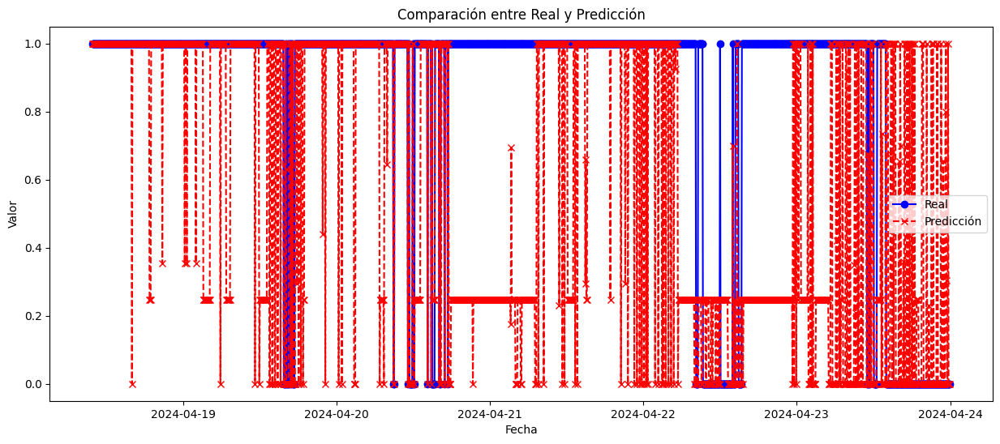

In [0]:
import matplotlib.pyplot as plt

# Crea la figura con el tamaño especificado
plt.figure(figsize=(15, 6))

# Graficar las predicciones
plt.plot(fechas_test, y_test, linestyle='-', marker='o', color='blue', label='Real')
plt.plot(fechas_test, y_pred_columna_derecha, linestyle='--', marker='x', color='red', label='Predicción')
plt.xlabel('Fecha')
plt.ylabel('Valor')
plt.title('Comparación entre Real y Predicción')
plt.legend()
plt.show()


py4j.clientserver INFO  Received command c on object id p0


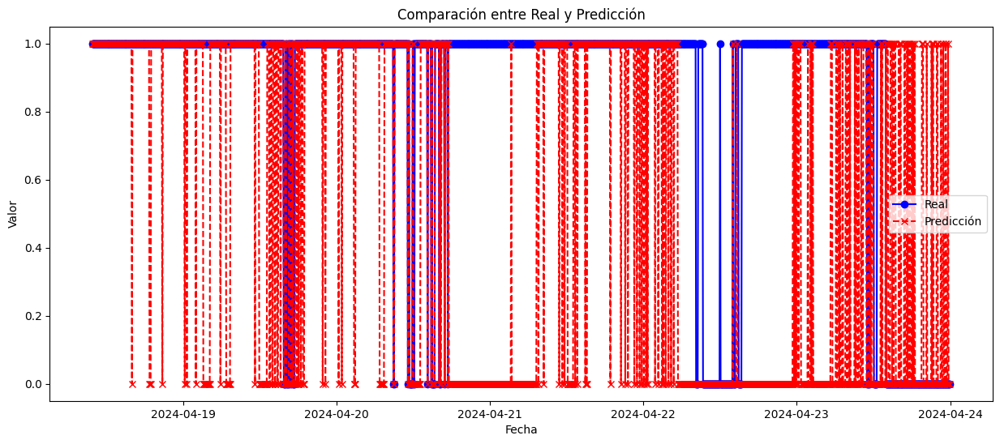

In [0]:
import matplotlib.pyplot as plt

# Crea la figura con el tamaño especificado
plt.figure(figsize=(15, 6))

# Graficar las predicciones
plt.plot(fechas_test, y_test, linestyle='-', marker='o', color='blue', label='Real')
plt.plot(fechas_test, y_pred, linestyle='--', marker='x', color='red', label='Predicción')
plt.xlabel('Fecha')
plt.ylabel('Valor')
plt.title('Comparación entre Real y Predicción')
plt.legend()
plt.show()

In [0]:
datos_cong_balanceado.tail()

py4j.clientserver INFO  Received command c on object id p0


,congestion,eq_id,x,y,z,bearing_t,speed_t,gear_t,pitch_t,roll_t,n_sat,tramosidsnew_t,id_trabaj_t,tempeje1_t,tempeje2_t,tempeje3_t,tempeje4_t,tempeje5_t,tempeje6_t,presllanta1_t,presllanta2_t,presllanta3_t,presllanta4_t,presllanta5_t,presllanta6_t,isload_t,tonelaje_t,marcha_t,latitude_t,longitud_t,precisiongps_t,direccion_t,combustibleint_t,frecuencia_t,templlanta1_t,templlanta2_t,templlanta3_t,templlanta4_t,templlanta5_t,templlanta6_t,bateriasensorllanta1_t,bateriasensorllanta2_t,bateriasensorllanta3_t,bateriasensorllanta4_t,bateriasensorllanta5_t,bateriasensorllanta6_t,segment_angle_t,fuel_rate_t,id_equipment,id_path,id_worker,start_xcoorint,start_ycoorint,start_zcoorint,end_xcoorint,end_ycoorint,end_zcoorint,alert_level,id_equipment_congestion,id_equipo,ENG_SPD,BOOST_PRES,SYS_VOLTAGE,ENG_OIL_PRES,THROTTL_POS,GROUND_SPD,AMB_AIR_TEMP,AIR_FLTR,HI_BOOST_PRES,ENG_COOL_TEMP,RT_LT_EXH_TEMP,LO_BOOST_PRES,LCKUP_SLIP,TRN_LUBE_TEMP,DIFF_LUBE_PRES,DIFF_TEMP,AUTO_LUBE,TRN_OUT_SPD,TC_OUT_TEMP,Gear,BRK/AIR_PRES,BRK_STROKE,RETARDER,RETARDER_MODE,RTF_LTF_BRKTEMP,RTR_LTR_BRKTEMP,RT_F_BRK_TEMP,RT_R_BRK_TEMP,LT_R_BRK_TEMP,SERV_BRK_STAT,PAYLOAD,Z_Coor,Tire_Press_N4,Hourmeter_MSPU,Lon_Coor,Speed_GPS,Direction,Lat_Coor,Tire_Press_N6,Lat,year,mes,dia,hora,minuto
instant_date_t,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2024-04-23 23:35:28,0,61,5604653,6666973,81290,87,4465,0,-515,24,12,-1,671,84,83,82,82,0,0,0,0,0,0,0,0,0,0,0,-15210724,-75124359,300,87,79,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,61,1579.500000,8.000000,0.000000,488.000000,0.000000,47.000000,19.500000,0.500000,0.000000,82.000000,-6.000000,0.000000,0.000000,92.000000,314.000000,83.000000,0.000000,1880.000000,84.000000,0.000000,905.000000,0.000000,0.000000,1.000000,0.000000,2.000000,85.000000,91.000000,90.000000,0.000000,0.000000,809.700000,-75.120000,88.720000,-15.210000,-15.210713,-75.124000,48668208.000000,831836400.000000,80970.000000,2024,4,23,23,35
2024-04-23 23:40:28,0,61,5668063,6690182,59090,233,2948,5,-342,-125,12,-1,671,95,94,98,101,0,0,0,0,0,0,0,0,0,0,5,-15208629,-75118453,410,233,80,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,61,1894.000000,6.000000,0.000000,498.000000,0.000000,30.500000,20.200000,0.500000,0.000000,83.000000,3.000000,0.000000,0.000000,91.000000,212.000000,84.000000,0.000000,1245.000000,99.000000,5.000000,832.000000,0.000000,0.000000,2.000000,0.000000,-2.000000,93.000000,97.000000,100.000000,0.000000,0.000000,589.090000,-75.110000,231.160000,-15.200000,-15.208766,-75.118632,48725884.000000,831858000.000000,58910.000000,2024,4,23,23,40
2024-04-23 23:45:28,0,61,5779291,6787727,49990,71,1,0,-59,10,12,-1,671,93,92,87,87,0,0,0,0,0,0,0,0,0,0,0,-15199815,-75108093,395,71,78,2,0,0,0,0,0,0,0,0,0,0,0,0,0,196,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,61,700.500000,2.000000,0.000000,350.000000,0.000000,0.000000,21.500000,0.000000,0.000000,83.000000,4.000000,0.000000,0.000000,90.000000,0.000000,83.000000,0.000000,0.000000,91.000000,0.000000,778.000000,0.000000,0.000000,1.000000,1.000000,-1.000000,93.000000,87.000000,87.000000,0.000000,0.000000,499.790000,-75.100000,294.350000,-15.190000,-15.199818,-75.108096,48839016.000000,831957000.000000,49980.000000,2024,4,23,23,45
2024-04-23 23:50:28,0,61,5779455,6787822,49960,71,1,0,-47,0,12,-1,671,86,85,82,82,0,0,0,0,0,0,0,0,0,0,0,-15199807,-75108078,450,71,79,2,0,0,0,0,0,0,0,0,0,0,0,0,0,183,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,61,701.000000,0.000000,0.000000,370.000000,0.000000,0.000000,20.790000,0.000000,0.000000,80.000000,11.000000,0.000000,0.000000,88.000000,0.000000,74.000000,0.000000,0.000000,86.000000,0.000000,770.000000,0.000000,0.000000,1.000000,0.000000,0.000000,86.000000

In [0]:
window_size = 5

# Seleccionar solo las variables específicas que deseas incluir en X_future
variables_seleccionadas = ['x', 'y']

# Obtener las últimas observaciones de las variables seleccionadas
X_future = datos_cong_balanceado.tail(window_size)[variables_seleccionadas].values

X_future

py4j.clientserver INFO  Received command c on object id p0


array([[5604653, 6666973],
       [5668063, 6690182],
       [5779291, 6787727],
       [5779455, 6787822],
       [5768075, 6766351]])

In [0]:
len(X_future)

py4j.clientserver INFO  Received command c on object id p0


5

In [0]:
X_future[2:2+window_size]

array([[5779291, 6787727],
       [5779455, 6787822],
       [5768075, 6766351]])

In [0]:
X_window2 = X_future[4:4+window_size]
X_window2

py4j.clientserver INFO  Received command c on object id p0


array([[5768075, 6766351]])

In [0]:
X_window2.reshape(1, -1)

py4j.clientserver INFO  Received command c on object id p0


array([[5768075, 6766351]])

In [0]:
datos_cong_balanceado.tail()

py4j.clientserver INFO  Received command c on object id p0


,congestion,eq_id,x,y,z,bearing_t,speed_t,gear_t,pitch_t,roll_t,n_sat,tramosidsnew_t,id_trabaj_t,tempeje1_t,tempeje2_t,tempeje3_t,tempeje4_t,tempeje5_t,tempeje6_t,presllanta1_t,presllanta2_t,presllanta3_t,presllanta4_t,presllanta5_t,presllanta6_t,isload_t,tonelaje_t,marcha_t,latitude_t,longitud_t,precisiongps_t,direccion_t,combustibleint_t,frecuencia_t,templlanta1_t,templlanta2_t,templlanta3_t,templlanta4_t,templlanta5_t,templlanta6_t,bateriasensorllanta1_t,bateriasensorllanta2_t,bateriasensorllanta3_t,bateriasensorllanta4_t,bateriasensorllanta5_t,bateriasensorllanta6_t,segment_angle_t,fuel_rate_t,id_equipment,id_path,id_worker,start_xcoorint,start_ycoorint,start_zcoorint,end_xcoorint,end_ycoorint,end_zcoorint,alert_level,id_equipment_congestion,id_equipo,ENG_SPD,BOOST_PRES,SYS_VOLTAGE,ENG_OIL_PRES,THROTTL_POS,GROUND_SPD,AMB_AIR_TEMP,AIR_FLTR,HI_BOOST_PRES,ENG_COOL_TEMP,RT_LT_EXH_TEMP,LO_BOOST_PRES,LCKUP_SLIP,TRN_LUBE_TEMP,DIFF_LUBE_PRES,DIFF_TEMP,AUTO_LUBE,TRN_OUT_SPD,TC_OUT_TEMP,Gear,BRK/AIR_PRES,BRK_STROKE,RETARDER,RETARDER_MODE,RTF_LTF_BRKTEMP,RTR_LTR_BRKTEMP,RT_F_BRK_TEMP,RT_R_BRK_TEMP,LT_R_BRK_TEMP,SERV_BRK_STAT,PAYLOAD,Z_Coor,Tire_Press_N4,Hourmeter_MSPU,Lon_Coor,Speed_GPS,Direction,Lat_Coor,Tire_Press_N6,Lat,year,mes,dia,hora,minuto
instant_date_t,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2024-04-23 23:35:28,0,61,5604653,6666973,81290,87,4465,0,-515,24,12,-1,671,84,83,82,82,0,0,0,0,0,0,0,0,0,0,0,-15210724,-75124359,300,87,79,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,61,1579.500000,8.000000,0.000000,488.000000,0.000000,47.000000,19.500000,0.500000,0.000000,82.000000,-6.000000,0.000000,0.000000,92.000000,314.000000,83.000000,0.000000,1880.000000,84.000000,0.000000,905.000000,0.000000,0.000000,1.000000,0.000000,2.000000,85.000000,91.000000,90.000000,0.000000,0.000000,809.700000,-75.120000,88.720000,-15.210000,-15.210713,-75.124000,48668208.000000,831836400.000000,80970.000000,2024,4,23,23,35
2024-04-23 23:40:28,0,61,5668063,6690182,59090,233,2948,5,-342,-125,12,-1,671,95,94,98,101,0,0,0,0,0,0,0,0,0,0,5,-15208629,-75118453,410,233,80,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,61,1894.000000,6.000000,0.000000,498.000000,0.000000,30.500000,20.200000,0.500000,0.000000,83.000000,3.000000,0.000000,0.000000,91.000000,212.000000,84.000000,0.000000,1245.000000,99.000000,5.000000,832.000000,0.000000,0.000000,2.000000,0.000000,-2.000000,93.000000,97.000000,100.000000,0.000000,0.000000,589.090000,-75.110000,231.160000,-15.200000,-15.208766,-75.118632,48725884.000000,831858000.000000,58910.000000,2024,4,23,23,40
2024-04-23 23:45:28,0,61,5779291,6787727,49990,71,1,0,-59,10,12,-1,671,93,92,87,87,0,0,0,0,0,0,0,0,0,0,0,-15199815,-75108093,395,71,78,2,0,0,0,0,0,0,0,0,0,0,0,0,0,196,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,61,700.500000,2.000000,0.000000,350.000000,0.000000,0.000000,21.500000,0.000000,0.000000,83.000000,4.000000,0.000000,0.000000,90.000000,0.000000,83.000000,0.000000,0.000000,91.000000,0.000000,778.000000,0.000000,0.000000,1.000000,1.000000,-1.000000,93.000000,87.000000,87.000000,0.000000,0.000000,499.790000,-75.100000,294.350000,-15.190000,-15.199818,-75.108096,48839016.000000,831957000.000000,49980.000000,2024,4,23,23,45
2024-04-23 23:50:28,0,61,5779455,6787822,49960,71,1,0,-47,0,12,-1,671,86,85,82,82,0,0,0,0,0,0,0,0,0,0,0,-15199807,-75108078,450,71,79,2,0,0,0,0,0,0,0,0,0,0,0,0,0,183,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,61,701.000000,0.000000,0.000000,370.000000,0.000000,0.000000,20.790000,0.000000,0.000000,80.000000,11.000000,0.000000,0.000000,88.000000,0.000000,74.000000,0.000000,0.000000,86.000000,0.000000,770.000000,0.000000,0.000000,1.000000,0.000000,0.000000,86.000000

In [0]:
# Obtener los últimos cinco pasos anteriores de las dos variables para el pronóstico
window_size = 5
X_future = datos_cong_balanceado.tail(window_size).values

# Realizar el pronóstico para cada paso de tiempo futuro
y_pred_future = []

for i in range(len(X_future)):
    # Obtener las últimas cinco observaciones de las dos variables
    X_window = X_future[i:i+window_size]
    
    # Realizar la predicción de congestión con el clasificador entrenado
    congestion_pred = classifier.predict_proba(X_window.reshape(1, -1))
    
    # Agregar la predicción a la lista de pronósticos futuros
    y_pred_future.append(congestion_pred)

# Convertir la lista de pronósticos futuros en un arreglo numpy
y_pred_future = np.array(y_pred_future)
# Suponiendo que y_pred_probability es tu matriz de probabilidades
y_pred_future = y_pred_future[:, :, 1]
# Visualizar las predicciones futuras
print("Predicciones futuras de congestión:", y_pred_future)

Predicciones futuras de congestión: [[0.24813433]
 [0.24813433]
 [0.24813433]
 [0.24813433]
 [0.24813433]]


In [0]:
len(X_future)

py4j.clientserver INFO  Received command c on object id p0


5

In [0]:
# Preparar una lista para almacenar las predicciones futuras
y_pred_future2 = []

# Definir el tamaño de la ventana de predicción futura
window_size2 = 1  # Por ejemplo, predecir los próximos 5 pasos

variables_seleccionadas = ['x', 'y']

# Obtener las últimas observaciones de las variables seleccionadas
X_future = datos_cong_balanceado.tail(window_size)[variables_seleccionadas].values

#X_future = datos_cong_balanceado.tail(window_size).values

# Iterar a través de tus datos futuros
for i in range(len(X_future) - window_size2 + 1):
    # Obtener la ventana de datos actual
    X_window = X_future[i:i+window_size]
    
    # Realizar la predicción de congestión con tu modelo clasificador
    congestion_pred = classifier.predict_proba(X_window.reshape(1, -1))  # Ajustar la forma según tu modelo
    
    # Tomar solo la última predicción y agregarla a la lista
    y_pred_future2.append(congestion_pred[-1])

# Convertir la lista de predicciones en un arreglo numpy
y_pred_future2 = np.array(y_pred_future2)
# Suponiendo que y_pred_probability es tu matriz de probabilidades
y_pred_future2 = y_pred_future2[:, 1]

# Visualizar las predicciones
print("Predicciones futuras:", y_pred_future2)

py4j.clientserver INFO  Received command c on object id p0


Predicciones futuras: [0. 1. 0. 0. 0.]


In [0]:
datos_cong_balanceado.tail(10).values

array([[ 0.0000000e+00,  6.1000000e+01,  5.7683210e+06,  6.7666250e+06,
         5.1290000e+04,  2.1300000e+02,  1.0660000e+03,  2.0000000e+00,
         6.7100000e+02, -2.4100000e+02,  1.2000000e+01, -1.0000000e+00,
         6.7100000e+02,  8.5000000e+01,  8.4000000e+01,  8.1000000e+01,
         8.2000000e+01,  0.0000000e+00,  0.0000000e+00,  0.0000000e+00,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  0.0000000e+00,
         0.0000000e+00,  1.0000000e+00,  1.4010000e+03,  2.0000000e+00,
        -1.5201723e+07, -7.5109115e+07,  4.1000000e+02,  2.1300000e+02,
         8.2000000e+01,  2.0000000e+00,  0.0000000e+00,  0.0000000e+00,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  0.0000000e+00,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  0.0000000e+00,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  2.7310000e+03,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  0.0000000e+00,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  0.00000

In [0]:
datos_cong_balanceado.tail(2)[variables_seleccionadas].values

py4j.clientserver INFO  Received command c on object id p0


array([[5779455, 6787822],
       [5768075, 6766351]])

In [0]:
variables_seleccionadas = ['x', 'y','z']

# Obtener las últimas observaciones de las variables seleccionadas
X_future_single_step = datos_cong_balanceado.tail(1)[variables_seleccionadas].values

# Realizar la predicción para un solo paso hacia adelante
congestion_pred_single_step = classifier.predict_proba(X_future_single_step)


# Visualizar la predicción
print("Probabilidad de congestión para el próximo paso:", congestion_pred_single_step)

py4j.clientserver INFO  Received command c on object id p0


Probabilidad de congestión para el próximo paso: [[1. 0.]]


In [0]:
X_future_single_step

py4j.clientserver INFO  Received command c on object id p0


array([[5768075, 6766351,   50860]])

XGB

In [0]:
import xgboost as xgb
from sklearn.model_selection import train_test_split

# Supongamos que tienes tus datos de series temporales en X_time_series y tus variables exógenas en X_exogenous
# Supongamos que tienes tus etiquetas en y

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train_ts, X_test_ts, X_train_exog, X_test_exog, y_train, y_test = train_test_split(X_time_series, X_exogenous, y, test_size=0.2, shuffle=False)

# Crear una matriz DMatrix para XGBoost
train_dmatrix = xgb.DMatrix(data=X_train_ts, label=y_train)
test_dmatrix = xgb.DMatrix(data=X_test_ts)

# Definir los parámetros del modelo
params = {
    'objective': 'binary:logistic',  # para problemas de clasificación binaria
}

# Entrenar el modelo XGBoost
model = xgb.train(params=params, dtrain=train_dmatrix)

# Realizar predicciones de probabilidades de clase
y_pred_probs = model.predict(test_dmatrix)

print("Predicciones de probabilidades de clase:", y_pred_probs)


### Algoritmo XGB Time Series

In [0]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error, accuracy_score
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

In [0]:
datos_cong_balanceado.head()

,congestion,eq_id,x,y,z,bearing_t,speed_t,gear_t,pitch_t,roll_t,n_sat,tramosidsnew_t,id_trabaj_t,tempeje1_t,tempeje2_t,tempeje3_t,tempeje4_t,tempeje5_t,tempeje6_t,presllanta1_t,presllanta2_t,presllanta3_t,presllanta4_t,presllanta5_t,presllanta6_t,isload_t,tonelaje_t,marcha_t,latitude_t,longitud_t,precisiongps_t,direccion_t,combustibleint_t,frecuencia_t,templlanta1_t,templlanta2_t,templlanta3_t,templlanta4_t,templlanta5_t,templlanta6_t,bateriasensorllanta1_t,bateriasensorllanta2_t,bateriasensorllanta3_t,bateriasensorllanta4_t,bateriasensorllanta5_t,bateriasensorllanta6_t,segment_angle_t,fuel_rate_t,id_equipment,id_path,id_worker,start_xcoorint,start_ycoorint,start_zcoorint,end_xcoorint,end_ycoorint,end_zcoorint,alert_level,id_equipment_congestion,id_equipo,ENG_SPD,BOOST_PRES,SYS_VOLTAGE,ENG_OIL_PRES,THROTTL_POS,GROUND_SPD,AMB_AIR_TEMP,AIR_FLTR,HI_BOOST_PRES,ENG_COOL_TEMP,RT_LT_EXH_TEMP,LO_BOOST_PRES,LCKUP_SLIP,TRN_LUBE_TEMP,DIFF_LUBE_PRES,DIFF_TEMP,AUTO_LUBE,TRN_OUT_SPD,TC_OUT_TEMP,Gear,BRK/AIR_PRES,BRK_STROKE,RETARDER,RETARDER_MODE,RTF_LTF_BRKTEMP,RTR_LTR_BRKTEMP,RT_F_BRK_TEMP,RT_R_BRK_TEMP,LT_R_BRK_TEMP,SERV_BRK_STAT,PAYLOAD,Z_Coor,Tire_Press_N4,Hourmeter_MSPU,Lon_Coor,Speed_GPS,Direction,Lat_Coor,Tire_Press_N6,Lat,year,mes,dia,hora,minuto
instant_date_t,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2024-03-27 01:15:28,1,61,0,0,0,0,0,0,0,0,0,-1,671,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,100,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,3,27,1,15
2024-03-27 01:20:28,1,61,5857942,6647009,79260,0,0,0,43,33,12,-1,671,44,43,48,47,0,0,0,0,0,0,0,0,0,0,0,-15212541,-75100776,330,0,82,2,0,0,0,0,0,0,0,0,0,0,0,0,0,178,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,3,27,1,20
2024-03-27 01:25:28,1,61,5858844,6645047,79360,112,188,1,265,42,12,-1,671,49,49,51,50,0,0,0,0,0,0,0,0,0,0,1,-15212718,-75100692,419,112,81,2,0,0,0,0,0,0,0,0,0,0,0,0,0,299,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,3,27,1,25
2024-03-27 01:30:28,1,61,5861711,6646863,80280,186,1,0,-11,130,12,-1,671,51,51,54,54,0,0,0,0,0,0,0,0,0,0,0,-15212554,-75100425,330,186,81,2,0,0,0,0,0,0,0,0,0,0,0,0,0,174,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000

In [0]:
FEATURES = ['x','y','bearing_t','speed_t']

x = datos_cong_balanceado[FEATURES]
y = datos_cong_balanceado['congestion']

In [0]:

# Dividir los datos en conjunto de entrenamiento y conjunto de prueba
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, shuffle=False, random_state=1)
#shuffle=False, los datos no se mezclarán y se dividirán #secuencialmente según el orden(ideal para time series)

# Generamos los datasets de train y test
train  = pd.concat([X_train,y_train], axis=1)
test  = pd.concat([X_test,y_test], axis=1)

In [0]:
X_train.head()

,x,y,bearing_t,speed_t
instant_date_t,,,,
2024-03-27 01:15:28,0,0,0,0
2024-03-27 01:20:28,5857942,6647009,0,0
2024-03-27 01:25:28,5858844,6645047,112,188
2024-03-27 01:30:28,5861711,6646863,186,1
2024-03-27 01:35:28,5880238,6628391,46,166


In [0]:
xgb_model = xgb.XGBClassifier(n_estimators=300,max_depth=5,objective='binary:logistic',reg_alpha=0.1) #reg_alpha>>regulazrizacion Lasso educir la complejidad del modelo y evitar #el sobreajuste
#eval_set>>monitorear el rendimiento del modelo en los datos de evaluación durante el #entrenamiento
#objective='binary:logistic'> Para problemas de clasificacion binaria

xgb_model.fit(X_train,y_train,eval_set=[(X_train,y_train), (X_test,y_test)],eval_metric=['auc','error'],
              early_stopping_rounds=50,verbose=True)
#verbose=True >> Mostrar en pantalla las iteraciones
#'auc'>>AUC es una métrica que evalúa la capacidad del modelo para distinguir entre clases positivas y negativas
# 'error'>> cuanto se equivoca el modelo en predecir (100-error)
# logloss>>un logloss más bajo indica un mejor rendimiento del modelo.

[0]	validation_0-auc:0.94755	validation_0-error:0.19444	validation_1-auc:0.78762	validation_1-error:0.09938
[1]	validation_0-auc:0.95599	validation_0-error:0.11368	validation_1-auc:0.78844	validation_1-error:0.37205
[2]	validation_0-auc:0.95839	validation_0-error:0.11228	validation_1-auc:0.78745	validation_1-error:0.37888
[3]	validation_0-auc:0.95862	validation_0-error:0.10483	validation_1-auc:0.78480	validation_1-error:0.37950
[4]	validation_0-auc:0.96144	validation_0-error:0.10188	validation_1-auc:0.78562	validation_1-error:0.37702
[5]	validation_0-auc:0.96293	validation_0-error:0.09877	validation_1-auc:0.78886	validation_1-error:0.37640
[6]	validation_0-auc:0.96419	validation_0-error:0.09862	validation_1-auc:0.78227	validation_1-error:0.37516
[7]	validation_0-auc:0.96509	validation_0-error:0.09924	validation_1-auc:0.78996	validation_1-error:0.37702
[8]	validation_0-auc:0.96744	validation_0-error:0.09225	validation_1-auc:0.78431	validation_1-error:0.40124
[9]	validation_0-auc:0.96797

/local_disk0/.ephemeral_nfs/cluster_libraries/python/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/local_disk0/.ephemeral_nfs/cluster_libraries/python/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[38]	validation_0-auc:0.98037	validation_0-error:0.06523	validation_1-auc:0.81526	validation_1-error:0.37019
[39]	validation_0-auc:0.98091	validation_0-error:0.06259	validation_1-auc:0.81621	validation_1-error:0.37143
[40]	validation_0-auc:0.98114	validation_0-error:0.06197	validation_1-auc:0.81645	validation_1-error:0.37143
[41]	validation_0-auc:0.98150	validation_0-error:0.06150	validation_1-auc:0.81616	validation_1-error:0.37205
[42]	validation_0-auc:0.98174	validation_0-error:0.06119	validation_1-auc:0.81595	validation_1-error:0.37205
[43]	validation_0-auc:0.98226	validation_0-error:0.06072	validation_1-auc:0.81707	validation_1-error:0.37143
[44]	validation_0-auc:0.98249	validation_0-error:0.06088	validation_1-auc:0.81679	validation_1-error:0.37143
[45]	validation_0-auc:0.98257	validation_0-error:0.06088	validation_1-auc:0.81684	validation_1-error:0.37143
[46]	validation_0-auc:0.98290	validation_0-error:0.06057	validation_1-auc:0.81694	validation_1-error:0.37081
[47]	validation_0-a

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=300, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

Feature Importance

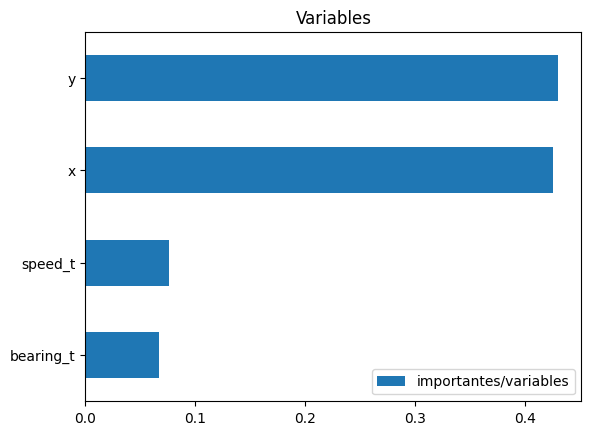

In [0]:
f1 = pd.DataFrame(data=xgb_model.feature_importances_,index=xgb_model.feature_names_in_,columns=['importantes/variables'])

f1.sort_values('importantes/variables').plot(kind='barh',title='Variables')
plt.show()

In [0]:
import sys
y_pred_prob = xgb_model.predict_proba(X_test)
y_pred_prob = np.round(y_pred_prob,3)
y_pred_prob = y_pred_prob[:, 1]  # Filtramos columna derecha, para dejar probabilidad que suceda CLASE 1(Conges)
y_pred = xgb_model.predict(X_test)

# Establecer la opción de impresión para mostrar el array completo
np.set_printoptions(threshold=sys.maxsize)
y_pred_prob

array([0.782, 0.782, 0.782, 0.782, 0.782, 0.782, 0.782, 0.782, 0.782,
       0.782, 0.782, 0.782, 0.782, 0.782, 0.782, 0.782, 0.782, 0.782,
       0.782, 0.782, 0.782, 0.782, 0.782, 0.782, 0.782, 0.782, 0.782,
       0.782, 0.782, 0.782, 0.782, 0.782, 0.782, 0.782, 0.782, 0.782,
       0.782, 0.782, 0.782, 0.782, 0.782, 0.782, 0.782, 0.782, 0.782,
       0.782, 0.782, 0.782, 0.782, 0.782, 0.782, 0.782, 0.782, 0.782,
       0.782, 0.783, 0.778, 0.778, 0.778, 0.782, 0.782, 0.778, 0.778,
       0.778, 0.783, 0.778, 0.778, 0.782, 0.783, 0.778, 0.778, 0.735,
       0.783, 0.778, 0.778, 0.782, 0.782, 0.778, 0.778, 0.783, 0.778,
       0.778, 0.778, 0.783, 0.778, 0.778, 0.778, 0.783, 0.778, 0.778,
       0.778, 0.778, 0.778, 0.778, 0.783, 0.778, 0.778, 0.782, 0.783,
       0.778, 0.778, 0.783, 0.783, 0.778, 0.778, 0.782, 0.778, 0.552,
       0.552, 0.552, 0.734, 0.734, 0.778, 0.778, 0.778, 0.778, 0.778,
       0.778, 0.778, 0.778, 0.778, 0.783, 0.735, 0.778, 0.778, 0.783,
       0.778, 0.778,

In [0]:
y_pred

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

Armamos nuetros datos para graficar las serie temporal original vs prediccion en el periodo de datos de Test

In [0]:
test["prediction-prob"] = y_pred_prob  #y_pred en dimension 1d
test["prediction"] = y_pred  #y_pred en dimension 1d
datos_cong_balanceado = datos_cong_balanceado.merge(test[['prediction-prob','prediction']], how='left', left_index=True,right_index=True) #left_index=True, right_index=True > la fusión se realizará basándose índices de las filas
datos_cong_balanceado.tail()

,congestion,eq_id,x,y,z,bearing_t,speed_t,gear_t,pitch_t,roll_t,n_sat,tramosidsnew_t,id_trabaj_t,tempeje1_t,tempeje2_t,tempeje3_t,tempeje4_t,tempeje5_t,tempeje6_t,presllanta1_t,presllanta2_t,presllanta3_t,presllanta4_t,presllanta5_t,presllanta6_t,isload_t,tonelaje_t,marcha_t,latitude_t,longitud_t,precisiongps_t,direccion_t,combustibleint_t,frecuencia_t,templlanta1_t,templlanta2_t,templlanta3_t,templlanta4_t,templlanta5_t,templlanta6_t,bateriasensorllanta1_t,bateriasensorllanta2_t,bateriasensorllanta3_t,bateriasensorllanta4_t,bateriasensorllanta5_t,bateriasensorllanta6_t,segment_angle_t,fuel_rate_t,id_equipment,id_path,id_worker,start_xcoorint,start_ycoorint,start_zcoorint,end_xcoorint,end_ycoorint,end_zcoorint,alert_level,id_equipment_congestion,id_equipo,ENG_SPD,BOOST_PRES,SYS_VOLTAGE,ENG_OIL_PRES,THROTTL_POS,GROUND_SPD,AMB_AIR_TEMP,AIR_FLTR,HI_BOOST_PRES,ENG_COOL_TEMP,RT_LT_EXH_TEMP,LO_BOOST_PRES,LCKUP_SLIP,TRN_LUBE_TEMP,DIFF_LUBE_PRES,DIFF_TEMP,AUTO_LUBE,TRN_OUT_SPD,TC_OUT_TEMP,Gear,BRK/AIR_PRES,BRK_STROKE,RETARDER,RETARDER_MODE,RTF_LTF_BRKTEMP,RTR_LTR_BRKTEMP,RT_F_BRK_TEMP,RT_R_BRK_TEMP,LT_R_BRK_TEMP,SERV_BRK_STAT,PAYLOAD,Z_Coor,Tire_Press_N4,Hourmeter_MSPU,Lon_Coor,Speed_GPS,Direction,Lat_Coor,Tire_Press_N6,Lat,year,mes,dia,hora,minuto,prediction-prob,prediction
instant_date_t,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2024-04-23 23:35:28,0,61,5604653,6666973,81290,87,4465,0,-515,24,12,-1,671,84,83,82,82,0,0,0,0,0,0,0,0,0,0,0,-15210724,-75124359,300,87,79,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,61,1579.500000,8.000000,0.000000,488.000000,0.000000,47.000000,19.500000,0.500000,0.000000,82.000000,-6.000000,0.000000,0.000000,92.000000,314.000000,83.000000,0.000000,1880.000000,84.000000,0.000000,905.000000,0.000000,0.000000,1.000000,0.000000,2.000000,85.000000,91.000000,90.000000,0.000000,0.000000,809.700000,-75.120000,88.720000,-15.210000,-15.210713,-75.124000,48668208.000000,831836400.000000,80970.000000,2024,4,23,23,35,0.613000,1.000000
2024-04-23 23:40:28,0,61,5668063,6690182,59090,233,2948,5,-342,-125,12,-1,671,95,94,98,101,0,0,0,0,0,0,0,0,0,0,5,-15208629,-75118453,410,233,80,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,61,1894.000000,6.000000,0.000000,498.000000,0.000000,30.500000,20.200000,0.500000,0.000000,83.000000,3.000000,0.000000,0.000000,91.000000,212.000000,84.000000,0.000000,1245.000000,99.000000,5.000000,832.000000,0.000000,0.000000,2.000000,0.000000,-2.000000,93.000000,97.000000,100.000000,0.000000,0.000000,589.090000,-75.110000,231.160000,-15.200000,-15.208766,-75.118632,48725884.000000,831858000.000000,58910.000000,2024,4,23,23,40,0.659000,1.000000
2024-04-23 23:45:28,0,61,5779291,6787727,49990,71,1,0,-59,10,12,-1,671,93,92,87,87,0,0,0,0,0,0,0,0,0,0,0,-15199815,-75108093,395,71,78,2,0,0,0,0,0,0,0,0,0,0,0,0,0,196,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,61,700.500000,2.000000,0.000000,350.000000,0.000000,0.000000,21.500000,0.000000,0.000000,83.000000,4.000000,0.000000,0.000000,90.000000,0.000000,83.000000,0.000000,0.000000,91.000000,0.000000,778.000000,0.000000,0.000000,1.000000,1.000000,-1.000000,93.000000,87.000000,87.000000,0.000000,0.000000,499.790000,-75.100000,294.350000,-15.190000,-15.199818,-75.108096,48839016.000000,831957000.000000,49980.000000,2024,4,23,23,45,0.478000,0.000000
2024-04-23 23:50:28,0,61,5779455,6787822,49960,71,1,0,-47,0,12,-1,671,86,85,82,82,0,0,0,0,0,0,0,0,0,0,0,-15199807,-75108078,450,71,79,2,0,0,0,0,0,0,0,0,0,0,0,0,0,183,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,61,701.000000,0.000000,0.000000,370.000000,0.000000,0.000000,20.790000,0.000000,0.000000,80.000000,11.000000,0.000000,0.000000,88.000000,0.000000,74.000000,0.000000,0.000000,8

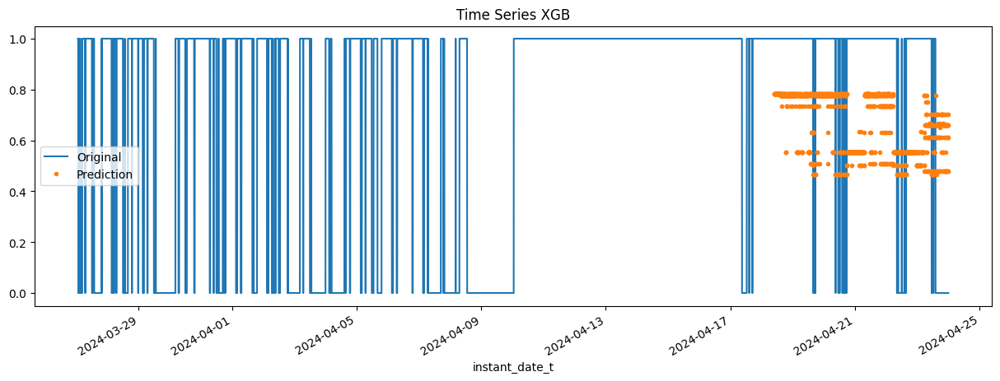

In [0]:
ax = datos_cong_balanceado[['congestion']].plot(figsize=(15,5)) #crea un gráfico de la columna 'congestion_x' del DF

# Se utiliza el ax=ax especifica que esta serie debe agregarse al mismo gráfico que se creó anteriormente
datos_cong_balanceado['prediction-prob'].plot(ax=ax, style='.') #style='.'
plt.legend(['Original','Prediction'])
ax.set_title('Time Series XGB')
plt.show()

In [0]:
test.index.max()

Timestamp('2024-04-23 23:55:28')

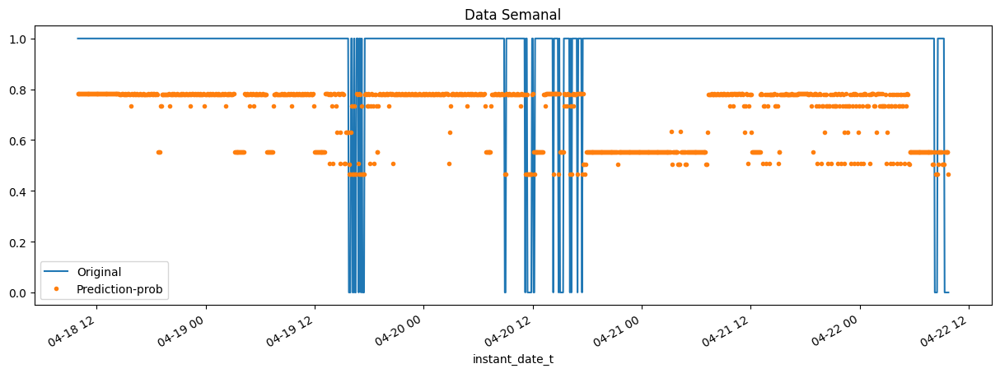

In [0]:
ax = datos_cong_balanceado.loc[(datos_cong_balanceado.index > '2024-04-18 09:50:28') & (datos_cong_balanceado.index < '2024-04-22 09:50:28')]['congestion'].plot(figsize=(15,5), title='Data Semanal')
datos_cong_balanceado.loc[(datos_cong_balanceado.index > '2024-04-18 09:50:28') & (datos_cong_balanceado.index < '2024-04-22 09:50:28')]['prediction-prob'].plot(style='.')
plt.legend(['Original','Prediction-prob'])
plt.show()

Medimos el Performance del Modelo (En este caso con Accuracy, por ser un modelo de Clasificacion)

In [0]:
from sklearn.metrics import accuracy_score, confusion_matrix
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.9006211180124224


              precision    recall  f1-score   support

           0     0.8544    0.3777    0.5238       233
           1     0.9038    0.9891    0.9445      1377

    accuracy                         0.9006      1610
   macro avg     0.8791    0.6834    0.7342      1610
weighted avg     0.8966    0.9006    0.8836      1610



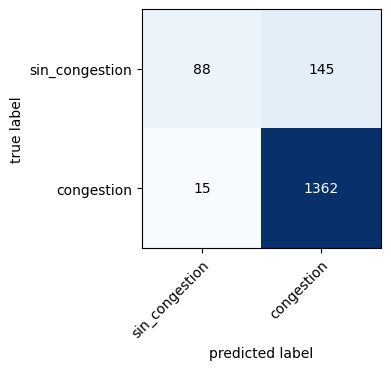

In [0]:
from mlxtend.plotting import plot_confusion_matrix
from sklearn import metrics
names = ['sin_congestion','congestion']  #Aqui se especifica los nombres de las clases >  En orden desde 0>Sin congestion  1>Congestion, 2>etc, etc
matriz_confusion = confusion_matrix(y_test, y_pred)  #Poner el orden> Clase real , clase predicha
print(metrics.classification_report(y_test,y_pred, digits=4))
plot_confusion_matrix(conf_mat=matriz_confusion, figsize =(4,4), class_names=names, show_normed=False)
plt.tight_layout()

#### Outlier Removal of Time Series

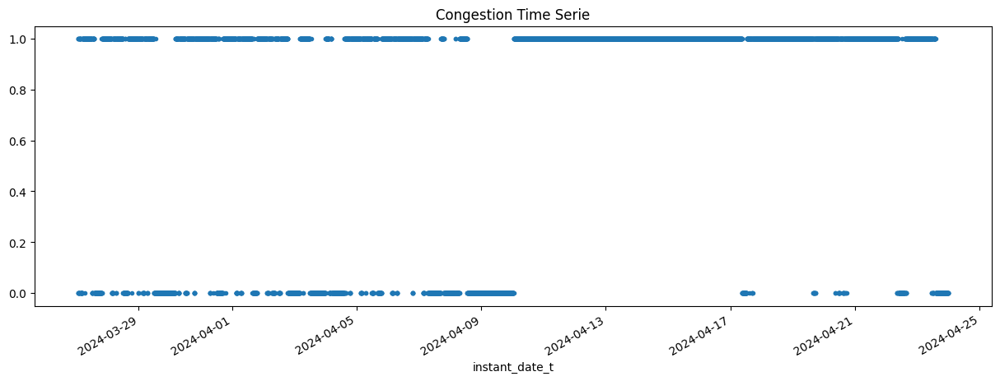

In [0]:
datos_cong_balanceado['congestion'].plot(style='.',
                        figsize=(15,5),                       
                        title='Congestion Time Serie')                 
plt.show()

Analisis de Outliers (Histograma)

<AxesSubplot:ylabel='Frequency'>

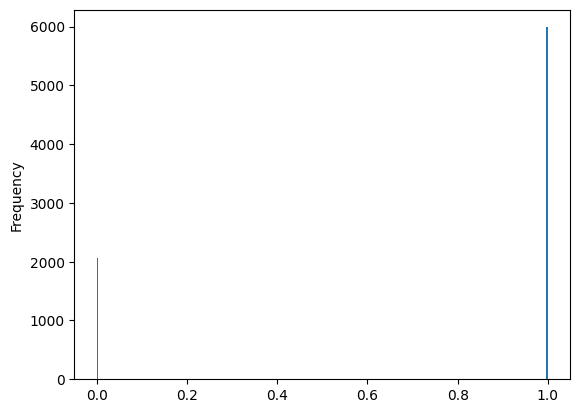

In [0]:
datos_cong_balanceado['congestion'].plot(kind='hist', bins=300)

1. Time Series Croos Validation

In [0]:
datos_cong_balanceado.head()

,congestion,eq_id,x,y,z,bearing_t,speed_t,gear_t,pitch_t,roll_t,n_sat,tramosidsnew_t,id_trabaj_t,tempeje1_t,tempeje2_t,tempeje3_t,tempeje4_t,tempeje5_t,tempeje6_t,presllanta1_t,presllanta2_t,presllanta3_t,presllanta4_t,presllanta5_t,presllanta6_t,isload_t,tonelaje_t,marcha_t,latitude_t,longitud_t,precisiongps_t,direccion_t,combustibleint_t,frecuencia_t,templlanta1_t,templlanta2_t,templlanta3_t,templlanta4_t,templlanta5_t,templlanta6_t,bateriasensorllanta1_t,bateriasensorllanta2_t,bateriasensorllanta3_t,bateriasensorllanta4_t,bateriasensorllanta5_t,bateriasensorllanta6_t,segment_angle_t,fuel_rate_t,id_equipment,id_path,id_worker,start_xcoorint,start_ycoorint,start_zcoorint,end_xcoorint,end_ycoorint,end_zcoorint,alert_level,id_equipment_congestion,id_equipo,ENG_SPD,BOOST_PRES,SYS_VOLTAGE,ENG_OIL_PRES,THROTTL_POS,GROUND_SPD,AMB_AIR_TEMP,AIR_FLTR,HI_BOOST_PRES,ENG_COOL_TEMP,RT_LT_EXH_TEMP,LO_BOOST_PRES,LCKUP_SLIP,TRN_LUBE_TEMP,DIFF_LUBE_PRES,DIFF_TEMP,AUTO_LUBE,TRN_OUT_SPD,TC_OUT_TEMP,Gear,BRK/AIR_PRES,BRK_STROKE,RETARDER,RETARDER_MODE,RTF_LTF_BRKTEMP,RTR_LTR_BRKTEMP,RT_F_BRK_TEMP,RT_R_BRK_TEMP,LT_R_BRK_TEMP,SERV_BRK_STAT,PAYLOAD,Z_Coor,Tire_Press_N4,Hourmeter_MSPU,Lon_Coor,Speed_GPS,Direction,Lat_Coor,Tire_Press_N6,Lat,year,mes,dia,hora,minuto,prediction-prob,prediction
instant_date_t,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2024-03-27 01:15:28,1,61,0,0,0,0,0,0,0,0,0,-1,671,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,100,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,3,27,1,15,NaN,NaN
2024-03-27 01:20:28,1,61,5857942,6647009,79260,0,0,0,43,33,12,-1,671,44,43,48,47,0,0,0,0,0,0,0,0,0,0,0,-15212541,-75100776,330,0,82,2,0,0,0,0,0,0,0,0,0,0,0,0,0,178,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,3,27,1,20,NaN,NaN
2024-03-27 01:25:28,1,61,5858844,6645047,79360,112,188,1,265,42,12,-1,671,49,49,51,50,0,0,0,0,0,0,0,0,0,0,1,-15212718,-75100692,419,112,81,2,0,0,0,0,0,0,0,0,0,0,0,0,0,299,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,3,27,1,25,NaN,NaN
2024-03-27 01:30:28,1,61,5861711,6646863,80280,186,1,0,-11,130,12,-1,671,51,51,54,54,0,0,0,0,0,0,0,0,0,0,0,-15212554,-75100425,330,186,81,2,0,0,0,0,0,0,0,0,0,0,0,0,0,174,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000

In [0]:
from sklearn.model_selection import TimeSeriesSplit

#Se construye el Generador del CROSS VALIDATION
tss = TimeSeriesSplit(n_splits=5, test_size=24*1, gap=24)
#24*365*1 : por ejemplo quieres predecir 1 año

#ordenamos la secuencia para un problema de serie temporal
datos_cong_balanceado = datos_cong_balanceado.sort_index() 

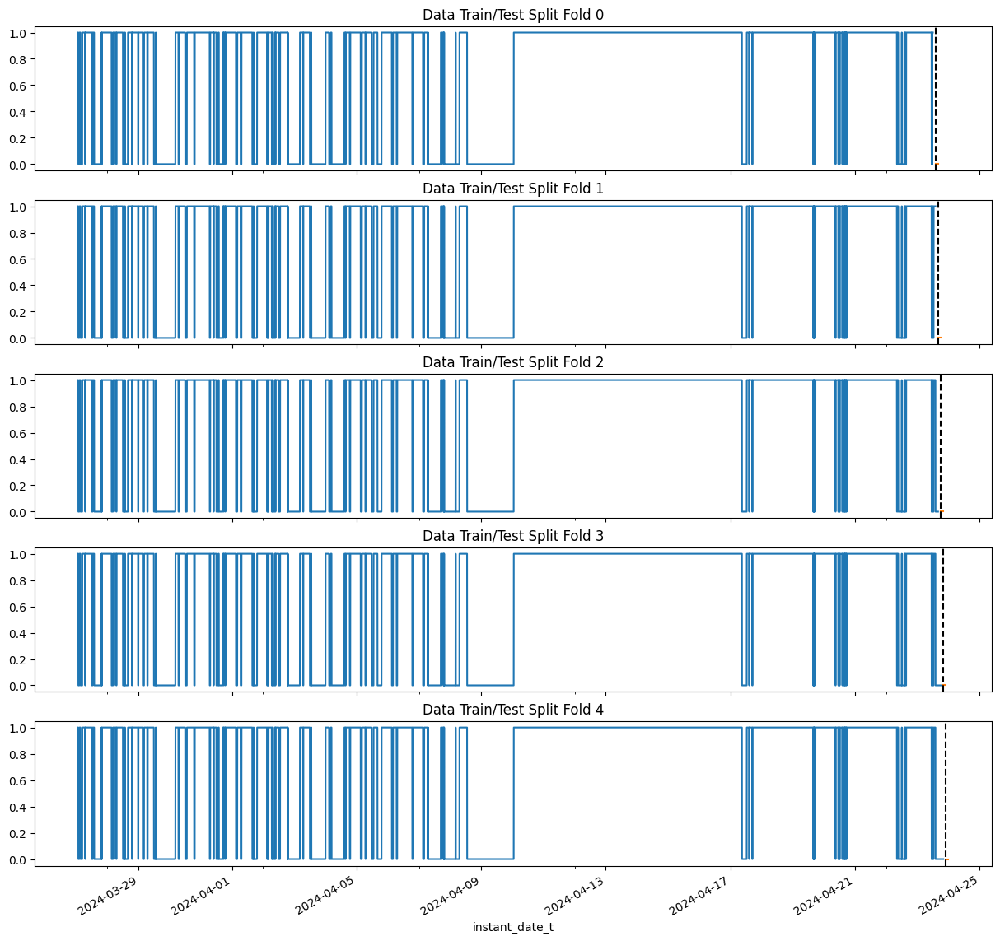

In [0]:
# Generamos los subgraficos para los tramos del Croos Validation, en este caso (Hemos partido en 5 partes)
fig, axs = plt.subplots(5, 1, figsize=(15,15), sharex=True)

#Inicializamos el contador, para movernos en los tramas
fold = 0
#Aplicamos el generador de CROSS VALIDATION
for train_idx , val_idx in tss.split(datos_cong_balanceado):
    train2 = datos_cong_balanceado.iloc[train_idx]
    test2 = datos_cong_balanceado.iloc[val_idx]
    train2['congestion'].plot(ax=axs[fold],
                                label='Train Set',
                                title=f'Data Train/Test Split Fold {fold}')
    test2['congestion'].plot(ax=axs[fold],
                                label='Test Set')
    axs[fold].axvline(test2.index.min(), color='black', ls='--')
    fold += 1
plt.show()

In [0]:
val_idx

array([7929, 7930, 7931, 7932, 7933, 7934, 7935, 7936, 7937, 7938, 7939,
       7940, 7941, 7942, 7943, 7944, 7945, 7946, 7947, 7948, 7949, 7950,
       7951, 7952])

2. Forecasting Horizon Explaind
- El horizonte de pronóstico es la longitud de tiempo en el futuro para la cual se preparan los pronósticos. Estos generalmente varían desde horizontes de pronóstico a corto plazo (menos de tres meses) hasta a largo plazo (más de dos años).

In [0]:
datos_cong_balanceado[['x','y','bearing_t','speed_t']].head()

,x,y,bearing_t,speed_t
instant_date_t,,,,
2024-03-27 01:15:28,0,0,0,0
2024-03-27 01:20:28,5857942,6647009,0,0
2024-03-27 01:25:28,5858844,6645047,112,188
2024-03-27 01:30:28,5861711,6646863,186,1
2024-03-27 01:35:28,5880238,6628391,46,166


3. Lag Features (Funciones de Retraso)
- What was the target (x) days in the past (¿Cuál era el objetivo (x) días en el pasado?")

In [0]:
datos_cong_balanceado['congestion'].to_dict()

{Timestamp('2024-03-27 01:15:28'): 1,
 Timestamp('2024-03-27 01:20:28'): 1,
 Timestamp('2024-03-27 01:25:28'): 1,
 Timestamp('2024-03-27 01:30:28'): 1,
 Timestamp('2024-03-27 01:35:28'): 0,
 Timestamp('2024-03-27 01:40:28'): 0,
 Timestamp('2024-03-27 01:45:28'): 0,
 Timestamp('2024-03-27 01:50:28'): 0,
 Timestamp('2024-03-27 01:55:28'): 0,
 Timestamp('2024-03-27 02:00:28'): 0,
 Timestamp('2024-03-27 02:05:28'): 0,
 Timestamp('2024-03-27 02:10:28'): 0,
 Timestamp('2024-03-27 02:15:28'): 0,
 Timestamp('2024-03-27 02:20:28'): 0,
 Timestamp('2024-03-27 02:25:28'): 1,
 Timestamp('2024-03-27 02:30:28'): 1,
 Timestamp('2024-03-27 02:35:28'): 1,
 Timestamp('2024-03-27 02:40:28'): 1,
 Timestamp('2024-03-27 02:45:28'): 1,
 Timestamp('2024-03-27 02:50:28'): 1,
 Timestamp('2024-03-27 02:55:28'): 1,
 Timestamp('2024-03-27 03:00:28'): 1,
 Timestamp('2024-03-27 03:05:28'): 1,
 Timestamp('2024-03-27 03:10:28'): 1,
 Timestamp('2024-03-27 03:15:28'): 1,
 Timestamp('2024-03-27 03:20:28'): 0,
 Timestamp('

In [0]:
target_map = datos_cong_balanceado['congestion'].to_dict()

In [0]:
datos_cong_balanceado.index.min(), datos_cong_balanceado.index.max(), 

(Timestamp('2024-03-27 01:15:28'), Timestamp('2024-04-23 23:55:28'))

In [0]:
def add_lags(df):
    #Hacemos un diccionario con los valores del TARGET, para completar luego
    target_map = datos_cong_balanceado['congestion'].to_dict()

    #datos_cong_balanceado['lag1'] = (datos_cong_balanceado.index - pd.Timedelta('1 days')).map(target_map)  #Retroceso 1, en este caso (1 dia)
    datos_cong_balanceado['lag1'] = (datos_cong_balanceado.index - pd.Timedelta('5T')).map(target_map)  #Retroceso 1, en este caso (1 dia)
    datos_cong_balanceado['lag2'] = (datos_cong_balanceado.index - pd.Timedelta('10T')).map(target_map)  #Retroceso 2, en este caso (2 dia)
    datos_cong_balanceado['lag3'] = (datos_cong_balanceado.index - pd.Timedelta('15T')).map(target_map)  #Retroceso 3, en este caso (3 dia)
    return df

In [0]:
# Eliminar las columnas 'columna1' y 'columna2'
#datos_cong_balanceado.drop(['lag1', 'lag2'], axis=1, inplace=True)

# axis=1 especifica que las columnas deben ser eliminadas
# inplace=True modifica el DataFrame original en su lugar

In [0]:
datos_cong_balanceado = add_lags(datos_cong_balanceado)
datos_cong_balanceado.head()

/root/.ipykernel/1567/command-848820728874694-1640263813:6: FutureWarning: 'T' is deprecated and will be removed in a future version. Please use 'min' instead of 'T'.
  datos_cong_balanceado['lag1'] = (datos_cong_balanceado.index - pd.Timedelta('5T')).map(target_map)  #Retroceso 1, en este caso (1 dia)
/root/.ipykernel/1567/command-848820728874694-1640263813:7: FutureWarning: 'T' is deprecated and will be removed in a future version. Please use 'min' instead of 'T'.
  datos_cong_balanceado['lag2'] = (datos_cong_balanceado.index - pd.Timedelta('10T')).map(target_map)  #Retroceso 2, en este caso (2 dia)
/root/.ipykernel/1567/command-848820728874694-1640263813:8: FutureWarning: 'T' is deprecated and will be removed in a future version. Please use 'min' instead of 'T'.
  datos_cong_balanceado['lag3'] = (datos_cong_balanceado.index - pd.Timedelta('15T')).map(target_map)  #Retroceso 3, en este caso (3 dia)


,congestion,eq_id,x,y,z,bearing_t,speed_t,gear_t,pitch_t,roll_t,n_sat,tramosidsnew_t,id_trabaj_t,tempeje1_t,tempeje2_t,tempeje3_t,tempeje4_t,tempeje5_t,tempeje6_t,presllanta1_t,presllanta2_t,presllanta3_t,presllanta4_t,presllanta5_t,presllanta6_t,isload_t,tonelaje_t,marcha_t,latitude_t,longitud_t,precisiongps_t,direccion_t,combustibleint_t,frecuencia_t,templlanta1_t,templlanta2_t,templlanta3_t,templlanta4_t,templlanta5_t,templlanta6_t,bateriasensorllanta1_t,bateriasensorllanta2_t,bateriasensorllanta3_t,bateriasensorllanta4_t,bateriasensorllanta5_t,bateriasensorllanta6_t,segment_angle_t,fuel_rate_t,id_equipment,id_path,id_worker,start_xcoorint,start_ycoorint,start_zcoorint,end_xcoorint,end_ycoorint,end_zcoorint,alert_level,id_equipment_congestion,id_equipo,ENG_SPD,BOOST_PRES,SYS_VOLTAGE,ENG_OIL_PRES,THROTTL_POS,GROUND_SPD,AMB_AIR_TEMP,AIR_FLTR,HI_BOOST_PRES,ENG_COOL_TEMP,RT_LT_EXH_TEMP,LO_BOOST_PRES,LCKUP_SLIP,TRN_LUBE_TEMP,DIFF_LUBE_PRES,DIFF_TEMP,AUTO_LUBE,TRN_OUT_SPD,TC_OUT_TEMP,Gear,BRK/AIR_PRES,BRK_STROKE,RETARDER,RETARDER_MODE,RTF_LTF_BRKTEMP,RTR_LTR_BRKTEMP,RT_F_BRK_TEMP,RT_R_BRK_TEMP,LT_R_BRK_TEMP,SERV_BRK_STAT,PAYLOAD,Z_Coor,Tire_Press_N4,Hourmeter_MSPU,Lon_Coor,Speed_GPS,Direction,Lat_Coor,Tire_Press_N6,Lat,year,mes,dia,hora,minuto,prediction-prob,prediction,lag1,lag2,lag3
instant_date_t,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2024-03-27 01:15:28,1,61,0,0,0,0,0,0,0,0,0,-1,671,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,100,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,3,27,1,15,NaN,NaN,NaN,NaN,NaN
2024-03-27 01:20:28,1,61,5857942,6647009,79260,0,0,0,43,33,12,-1,671,44,43,48,47,0,0,0,0,0,0,0,0,0,0,0,-15212541,-75100776,330,0,82,2,0,0,0,0,0,0,0,0,0,0,0,0,0,178,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,3,27,1,20,NaN,NaN,1.000000,NaN,NaN
2024-03-27 01:25:28,1,61,5858844,6645047,79360,112,188,1,265,42,12,-1,671,49,49,51,50,0,0,0,0,0,0,0,0,0,0,1,-15212718,-75100692,419,112,81,2,0,0,0,0,0,0,0,0,0,0,0,0,0,299,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,3,27,1,25,NaN,NaN,1.000000,1.000000,NaN
2024-03-27 01:30:28,1,61,5861711,6646863,80280,186,1,0,-11,130,12,-1,671,51,51,54,54,0,0,0,0,0,0,0,0,0,0,0,-15212554,-75100425,330,186,81,2,0,0,0,0,0,0,0,0,0,0,0,0,0,174,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.

Entrenar el Modelo Usando Cross Validation

In [0]:
def create_features(df):
    #Create time series features based on time series index
    df = df.copy()
    df['hora'] = df.index.hour
    df['minuto'] = df.index.min
    return df

In [0]:
from sklearn.model_selection import TimeSeriesSplit

#Se construye el Generador del CROSS VALIDATION
tss = TimeSeriesSplit(n_splits=5, test_size=24*1, gap=24)
#24*365*1 : por ejemplo quieres predecir 1 año

#ordenamos la secuencia para un problema de serie temporal
datos_cong_balanceado = datos_cong_balanceado.sort_index() 

#Inicializamos el contador, para movernos en los tramas
fold = 0
preds = []
scores = []

#Aplicamos el generador de CROSS VALIDATION
for train_idx , val_idx in tss.split(datos_cong_balanceado):
    train2 = datos_cong_balanceado.iloc[train_idx]
    test2 = datos_cong_balanceado.iloc[val_idx]
    
    train2 = create_features(train2)
    test2 = create_features(test2)

    FEATURES = ['x','y','bearing_t','speed_t','lag1', 'lag2', 'lag3']
    TARGET = 'congestion'

    X_train2 = train2[FEATURES]
    y_train2 = train2[TARGET]

    X_test2 = test2[FEATURES]
    y_test2 = test2[TARGET]

    xgb_model = xgb.XGBClassifier(n_estimators=300,max_depth=5,objective='binary:logistic',reg_alpha=0.1) #reg_alpha>>regulazrizacion Lasso educir la complejidad del modelo y evitar #el sobreajuste
    #eval_set>>monitorear el rendimiento del modelo en los datos de evaluación durante el #entrenamiento
    #objective='binary:logistic'> Para problemas de clasificacion binaria

    xgb_model.fit(X_train2,y_train2,eval_set=[(X_train2,y_train2), (X_test2,y_test2)],eval_metric=['auc','error'],
                early_stopping_rounds=50,verbose=True)

    y_pred2 = xgb_model.predict(X_test2)
    preds.append(y_pred2)
    score = np.sqrt(mean_squared_error(y_test2,y_pred2))
    scores.append(score)

In [0]:
print(f'Score acroos folds {np.mean(scores):0.4f}')
print(f'Fold scores: {scores}')

Entrenar el Modelo sin CV

In [0]:
datos_cong_balanceado.head()

,congestion,eq_id,x,y,z,bearing_t,speed_t,gear_t,pitch_t,roll_t,n_sat,tramosidsnew_t,id_trabaj_t,tempeje1_t,tempeje2_t,tempeje3_t,tempeje4_t,tempeje5_t,tempeje6_t,presllanta1_t,presllanta2_t,presllanta3_t,presllanta4_t,presllanta5_t,presllanta6_t,isload_t,tonelaje_t,marcha_t,latitude_t,longitud_t,precisiongps_t,direccion_t,combustibleint_t,frecuencia_t,templlanta1_t,templlanta2_t,templlanta3_t,templlanta4_t,templlanta5_t,templlanta6_t,bateriasensorllanta1_t,bateriasensorllanta2_t,bateriasensorllanta3_t,bateriasensorllanta4_t,bateriasensorllanta5_t,bateriasensorllanta6_t,segment_angle_t,fuel_rate_t,id_equipment,id_path,id_worker,start_xcoorint,start_ycoorint,start_zcoorint,end_xcoorint,end_ycoorint,end_zcoorint,alert_level,id_equipment_congestion,id_equipo,ENG_SPD,BOOST_PRES,SYS_VOLTAGE,ENG_OIL_PRES,THROTTL_POS,GROUND_SPD,AMB_AIR_TEMP,AIR_FLTR,HI_BOOST_PRES,ENG_COOL_TEMP,RT_LT_EXH_TEMP,LO_BOOST_PRES,LCKUP_SLIP,TRN_LUBE_TEMP,DIFF_LUBE_PRES,DIFF_TEMP,AUTO_LUBE,TRN_OUT_SPD,TC_OUT_TEMP,Gear,BRK/AIR_PRES,BRK_STROKE,RETARDER,RETARDER_MODE,RTF_LTF_BRKTEMP,RTR_LTR_BRKTEMP,RT_F_BRK_TEMP,RT_R_BRK_TEMP,LT_R_BRK_TEMP,SERV_BRK_STAT,PAYLOAD,Z_Coor,Tire_Press_N4,Hourmeter_MSPU,Lon_Coor,Speed_GPS,Direction,Lat_Coor,Tire_Press_N6,Lat,year,mes,dia,hora,minuto
instant_date_t,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2024-03-27 01:15:28,1,61,0,0,0,0,0,0,0,0,0,-1,671,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,100,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,3,27,1,15
2024-03-27 01:20:28,1,61,5857942,6647009,79260,0,0,0,43,33,12,-1,671,44,43,48,47,0,0,0,0,0,0,0,0,0,0,0,-15212541,-75100776,330,0,82,2,0,0,0,0,0,0,0,0,0,0,0,0,0,178,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,3,27,1,20
2024-03-27 01:25:28,1,61,5858844,6645047,79360,112,188,1,265,42,12,-1,671,49,49,51,50,0,0,0,0,0,0,0,0,0,0,1,-15212718,-75100692,419,112,81,2,0,0,0,0,0,0,0,0,0,0,0,0,0,299,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,3,27,1,25
2024-03-27 01:30:28,1,61,5861711,6646863,80280,186,1,0,-11,130,12,-1,671,51,51,54,54,0,0,0,0,0,0,0,0,0,0,0,-15212554,-75100425,330,186,81,2,0,0,0,0,0,0,0,0,0,0,0,0,0,174,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000

In [0]:
#‘W’, or ‘D’
#‘days’, or ‘day’
#‘hours’, ‘hour’, ‘hr’, or ‘h’
#‘minutes’, ‘minute’, ‘min’, or ‘m’
#‘seconds’, ‘second’, ‘sec’, or ‘s’
def add_lags(df):
    #Hacemos un diccionario con los valores del TARGET, para completar luego
    target_map = df['congestion'].to_dict()

    #datos_cong_balanceado['lag1'] = (datos_cong_balanceado.index - pd.Timedelta('1 days')).map(target_map)  #Retroceso 1, en este caso (1 dia)
    #df['lag1'] = (df.index - pd.Timedelta('5T')).map(target_map)  #Retroceso 1, en este caso (5 minutos)
    df['lag1'] = (df.index - pd.Timedelta(25, 'hours')).map(target_map)  #Retroceso 1, en este caso (1 dia)
    df['lag2'] = (df.index - pd.Timedelta(32, 'hours')).map(target_map)  #Retroceso 2, en este caso (2 dia)
    df['lag3'] = (df.index - pd.Timedelta(40, 'hours')).map(target_map)  #Retroceso 3, en este caso (3 dia)
    return df

In [0]:
datos_cong_balanceado = add_lags(datos_cong_balanceado)

FEATURES = ['x','y','bearing_t','speed_t','lag1', 'lag2', 'lag3','hora','minuto']
TARGET = 'congestion'

x = datos_cong_balanceado[FEATURES]
y = datos_cong_balanceado['congestion']

# Dividir los datos en conjunto de entrenamiento y conjunto de prueba
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, shuffle=False, random_state=1)

# Generamos los datasets de train y test
train  = pd.concat([X_train,y_train], axis=1)
test  = pd.concat([X_test,y_test], axis=1)

xgb_model = xgb.XGBClassifier(n_estimators=300,max_depth=5,objective='binary:logistic',reg_alpha=0.1) #reg_alpha>>regulazrizacion Lasso educir la complejidad del modelo y evitar #el sobreajuste
    #eval_set>>monitorear el rendimiento del modelo en los datos de evaluación durante el #entrenamiento
    #objective='binary:logistic'> Para problemas de clasificacion binaria

xgb_model.fit(X_train,y_train,eval_set=[(X_train,y_train), (X_test,y_test)],eval_metric=['auc','error'],
                early_stopping_rounds=50,verbose=True)

/root/.ipykernel/32322/command-2624329538977511-3604677840:6: FutureWarning: 'T' is deprecated and will be removed in a future version. Please use 'min' instead of 'T'.
  df['lag1'] = (df.index - pd.Timedelta('5T')).map(target_map)  #Retroceso 1, en este caso (1 dia)
/root/.ipykernel/32322/command-2624329538977511-3604677840:7: FutureWarning: 'T' is deprecated and will be removed in a future version. Please use 'min' instead of 'T'.
  df['lag2'] = (df.index - pd.Timedelta('10T')).map(target_map)  #Retroceso 2, en este caso (2 dia)
/root/.ipykernel/32322/command-2624329538977511-3604677840:8: FutureWarning: 'T' is deprecated and will be removed in a future version. Please use 'min' instead of 'T'.
  df['lag3'] = (df.index - pd.Timedelta('15T')).map(target_map)  #Retroceso 3, en este caso (3 dia)
/local_disk0/.ephemeral_nfs/cluster_libraries/python/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with s

[0]	validation_0-auc:0.98941	validation_0-error:0.02376	validation_1-auc:0.97069	validation_1-error:0.02733
[1]	validation_0-auc:0.99515	validation_0-error:0.01103	validation_1-auc:0.98750	validation_1-error:0.01988
[2]	validation_0-auc:0.99588	validation_0-error:0.01056	validation_1-auc:0.98779	validation_1-error:0.01988
[3]	validation_0-auc:0.99663	validation_0-error:0.00994	validation_1-auc:0.98770	validation_1-error:0.02298
[4]	validation_0-auc:0.99672	validation_0-error:0.00932	validation_1-auc:0.98785	validation_1-error:0.02112
[5]	validation_0-auc:0.99739	validation_0-error:0.00932	validation_1-auc:0.98784	validation_1-error:0.02112
[6]	validation_0-auc:0.99754	validation_0-error:0.00901	validation_1-auc:0.98976	validation_1-error:0.02609
[7]	validation_0-auc:0.99849	validation_0-error:0.00916	validation_1-auc:0.98953	validation_1-error:0.02547
[8]	validation_0-auc:0.99847	validation_0-error:0.00963	validation_1-auc:0.98959	validation_1-error:0.02795
[9]	validation_0-auc:0.99855

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=300, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

Feature Importance

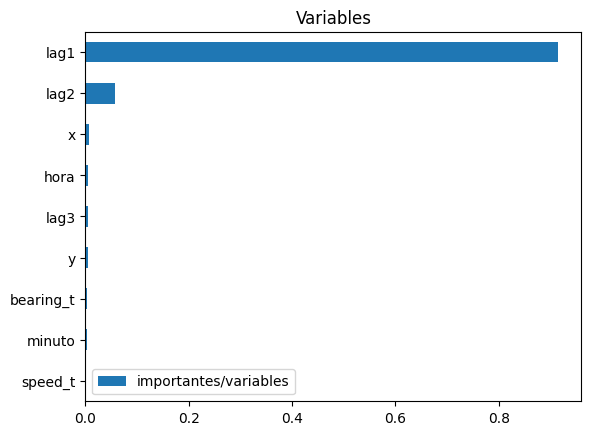

In [0]:
f1 = pd.DataFrame(data=xgb_model.feature_importances_,index=xgb_model.feature_names_in_,columns=['importantes/variables'])

f1.sort_values('importantes/variables').plot(kind='barh',title='Variables')
plt.show()

In [0]:
import sys
y_pred_prob = xgb_model.predict_proba(X_test)
y_pred_prob = np.round(y_pred_prob,3)
y_pred_prob = y_pred_prob[:, 1]  # Filtramos columna derecha, para dejar probabilidad que suceda CLASE 1(Conges)
y_pred = xgb_model.predict(X_test)

# Establecer la opción de impresión para mostrar el array completo
np.set_printoptions(threshold=sys.maxsize)
y_pred_prob

array([0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 ,
       0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 ,
       0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 ,
       0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 ,
       0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 ,
       0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 ,
       0.84 , 0.841, 0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 ,
       0.84 , 0.841, 0.84 , 0.84 , 0.84 , 0.841, 0.84 , 0.84 , 0.84 ,
       0.841, 0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.841, 0.84 ,
       0.84 , 0.84 , 0.841, 0.84 , 0.84 , 0.84 , 0.841, 0.84 , 0.84 ,
       0.84 , 0.84 , 0.84 , 0.84 , 0.841, 0.84 , 0.84 , 0.84 , 0.841,
       0.84 , 0.84 , 0.841, 0.841, 0.84 , 0.84 , 0.84 , 0.84 , 0.816,
       0.816, 0.816, 0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 , 0.84 ,
       0.84 , 0.84 , 0.84 , 0.84 , 0.841, 0.84 , 0.84 , 0.84 , 0.841,
       0.84 , 0.84 ,

In [0]:
test.head()

,x,y,bearing_t,speed_t,lag1,lag2,lag3,hora,minuto,congestion
instant_date_t,,,,,,,,,,
2024-04-18 09:50:28,5914791,6685673,157,2970,1.000000,1.000000,1.000000,14,7,1
2024-04-18 09:55:28,5914791,6685673,157,2970,1.000000,1.000000,1.000000,14,7,1
2024-04-18 10:00:28,5914791,6685673,157,2970,1.000000,1.000000,1.000000,14,7,1
2024-04-18 10:05:28,5914791,6685673,157,2970,1.000000,1.000000,1.000000,14,7,1
2024-04-18 10:10:28,5914791,6685673,157,2970,1.000000,1.000000,1.000000,14,7,1


Armamos nuetros datos para graficar las serie temporal original vs prediccion en el periodo de datos de Test

In [0]:
test["prediction-prob"] = y_pred_prob  #y_pred en dimension 1d
test["prediction"] = y_pred  #y_pred en dimension 1d
datos_cong_balanceado = datos_cong_balanceado.merge(test[['prediction-prob','prediction']], how='left', left_index=True,right_index=True) #left_index=True, right_index=True > la fusión se realizará basándose índices de las filas
datos_cong_balanceado.tail()

,congestion,eq_id,x,y,z,bearing_t,speed_t,gear_t,pitch_t,roll_t,n_sat,tramosidsnew_t,id_trabaj_t,tempeje1_t,tempeje2_t,tempeje3_t,tempeje4_t,tempeje5_t,tempeje6_t,presllanta1_t,presllanta2_t,presllanta3_t,presllanta4_t,presllanta5_t,presllanta6_t,isload_t,tonelaje_t,marcha_t,latitude_t,longitud_t,precisiongps_t,direccion_t,combustibleint_t,frecuencia_t,templlanta1_t,templlanta2_t,templlanta3_t,templlanta4_t,templlanta5_t,templlanta6_t,bateriasensorllanta1_t,bateriasensorllanta2_t,bateriasensorllanta3_t,bateriasensorllanta4_t,bateriasensorllanta5_t,bateriasensorllanta6_t,segment_angle_t,fuel_rate_t,id_equipment,id_path,id_worker,start_xcoorint,start_ycoorint,start_zcoorint,end_xcoorint,end_ycoorint,end_zcoorint,alert_level,id_equipment_congestion,id_equipo,ENG_SPD,BOOST_PRES,SYS_VOLTAGE,ENG_OIL_PRES,THROTTL_POS,GROUND_SPD,AMB_AIR_TEMP,AIR_FLTR,HI_BOOST_PRES,ENG_COOL_TEMP,RT_LT_EXH_TEMP,LO_BOOST_PRES,LCKUP_SLIP,TRN_LUBE_TEMP,DIFF_LUBE_PRES,DIFF_TEMP,AUTO_LUBE,TRN_OUT_SPD,TC_OUT_TEMP,Gear,BRK/AIR_PRES,BRK_STROKE,RETARDER,RETARDER_MODE,RTF_LTF_BRKTEMP,RTR_LTR_BRKTEMP,RT_F_BRK_TEMP,RT_R_BRK_TEMP,LT_R_BRK_TEMP,SERV_BRK_STAT,PAYLOAD,Z_Coor,Tire_Press_N4,Hourmeter_MSPU,Lon_Coor,Speed_GPS,Direction,Lat_Coor,Tire_Press_N6,Lat,year,mes,dia,hora,minuto,lag1,lag2,lag3,prediction-prob,prediction
instant_date_t,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2024-04-23 23:35:28,0,61,5604653,6666973,81290,87,4465,0,-515,24,12,-1,671,84,83,82,82,0,0,0,0,0,0,0,0,0,0,0,-15210724,-75124359,300,87,79,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,61,1579.500000,8.000000,0.000000,488.000000,0.000000,47.000000,19.500000,0.500000,0.000000,82.000000,-6.000000,0.000000,0.000000,92.000000,314.000000,83.000000,0.000000,1880.000000,84.000000,0.000000,905.000000,0.000000,0.000000,1.000000,0.000000,2.000000,85.000000,91.000000,90.000000,0.000000,0.000000,809.700000,-75.120000,88.720000,-15.210000,-15.210713,-75.124000,48668208.000000,831836400.000000,80970.000000,2024,4,23,23,35,0.000000,0.000000,0.000000,0.337000,0.000000
2024-04-23 23:40:28,0,61,5668063,6690182,59090,233,2948,5,-342,-125,12,-1,671,95,94,98,101,0,0,0,0,0,0,0,0,0,0,5,-15208629,-75118453,410,233,80,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,61,1894.000000,6.000000,0.000000,498.000000,0.000000,30.500000,20.200000,0.500000,0.000000,83.000000,3.000000,0.000000,0.000000,91.000000,212.000000,84.000000,0.000000,1245.000000,99.000000,5.000000,832.000000,0.000000,0.000000,2.000000,0.000000,-2.000000,93.000000,97.000000,100.000000,0.000000,0.000000,589.090000,-75.110000,231.160000,-15.200000,-15.208766,-75.118632,48725884.000000,831858000.000000,58910.000000,2024,4,23,23,40,0.000000,0.000000,0.000000,0.337000,0.000000
2024-04-23 23:45:28,0,61,5779291,6787727,49990,71,1,0,-59,10,12,-1,671,93,92,87,87,0,0,0,0,0,0,0,0,0,0,0,-15199815,-75108093,395,71,78,2,0,0,0,0,0,0,0,0,0,0,0,0,0,196,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,61,700.500000,2.000000,0.000000,350.000000,0.000000,0.000000,21.500000,0.000000,0.000000,83.000000,4.000000,0.000000,0.000000,90.000000,0.000000,83.000000,0.000000,0.000000,91.000000,0.000000,778.000000,0.000000,0.000000,1.000000,1.000000,-1.000000,93.000000,87.000000,87.000000,0.000000,0.000000,499.790000,-75.100000,294.350000,-15.190000,-15.199818,-75.108096,48839016.000000,831957000.000000,49980.000000,2024,4,23,23,45,0.000000,0.000000,0.000000,0.349000,0.000000
2024-04-23 23:50:28,0,61,5779455,6787822,49960,71,1,0,-47,0,12,-1,671,86,85,82,82,0,0,0,0,0,0,0,0,0,0,0,-15199807,-75108078,450,71,79,2,0,0,0,0,0,0,0,0,0,0,0,0,0,183,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,61,701.000000,0.000000,0.000000,370.000000,0.000000,0.000000,20.790000,0.000

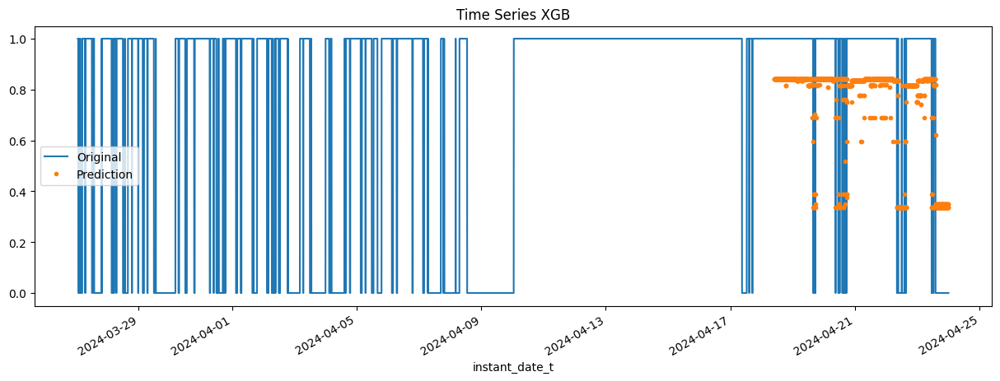

In [0]:
ax = datos_cong_balanceado[['congestion']].plot(figsize=(15,5)) #crea un gráfico de la columna 'congestion_x' del DF

# Se utiliza el ax=ax especifica que esta serie debe agregarse al mismo gráfico que se creó anteriormente
datos_cong_balanceado['prediction-prob'].plot(ax=ax, style='.') #style='.'
plt.legend(['Original','Prediction'])
ax.set_title('Time Series XGB')
plt.show()

In [0]:
test.index.max()

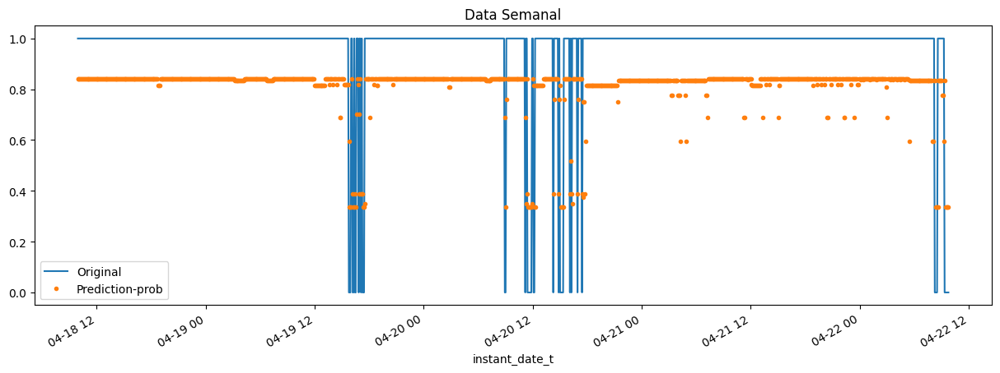

In [0]:
ax = datos_cong_balanceado.loc[(datos_cong_balanceado.index > '2024-04-18 09:50:28') & (datos_cong_balanceado.index < '2024-04-22 09:50:28')]['congestion'].plot(figsize=(15,5), title='Data Semanal')
datos_cong_balanceado.loc[(datos_cong_balanceado.index > '2024-04-18 09:50:28') & (datos_cong_balanceado.index < '2024-04-22 09:50:28')]['prediction-prob'].plot(style='.')
plt.legend(['Original','Prediction-prob'])
plt.show()

Medimos el Performance del Modelo (En este caso con Accuracy, por ser un modelo de Clasificacion)

In [0]:
from sklearn.metrics import accuracy_score, confusion_matrix
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.9801242236024845


              precision    recall  f1-score   support

           0     0.9205    0.9442    0.9322       233
           1     0.9905    0.9862    0.9884      1377

    accuracy                         0.9801      1610
   macro avg     0.9555    0.9652    0.9603      1610
weighted avg     0.9804    0.9801    0.9802      1610



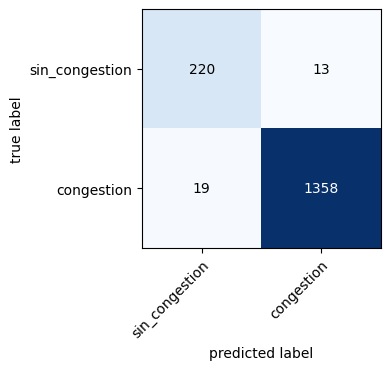

In [0]:
from mlxtend.plotting import plot_confusion_matrix
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix
names = ['sin_congestion','congestion']  #Aqui se especifica los nombres de las clases >  En orden desde 0>Sin congestion  1>Congestion, 2>etc, etc
matriz_confusion = confusion_matrix(y_test, y_pred)  #Poner el orden> Clase real , clase predicha
print(metrics.classification_report(y_test,y_pred, digits=4))
plot_confusion_matrix(conf_mat=matriz_confusion, figsize =(4,4), class_names=names, show_normed=False)
plt.tight_layout()

4. Predicting the Future
- Reentrenamiento en todos los datos (Entrenar el Modelo con los Lags, si aun no lo has entrenado asi)
- Para predecir el futuro, necesitamos un dataframe vacío para rangos de fechas futuras
- Ejecutar esas fechas a través de nuestro código de creación de características + creación de rezagos"

In [0]:
datos_cong_balanceado.index.max() + pd.Timedelta(minutes=5)

Timestamp('2024-04-24 00:00:28')

In [0]:
datos_cong_balanceado.index.max() + pd.Timedelta(days=1)

Timestamp('2024-04-24 23:55:28')

In [0]:
futuretesting=pd.date_range(datos_cong_balanceado.index.max() + pd.Timedelta(minutes=5), datos_cong_balanceado.index.max() + pd.Timedelta(days=1) , freq='5T')

/root/.ipykernel/1558/command-2624329538977542-3930660472:1: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  futuretesting=pd.date_range(datos_cong_balanceado.index.max() + pd.Timedelta(minutes=5), datos_cong_balanceado.index.max() + pd.Timedelta(days=1) , freq='5T')


In [0]:
futuretesting[0]

Timestamp('2024-04-24 00:00:28')

In [0]:
futuretesting[0] - pd.Timedelta(days=1)

Timestamp('2024-04-23 00:00:28')

In [0]:
futuretesting - pd.Timedelta(days=1)

DatetimeIndex(['2024-04-23 00:00:28', '2024-04-23 00:05:28',
               '2024-04-23 00:10:28', '2024-04-23 00:15:28',
               '2024-04-23 00:20:28', '2024-04-23 00:25:28',
               '2024-04-23 00:30:28', '2024-04-23 00:35:28',
               '2024-04-23 00:40:28', '2024-04-23 00:45:28',
               ...
               '2024-04-23 23:10:28', '2024-04-23 23:15:28',
               '2024-04-23 23:20:28', '2024-04-23 23:25:28',
               '2024-04-23 23:30:28', '2024-04-23 23:35:28',
               '2024-04-23 23:40:28', '2024-04-23 23:45:28',
               '2024-04-23 23:50:28', '2024-04-23 23:55:28'],
              dtype='datetime64[ns]', length=288, freq='5min')

In [0]:
#Creature future dataframe

# #1. Creamos el esqueleto del df del Pronostico (con las fecha Inicio y Fin del Pronostico (en este caso 1 dia en el futuro en rango de 5minutos))
future=pd.date_range(datos_cong_balanceado.index.max() + pd.Timedelta(minutes=5), datos_cong_balanceado.index.max() + pd.Timedelta(days=1) , freq='5T')
future_df=pd.DataFrame(index=future)

# #Se agrega la columna de FUTURE en el df pronostico com TRUE (para indicar que son el futuro)
future_df['isFuture'] = True

# #Se agrega la columna de FUTURE en el df Original con FALSE (para indicar no es futuro) 
datos_cong_balanceado['isFuture'] = False

#Se hace una concatenacion para agregar las filas de future_df al df_original
df_and_future = pd.concat([datos_cong_balanceado, future_df])

/root/.ipykernel/1524/command-2624329538977528-2485149458:4: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  future=pd.date_range(datos_cong_balanceado.index.max() + pd.Timedelta(minutes=5), datos_cong_balanceado.index.max() + pd.Timedelta(days=1) , freq='5T')


In [0]:
df_and_future.head()

,congestion,eq_id,x,y,z,bearing_t,speed_t,gear_t,pitch_t,roll_t,n_sat,tramosidsnew_t,id_trabaj_t,tempeje1_t,tempeje2_t,tempeje3_t,tempeje4_t,tempeje5_t,tempeje6_t,presllanta1_t,presllanta2_t,presllanta3_t,presllanta4_t,presllanta5_t,presllanta6_t,isload_t,tonelaje_t,marcha_t,latitude_t,longitud_t,precisiongps_t,direccion_t,combustibleint_t,frecuencia_t,templlanta1_t,templlanta2_t,templlanta3_t,templlanta4_t,templlanta5_t,templlanta6_t,bateriasensorllanta1_t,bateriasensorllanta2_t,bateriasensorllanta3_t,bateriasensorllanta4_t,bateriasensorllanta5_t,bateriasensorllanta6_t,segment_angle_t,fuel_rate_t,id_equipment,id_path,id_worker,start_xcoorint,start_ycoorint,start_zcoorint,end_xcoorint,end_ycoorint,end_zcoorint,alert_level,id_equipment_congestion,id_equipo,ENG_SPD,BOOST_PRES,SYS_VOLTAGE,ENG_OIL_PRES,THROTTL_POS,GROUND_SPD,AMB_AIR_TEMP,AIR_FLTR,HI_BOOST_PRES,ENG_COOL_TEMP,RT_LT_EXH_TEMP,LO_BOOST_PRES,LCKUP_SLIP,TRN_LUBE_TEMP,DIFF_LUBE_PRES,DIFF_TEMP,AUTO_LUBE,TRN_OUT_SPD,TC_OUT_TEMP,Gear,BRK/AIR_PRES,BRK_STROKE,RETARDER,RETARDER_MODE,RTF_LTF_BRKTEMP,RTR_LTR_BRKTEMP,RT_F_BRK_TEMP,RT_R_BRK_TEMP,LT_R_BRK_TEMP,SERV_BRK_STAT,PAYLOAD,Z_Coor,Tire_Press_N4,Hourmeter_MSPU,Lon_Coor,Speed_GPS,Direction,Lat_Coor,Tire_Press_N6,Lat,year,mes,dia,hora,minuto,isFuture
2024-03-27 01:15:28,1.000000,61.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,671.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,100.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024.000000,3.000000,27.000000,1.000000,15.000000,False
2024-03-27 01:20:28,1.000000,61.000000,5857942.000000,6647009.000000,79260.000000,0.000000,0.000000,0.000000,43.000000,33.000000,12.000000,-1.000000,671.000000,44.000000,43.000000,48.000000,47.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-15212541.000000,-75100776.000000,330.000000,0.000000,82.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,178.000000,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024.000000,3.000000,27.000000,1.000000,20.000000,False
2024-03-27 01:25:28,1.000000,61.000000,5858844.000000,6645047.000000,79360.000000,112.000000,188.000000,1.000000,265.000000,42.000000,12.000000,-1.000000,671.000000,49.000000,49.000000,51.000000,50.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,-15212718.000000,-75100692.000000,419.000000,112.000000,81.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,299.000000,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.

In [0]:
variables_pronostico = ['congestion','x','y','bearing_t','speed_t','lag1', 'lag2', 'lag3','hora','minuto','isFuture']
df_and_future = df_and_future[variables_pronostico]
df_and_future.tail(30)

---------------------------------------------------------------------------
KeyError                                  Traceback (most recent call last)
File <command-2624329538977529>, line 2
      1 variables_pronostico = ['congestion','x','y','bearing_t','speed_t','lag1', 'lag2', 'lag3','hora','minuto','isFuture']
----> 2 df_and_future = df_and_future[variables_pronostico]
      3 df_and_future.tail(30)

File /local_disk0/.ephemeral_nfs/cluster_libraries/python/lib/python3.10/site-packages/pandas/core/frame.py:4108, in DataFrame.__getitem__(self, key)
   4106     if is_iterator(key):
   4107         key = list(key)
-> 4108     indexer = self.columns._get_indexer_strict(key, "columns")[1]
   4110 # take() does not accept boolean indexers
   4111 if getattr(indexer, "dtype", None) == bool:

File /local_disk0/.ephemeral_nfs/cluster_libraries/python/lib/python3.10/site-packages/pandas/core/indexes/base.py:6200, in Index._get_indexer_strict(self, key, axis_name)
   6197 else:
   6198     

In [0]:
df_and_future.head()

,congestion,x,y,bearing_t,speed_t,lag1,lag2,lag3,hora,minuto,isFuture
2024-03-27 01:15:28,1.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,1.000000,15.000000,False
2024-03-27 01:20:28,1.000000,5857942.000000,6647009.000000,0.000000,0.000000,1.000000,NaN,NaN,1.000000,20.000000,False
2024-03-27 01:25:28,1.000000,5858844.000000,6645047.000000,112.000000,188.000000,1.000000,1.000000,NaN,1.000000,25.000000,False
2024-03-27 01:30:28,1.000000,5861711.000000,6646863.000000,186.000000,1.000000,1.000000,1.000000,1.000000,1.000000,30.000000,False
2024-03-27 01:35:28,0.000000,5880238.000000,6628391.000000,46.000000,166.000000,1.000000,1.000000,1.000000,11.000000,22.000000,False


In [0]:
def create_features(df):
    #Create time series features based on time series index
    df = df.copy()
    df['hora'] = df.index.hour
    df['minuto'] = df.index.minute
    return df

In [0]:
datos_cong_balanceado.shape

(8049, 111)

In [0]:
df_and_future.shape

(8337, 11)

In [0]:
df_and_future.index.max() 

Timestamp('2024-04-24 23:55:28')

In [0]:
#‘W’, or ‘D’
#‘days’, or ‘day’
#‘hours’, ‘hour’, ‘hr’, or ‘h’
#‘minutes’, ‘minute’, ‘min’, or ‘m’
#‘seconds’, ‘second’, ‘sec’, or ‘s’
def add_lags(df):
    #Hacemos un diccionario con los valores del TARGET, para completar luego
    target_map = df['congestion'].to_dict()

    #datos_cong_balanceado['lag1'] = (datos_cong_balanceado.index - pd.Timedelta('1 days')).map(target_map)  #Retroceso 1, en este caso (1 dia)
    #df['lag1'] = (df.index - pd.Timedelta('5T')).map(target_map)  #Retroceso 1, en este caso (5 minutos)
    df['lag1'] = (df.index - pd.Timedelta(25, 'hours')).map(target_map)  #Retroceso 1, en este caso (1 dia)
    df['lag2'] = (df.index - pd.Timedelta(32, 'hours')).map(target_map)  #Retroceso 2, en este caso (2 dia)
    df['lag3'] = (df.index - pd.Timedelta(40, 'hours')).map(target_map)  #Retroceso 3, en este caso (3 dia)
    return df

In [0]:
# df_and_future = create_features(df_and_future)
df_and_future = add_lags(df_and_future)

In [0]:
# df_and_future.tail(310)

In [0]:
# df_and_future.tail(50)

In [0]:
#Filtramos solo el Dataset Esqueleto para el Pronostico
future_dates_pronostico = df_and_future.query('isFuture').copy()
future_dates_pronostico.head()

,congestion,eq_id,x,y,z,bearing_t,speed_t,gear_t,pitch_t,roll_t,n_sat,tramosidsnew_t,id_trabaj_t,tempeje1_t,tempeje2_t,tempeje3_t,tempeje4_t,tempeje5_t,tempeje6_t,presllanta1_t,presllanta2_t,presllanta3_t,presllanta4_t,presllanta5_t,presllanta6_t,isload_t,tonelaje_t,marcha_t,latitude_t,longitud_t,precisiongps_t,direccion_t,combustibleint_t,frecuencia_t,templlanta1_t,templlanta2_t,templlanta3_t,templlanta4_t,templlanta5_t,templlanta6_t,bateriasensorllanta1_t,bateriasensorllanta2_t,bateriasensorllanta3_t,bateriasensorllanta4_t,bateriasensorllanta5_t,bateriasensorllanta6_t,segment_angle_t,fuel_rate_t,id_equipment,id_path,id_worker,start_xcoorint,start_ycoorint,start_zcoorint,end_xcoorint,end_ycoorint,end_zcoorint,alert_level,id_equipment_congestion,id_equipo,ENG_SPD,BOOST_PRES,SYS_VOLTAGE,ENG_OIL_PRES,THROTTL_POS,GROUND_SPD,AMB_AIR_TEMP,AIR_FLTR,HI_BOOST_PRES,ENG_COOL_TEMP,RT_LT_EXH_TEMP,LO_BOOST_PRES,LCKUP_SLIP,TRN_LUBE_TEMP,DIFF_LUBE_PRES,DIFF_TEMP,AUTO_LUBE,TRN_OUT_SPD,TC_OUT_TEMP,Gear,BRK/AIR_PRES,BRK_STROKE,RETARDER,RETARDER_MODE,RTF_LTF_BRKTEMP,RTR_LTR_BRKTEMP,RT_F_BRK_TEMP,RT_R_BRK_TEMP,LT_R_BRK_TEMP,SERV_BRK_STAT,PAYLOAD,Z_Coor,Tire_Press_N4,Hourmeter_MSPU,Lon_Coor,Speed_GPS,Direction,Lat_Coor,Tire_Press_N6,Lat,year,mes,dia,hora,minuto,isFuture,lag1,lag2,lag3
2024-04-24 00:00:28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,1.000000,1.000000,1.000000
2024-04-24 00:05:28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,1.000000,1.000000,1.000000
2024-04-24 00:10:28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,1.000000,1.000000,1.000000
2024-04-24 00:15:28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,1.000000,1.000000,0.000000
2024-04-24 00:20:28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,1.000000,1.000000,0.000000


In [0]:
# df_and_future['x'].loc[future - pd.Timedelta(days=1)].values

In [0]:
# datos_cong_balanceado[['x','y','bearing_t','speed_t']].tail(288)

In [0]:
# Identificamos las columnas a completar usando los datos del día anterior
columns_to_fill = ['x', 'y', 'bearing_t', 'speed_t']

# Rellenamos las columnas específicas con los valores del día anterior
for col in columns_to_fill:
    future_dates_pronostico[col] = df_and_future[col].loc[future - pd.Timedelta(days=1)].values

# Las otras columnas se quedan con NaN o el valor que tenías en el DataFrame de predicción
future_dates_pronostico.head()

Predict the future

In [0]:
FEATURES = ['x','y','bearing_t','speed_t','lag1', 'lag2', 'lag3','hora','minuto']

In [0]:
FEATURES

['x', 'y', 'bearing_t', 'speed_t', 'lag1', 'lag2', 'lag3', 'hora', 'minuto']

In [0]:
column_pred_congestion = xgb_model.predict_proba(future_dates_pronostico[FEATURES])
column_pred_congestion = column_pred_congestion[:, 1]
future_dates_pronostico['congestion_pred']=column_pred_congestion

In [0]:
future_dates_pronostico.head()

,congestion,eq_id,x,y,z,bearing_t,speed_t,gear_t,pitch_t,roll_t,n_sat,tramosidsnew_t,id_trabaj_t,tempeje1_t,tempeje2_t,tempeje3_t,tempeje4_t,tempeje5_t,tempeje6_t,presllanta1_t,presllanta2_t,presllanta3_t,presllanta4_t,presllanta5_t,presllanta6_t,isload_t,tonelaje_t,marcha_t,latitude_t,longitud_t,precisiongps_t,direccion_t,combustibleint_t,frecuencia_t,templlanta1_t,templlanta2_t,templlanta3_t,templlanta4_t,templlanta5_t,templlanta6_t,bateriasensorllanta1_t,bateriasensorllanta2_t,bateriasensorllanta3_t,bateriasensorllanta4_t,bateriasensorllanta5_t,bateriasensorllanta6_t,segment_angle_t,fuel_rate_t,id_equipment,id_path,id_worker,start_xcoorint,start_ycoorint,start_zcoorint,end_xcoorint,end_ycoorint,end_zcoorint,alert_level,id_equipment_congestion,id_equipo,ENG_SPD,BOOST_PRES,SYS_VOLTAGE,ENG_OIL_PRES,THROTTL_POS,GROUND_SPD,AMB_AIR_TEMP,AIR_FLTR,HI_BOOST_PRES,ENG_COOL_TEMP,RT_LT_EXH_TEMP,LO_BOOST_PRES,LCKUP_SLIP,TRN_LUBE_TEMP,DIFF_LUBE_PRES,DIFF_TEMP,AUTO_LUBE,TRN_OUT_SPD,TC_OUT_TEMP,Gear,BRK/AIR_PRES,BRK_STROKE,RETARDER,RETARDER_MODE,RTF_LTF_BRKTEMP,RTR_LTR_BRKTEMP,RT_F_BRK_TEMP,RT_R_BRK_TEMP,LT_R_BRK_TEMP,SERV_BRK_STAT,PAYLOAD,Z_Coor,Tire_Press_N4,Hourmeter_MSPU,Lon_Coor,Speed_GPS,Direction,Lat_Coor,Tire_Press_N6,Lat,year,mes,dia,hora,minuto,isFuture,lag1,lag2,lag3
2024-04-24 00:00:28,NaN,NaN,5857450.000000,6647293.000000,NaN,0.000000,9.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,1.000000,1.000000,1.000000
2024-04-24 00:05:28,NaN,NaN,5857450.000000,6647135.000000,NaN,0.000000,11.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,1.000000,1.000000,1.000000
2024-04-24 00:10:28,NaN,NaN,5857696.000000,6647114.000000,NaN,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,1.000000,1.000000,1.000000
2024-04-24 00:15:28,NaN,NaN,0.000000,0.000000,NaN,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,1.000000,1.000000,0.000000
2024-04-24 00:20:28,NaN,NaN,5857614.000000,6647156.000000,NaN,0.000000,3.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,1.000000,1.000000,0.000000


<AxesSubplot:title={'center':'Future Prediction Congestion 24-4-2024'}>

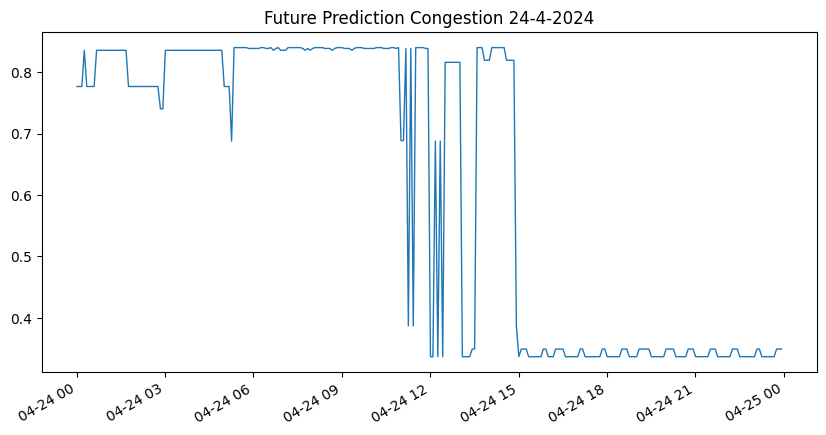

In [0]:
future_dates_pronostico['congestion_pred'].plot(figsize=(10,5),
                                                ms=1,lw=1, title='Future Prediction Congestion 24-4-2024')

Saving Model ML Time Series XGB for Later

In [0]:
xgb_model.save_model('model_xgb_timeseries.json')

Cargar el Modelo XGB Time Series para predecir

<AxesSubplot:title={'center':'Future Prediction Congestion 24-4-2024'}>

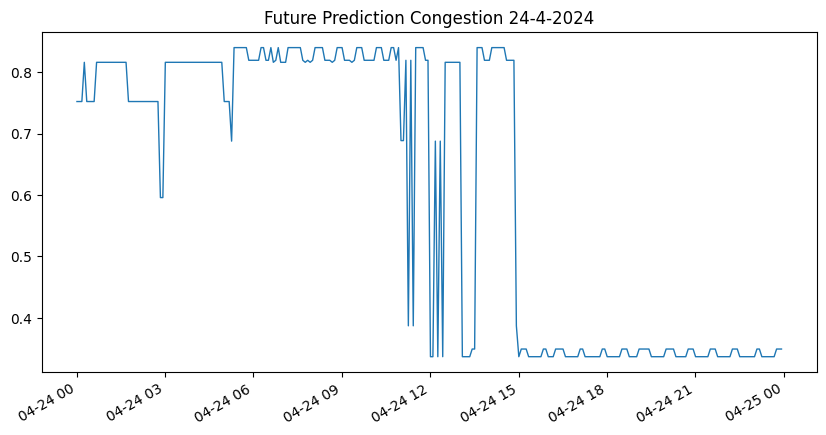

In [0]:
import xgboost as xgb
model_xgb_new = xgb.XGBClassifier()
model_xgb_new.load_model('model_xgb_timeseries.json')

column_pred_congestion2 = model_xgb_new.predict_proba(future_dates_pronostico[FEATURES])
column_pred_congestion2 = column_pred_congestion2[:, 1]
future_dates_pronostico['congestion_pred_2']=column_pred_congestion2

future_dates_pronostico['congestion_pred_2'].plot(figsize=(10,5),
                                                ms=1,lw=1, title='Future Prediction Congestion 24-4-2024')

/databricks/python/lib/python3.10/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='x', ylabel='y'>

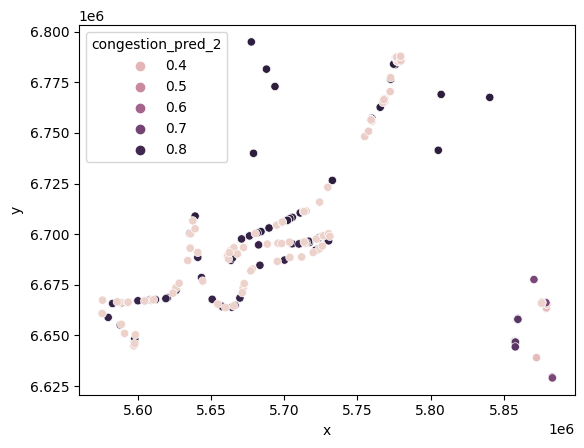

In [0]:
import seaborn as sns
mask=future_dates_pronostico['x']>0 
data=future_dates_pronostico[mask]
sns.scatterplot(data['x'],data['y'], hue=data['congestion_pred_2'])

#### Algoritmo LSTM para Time Series

Cargamos los datos

In [0]:
#1. Leemos los datos de PROCEESED la tabla Delta 
df_delta2 = spark.read.format("delta").load("/mnt/datalakemlopsd4m/presentation/proyectocongestion_presentation/data_congestion_serietemp_balanceada")
datos_cong_balanceado = df_delta2.toPandas()
datos_cong_balanceado.head()

,instant_date_t,congestion,eq_id,x,y,z,bearing_t,speed_t,gear_t,pitch_t,roll_t,n_sat,tramosidsnew_t,id_trabaj_t,tempeje1_t,tempeje2_t,tempeje3_t,tempeje4_t,tempeje5_t,tempeje6_t,presllanta1_t,presllanta2_t,presllanta3_t,presllanta4_t,presllanta5_t,presllanta6_t,isload_t,tonelaje_t,marcha_t,latitude_t,longitud_t,precisiongps_t,direccion_t,combustibleint_t,frecuencia_t,templlanta1_t,templlanta2_t,templlanta3_t,templlanta4_t,templlanta5_t,templlanta6_t,bateriasensorllanta1_t,bateriasensorllanta2_t,bateriasensorllanta3_t,bateriasensorllanta4_t,bateriasensorllanta5_t,bateriasensorllanta6_t,segment_angle_t,fuel_rate_t,id_equipment,id_path,id_worker,start_xcoorint,start_ycoorint,start_zcoorint,end_xcoorint,end_ycoorint,end_zcoorint,alert_level,id_equipment_congestion,id_equipo,ENG_SPD,BOOST_PRES,SYS_VOLTAGE,ENG_OIL_PRES,THROTTL_POS,GROUND_SPD,AMB_AIR_TEMP,AIR_FLTR,HI_BOOST_PRES,ENG_COOL_TEMP,RT_LT_EXH_TEMP,LO_BOOST_PRES,LCKUP_SLIP,TRN_LUBE_TEMP,DIFF_LUBE_PRES,DIFF_TEMP,AUTO_LUBE,TRN_OUT_SPD,TC_OUT_TEMP,Gear,BRK/AIR_PRES,BRK_STROKE,RETARDER,RETARDER_MODE,RTF_LTF_BRKTEMP,RTR_LTR_BRKTEMP,RT_F_BRK_TEMP,RT_R_BRK_TEMP,LT_R_BRK_TEMP,SERV_BRK_STAT,PAYLOAD,Z_Coor,Tire_Press_N4,Hourmeter_MSPU,Lon_Coor,Speed_GPS,Direction,Lat_Coor,Tire_Press_N6,Lat,year,mes,dia,hora,minuto
0,2024-04-07 20:22:07,0,61,5747788,6698336,64520,50,19,0,189,-168,12,-1,673,86,86,85,85,0,0,0,0,0,0,0,0,1,1383,0,-15207896,-75111030,400,50,88,2,0,0,0,0,0,0,0,0,0,0,0,0,0,204,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,61,698.691243,4.000000,0.000000,465.000000,0.000000,0.000000,30.790000,0.000000,0.000000,87.000000,2.000000,0.000000,0.920000,94.000000,0.000000,82.000000,0.000000,0.000000,86.000000,0.000000,829.000000,0.000000,0.000000,3.000000,0.000000,0.000000,86.000000,85.000000,85.000000,0.000000,138.300000,645.107834,-75.110000,182.640000,-15.200000,-15.207896,-75.111032,48807509.529940,831867650.000000,64510.783433,2024,4,23,16,7
1,2024-04-07 20:22:08,0,199,5869496,6644852,76607,144,0,0,52,504,19,-1,-1,56,59,61,62,0,0,0,0,0,0,0,0,0,0,0,-15212737,-75099700,300,144,66,2,0,0,0,0,0,0,0,0,0,0,0,0,0,170,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,199,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,4,19,16,38
2,2024-04-07 20:22:09,0,199,5858844,6644509,78579,221,13,0,25,73,12,-1,-1,50,53,57,57,0,0,0,0,0,0,0,0,0,0,0,-15212767,-75100692,350,221,78,2,0,0,0,0,0,0,0,0,0,0,0,0,0,168,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,199,699.534432,0.000000,0.000000,444.000000,0.000000,0.000000,18.790000,0.000000,0.000000,62.000000,12.000000,0.000000,1.070000,59.000000,0.000000,28.000000,0.000000,0.000000,54.000000,0.000000,737.000000,0.000000,0.000000,1.000000,-3.000000,0.000000,50.000000,57.000000,57.000000,0.000000,0.000000,785.780000,-75.100000,0.000000,-15.210000,-15.212768,-75.100688,48918576.000000,831813800.000000,78579.000000,2024,4,8,21,19
3,2024-04-07 20:22:10,0,199,5888426,6701673,79886,66,2987,6,287,213,16,-1,324,86,90,94,94,0,0,0,0,0,0,0,0,0,0,6,-15207600,-75097935,350,66,85,2,0,0,0,0,0,0,0,0,0,0,0,0,0,1161,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,199,1397.085295,75.183778,0.000000,479.000000,71.657043,30.461217,25.500000,0.500000,0.000000,85.000000,-6.718378,0.000000,1.268819,94.640811,155.718378,83.640811,0.000000,1648.951078,89.000000,6.000000,753.028644,0.000000,0.000000,2.000000,-3.640811,1.000000,87.359189,94.640811,93.640811,0.000000,0.000000,799.805774,-75.090000,51.485078,-15.200000,-15.207498,-75.097749,48950156.109478,831872112.648898,7

Ajuste de los datos para problemas de Time Series

In [0]:
# #2. Ajuste de los datos a Series Temporales
# #2.1 Se establece la columna 'Time' como el índice del DataFrame "datos"
datos_cong_balanceado = datos_cong_balanceado.set_index('instant_date_t')

# #2.3 Ordenamos el dataset de forma ascendente segun el datetime
datos_cong_balanceado.sort_index(inplace=True)

#2.4 Identificamos la periocidad de la serie temporal
df_time_diffs = datos_cong_balanceado.index.to_series().diff().dt.total_seconds()

# # 2.4.1 Contar cuántas diferencias de tiempo tienen cada valor específico
# diferencias_frecuencias = df_time_diffs.value_counts().sort_index()
# # 2.4.2 Mostrar los recuentos
# print(diferencias_frecuencias)

#3. Eliminamos o Filtramos las filas donde la diferencia es distinta de cero (Con ello eliminamos las filas o registros de fechas duplicadas)
datos_cong_balanceado = datos_cong_balanceado[df_time_diffs != 0]

#4. # Reinterpolar el dataset con una periosidad en especifico
# 'S' o 'seg' : Segundo, 'T' o 'min': Minuto,'H' o 'Hr': Hora,'D': Día,'W': Semana,'M': Mes,'Q': Trimestre,'Y': Año
datos_cong_balanceado = datos_cong_balanceado.asfreq(freq='6s', method='bfill')

# Filtramos los valores de x, y, z que son 0s
mask = (datos_cong_balanceado['x'] == 0) & (datos_cong_balanceado['y'] == 0) & (datos_cong_balanceado['z'] == 0)
datos_cong_balanceado = datos_cong_balanceado[~mask]

datos_cong_balanceado.head()

,congestion,eq_id,x,y,z,bearing_t,speed_t,gear_t,pitch_t,roll_t,n_sat,tramosidsnew_t,id_trabaj_t,tempeje1_t,tempeje2_t,tempeje3_t,tempeje4_t,tempeje5_t,tempeje6_t,presllanta1_t,presllanta2_t,presllanta3_t,presllanta4_t,presllanta5_t,presllanta6_t,isload_t,tonelaje_t,marcha_t,latitude_t,longitud_t,precisiongps_t,direccion_t,combustibleint_t,frecuencia_t,templlanta1_t,templlanta2_t,templlanta3_t,templlanta4_t,templlanta5_t,templlanta6_t,bateriasensorllanta1_t,bateriasensorllanta2_t,bateriasensorllanta3_t,bateriasensorllanta4_t,bateriasensorllanta5_t,bateriasensorllanta6_t,segment_angle_t,fuel_rate_t,id_equipment,id_path,id_worker,start_xcoorint,start_ycoorint,start_zcoorint,end_xcoorint,end_ycoorint,end_zcoorint,alert_level,id_equipment_congestion,id_equipo,ENG_SPD,BOOST_PRES,SYS_VOLTAGE,ENG_OIL_PRES,THROTTL_POS,GROUND_SPD,AMB_AIR_TEMP,AIR_FLTR,HI_BOOST_PRES,ENG_COOL_TEMP,RT_LT_EXH_TEMP,LO_BOOST_PRES,LCKUP_SLIP,TRN_LUBE_TEMP,DIFF_LUBE_PRES,DIFF_TEMP,AUTO_LUBE,TRN_OUT_SPD,TC_OUT_TEMP,Gear,BRK/AIR_PRES,BRK_STROKE,RETARDER,RETARDER_MODE,RTF_LTF_BRKTEMP,RTR_LTR_BRKTEMP,RT_F_BRK_TEMP,RT_R_BRK_TEMP,LT_R_BRK_TEMP,SERV_BRK_STAT,PAYLOAD,Z_Coor,Tire_Press_N4,Hourmeter_MSPU,Lon_Coor,Speed_GPS,Direction,Lat_Coor,Tire_Press_N6,Lat,year,mes,dia,hora,minuto
instant_date_t,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2024-03-27 01:15:34,1,61,5860974,6645449,80200,0,0,0,0,0,0,-1,671,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,100,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,3,27,1,15
2024-03-27 01:15:40,1,61,5860974,6645449,80200,0,0,0,0,0,0,-1,671,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,100,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,3,27,1,15
2024-03-27 01:15:46,1,61,5857614,6647093,78890,0,12,0,52,25,12,-1,671,38,37,40,39,0,0,0,0,0,0,0,0,0,0,0,-15212533,-75100807,419,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,562,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,3,27,1,15
2024-03-27 01:15:52,1,61,5857614,6647093,78870,0,3,0,52,24,12,-1,671,38,37,40,39,0,0,0,0,0,0,0,0,0,0,0,-15212533,-75100807,390,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,587,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00

Definir si sera Modelo Univariado o Multivariado

In [0]:
#datos_df = datos_cong_balanceado['congestion']  # Modelo Univariado
datos_df = datos_cong_balanceado[['x','speed_t','congestion']]  # Modelo Multivariado

#### Escalar/Normalizar los datos 
Es requerido para garantizar que todas las caracteristicas se encuentren en el mismo rango
de valores, lo que facilita el entrenamiento del Modelo y las predicciones

In [0]:
import numpy as np

def escalar_por_variables_especificas(dataframe, variables_a_escalar, medias, desviaciones_estandar):
  """
  Escala solo las variables especificadas en un dataframe de forma independiente.

  Args:
    dataframe: El dataframe que se va a escalar.
    variables_a_escalar: Una lista que contiene los nombres de las variables que se van a escalar.
    medias: Un diccionario que contiene la media de cada variable.
    desviaciones_estandar: Un diccionario que contiene la desviación estándar de cada variable.

  Returns:
    El dataframe escalado.
  """
  dataframe_escalado = dataframe.copy()
  for columna in dataframe.columns:
    if columna in variables_a_escalar:
      dataframe_escalado[columna] = (dataframe[columna] - medias[columna]) / desviaciones_estandar[columna]
  return dataframe_escalado

In [0]:

# Definir la lista de variables a escalar
variables_a_escalar = ["x", "speed_t"]  # Reemplazar con los nombres reales de las columnas

# Calcular medias y desviaciones estándar para todas las variables
medias = datos_df.mean()
desviaciones_estandar = datos_df.std()

# Escalar solo las variables especificadas en el dataframe train
df_escalado = escalar_por_variables_especificas(datos_df, variables_a_escalar, medias, desviaciones_estandar)

In [0]:
df_escalado.head()

,congestion,x,speed_t
instant_date_t,,,
2024-03-27 01:15:28,1,-2.672257,-0.848125
2024-03-27 01:20:28,1,0.379047,-0.848125
2024-03-27 01:25:28,1,0.379517,-0.711228
2024-03-27 01:30:28,1,0.381011,-0.847397
2024-03-27 01:35:28,0,0.390661,-0.727247


Metodo de Desviacion estandar y MEDIA

In [0]:
# train_mean = tr.mean() # Guardar este valor para usarlo cuando despliegues el Modelo en Produccion
# train_std = tr.std()  # Guardar este valor para usarlo cuando despliegues el Modelo en Produccion 

# tr = (tr - train_mean) / train_std
# vl = (vl - train_mean) / train_std
# ts = (ts - train_mean) / train_std


# INVERSION DE ESCALAMIENTO (CUANDO DESPLIEGUES EN PRODUCCION)
# def invertir_escalamiento(predicciones, train_mean, train_std):
#     return predicciones * train_std + train_mean

# # Suponiendo que 'predicciones' son las predicciones de tu modelo
# predicciones_invertidas = invertir_escalamiento(predicciones, train_mean, train_std)

Metodo de Min Max

In [0]:
# ESCALAMIENTO
# train_min = tr.min()   # Guardar este valor para usarlo cuando despliegues el Modelo en Produccion
# train_max = tr.max()   # Guardar este valor para usarlo cuando despliegues el Modelo en Produccion

# tr = (tr - train_min) / (train_max - train_min)
# vl = (vl - train_min) / (train_max - train_min)
# ts = (ts - train_min) / (train_max - train_min)

# INVERSION DE ESCALAMIENTO (CUANDO DESPLIEGUES EN PRODUCCION)
# def invertir_minmax_escalamiento(predicciones, train_min, train_max):
#     return predicciones * (train_max - train_min) + train_min

# # Suponiendo que 'predicciones' son las predicciones de tu modelo
# predicciones_invertidas = invertir_minmax_escalamiento(predicciones, train_min, train_max)

5.1 Particion del Set en entrenamiento, validacion y prueba
- En el caso de series temporales se debe garantizar que se generan las particiones sin mezclar aleaotariamente

Recordemos

. El set entrenamiento se usa para encontrar los parametros 

. El set validacion para verificar que no haya under/over fitting

. El set de prueba para poner a prueba el mejor modelo encontrado

In [0]:
#Funcion para generar las particiones, siguiendo la secuencia de las series temporales
def train_val_test_split(serie, tr_size =0.8, vl_size=0.1, ts_size=0.1):
    # Definir nunmero de datos en cada subserie
    N = serie.shape[0]   #Serie seria el df, con las columnas que intervendran en el Modelo
    Ntrain = int(tr_size*N)  # Numero de datos de entrenamiento
    Nval = int(vl_size*N)
    Ntest = int(ts_size*N)

    #Realizar la particion
    train = serie[0:Ntrain]
    val = serie[Ntrain:Nval+Ntrain]
    test = serie[Nval+Ntrain:]

    return train, val, test


# Prueba de la funcion 
tr, vl, ts  = train_val_test_split(datos_df)

print(f'Shape del Set de Entrenamiento, {tr.shape}')
print(f'Shape del Set de Validacion, {vl.shape}')
print(f'Shape del Set de Test, {ts.shape}')

Shape del Set de Entrenamiento, (282658, 3)
Shape del Set de Validacion, (35332, 3)
Shape del Set de Test, (35333, 3)


In [0]:
tr.head()

,x,speed_t,congestion
instant_date_t,,,
2024-03-27 01:15:34,5860974,0,1
2024-03-27 01:15:40,5860974,0,1
2024-03-27 01:15:46,5857614,12,1
2024-03-27 01:15:52,5857614,3,1
2024-03-27 01:15:58,5857614,3,1


In [0]:
#datos_cong_balanceado.mean()

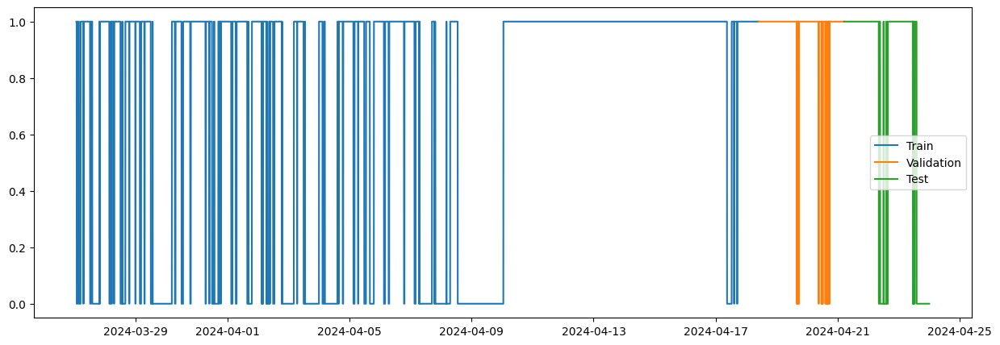

In [0]:

import matplotlib.pyplot as plt
#Dibujemos los subsets
fig, ax  = plt.subplots(figsize  = (15,5))
ax.plot(tr, label = 'Train')
ax.plot(vl, label = 'Validation')
ax.plot(ts, label = 'Test')
plt.legend()

Grafico de Cada Serie Temporal (Analisis Multivariado)

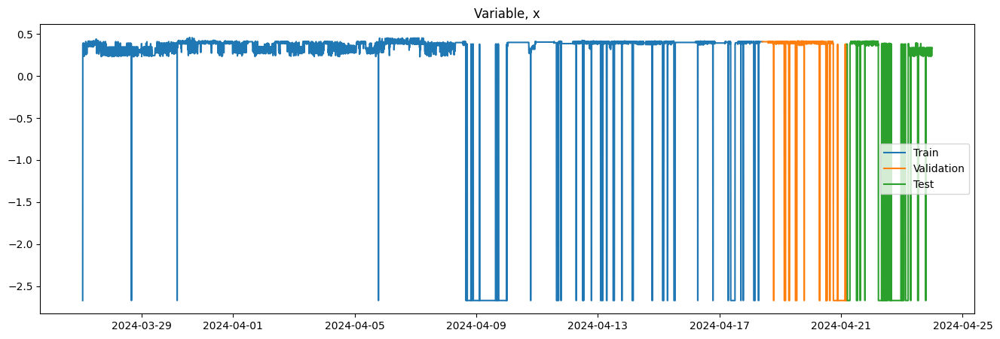

In [0]:
covar  = 1# Indice de la covariable (columna del dataset) a graficar
col  = datos_df.columns[covar]

# Dibujar los sets de entrenamiento, validacion, prueba
fig, ax = plt.subplots(figsize=(16,5))
ax.plot(tr[col], label='Train')
ax.plot(vl[col], label='Validation')
ax.plot(ts[col], label='Test')
ax.set_title(f'Variable, {col}')
plt.legend()

###5.2 Generación del dataset supervisado (entrada y salida del modelo)

Debemos ajustar nuestro set de datos de acuerdo a lo especificado en la documentacion de LSTM

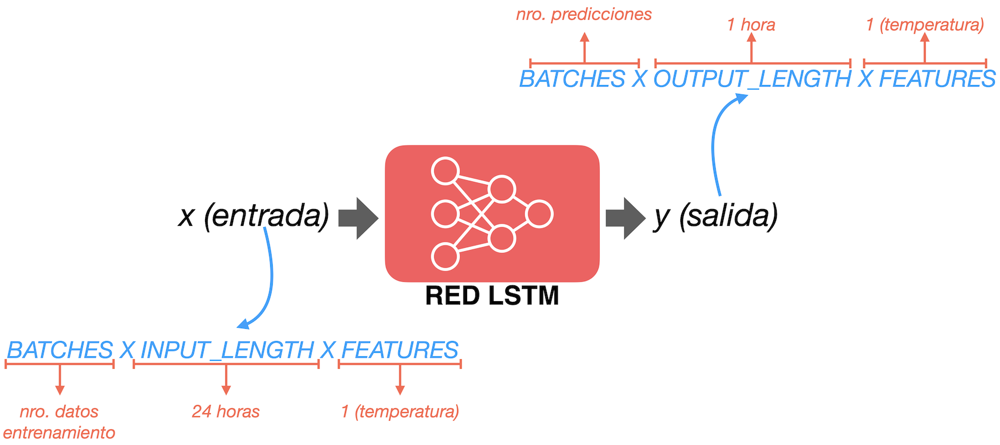

In [0]:
from IPython.display import Image

# Asegúrate de que la ruta de la imagen sea correcta
img_path = 'entradas_salidas_LSTM.png'

# Muestra la imagen
Image(filename=img_path)

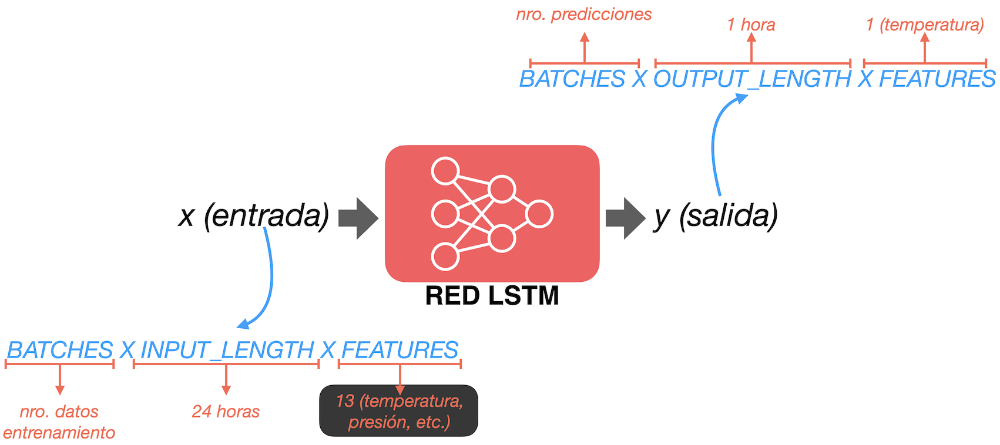

In [0]:
from IPython.display import Image

# Asegúrate de que la ruta de la imagen sea correcta
img_path = 'lstm_multivariado.png'

# Muestra la imagen
Image(filename=img_path)

Así que en este caso cada dato de entrenamiento será:

- Un arreglo de 24 (horas) x 1 (feature) correspondiente a la entrada
- Un arreglo de 1 (hora) x 1 (feature) correspondiente a la hora 25 (a predecir):

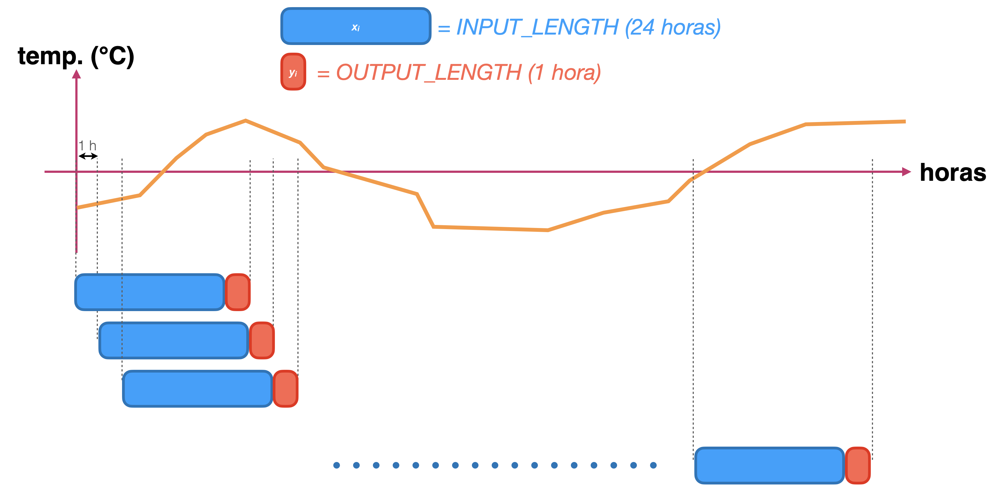

In [0]:
from IPython.display import Image

# Asegúrate de que la ruta de la imagen sea correcta
img_path = 'dataset_supervisado.png'

# Muestra la imagen
Image(filename=img_path)

Creamos la funcion que pondremos reutilizar mas adelante para implementar modelos mas complejos

In [0]:
def crear_dataset_supervisado(array, input_length, output_length): 
    ''' Permite crear un dataset con las entradas (X) y salidas (Y)
    requeridas por las Red LSTM.

    Parametros :
    - array : arreglo numpy de tamano N * Features (N: cantidad de datos, Features: Cantidad de features)
    -  input_length : Instantes de tiempo consecutivos de la(s) serie(s) de tiempo usados para alimentar al modelo (bloques de bash para ingresar ala LSTM)
    -  output_length : instantes de tiempo a pronosticar (salida del modelo)
    '''
    #Inizializacion
    X, Y = [], []   #Listados que contendran los datos de entrada y salida del modelo (Lotes o Batches)
    shape = array.shape
    if len(shape) == 1:  #Si tenemos solo una variable(serie) UNIVARIADO
        fils, cols = array.shape[0], 1   #UNIVARIADO (Por ello solo 1 columna)
        array = array.reshape(fils,cols)
    else: #MULTIVARIDAO
        fils, cols = array.shape

    #Generar los arreglos
    for i in range(fils-input_length-output_length):
        X.append(array[i:i+INPUT_LENGTH,0:cols])
        Y.append(array[i+input_length:i+input_length+output_length,-1].reshape(output_length,1))
    
    #Convertir listas a arreglos Numpy
    X = np.array(X)
    Y = np.array(Y)

    return X, Y

In [0]:
import numpy as np
#Crear los datasets de entrenamiento, validacion, prueba
INPUT_LENGTH = 2 # Numero de Pasos en el pasado
OUTPUT_LENGTH = 1  # Modelo Uni Step (1 en este casoi indica 1 fila adelante), Multistep mas de 1 

x_tr, y_tr = crear_dataset_supervisado(tr.values, INPUT_LENGTH, OUTPUT_LENGTH)
x_vl, y_vl = crear_dataset_supervisado(vl.values, INPUT_LENGTH, OUTPUT_LENGTH)
x_ts, y_ts = crear_dataset_supervisado(ts.values, INPUT_LENGTH, OUTPUT_LENGTH)

#Imprimimos la informacion en pantalla
print('Tamanos entrada (BATCHES x INPUT_LENGTH x FEATURES) y de salida (BACTHES x OUTPUT_LENGTH x FEATURES)')

print(f'Set de entenamiento x_tr : {x_tr.shape}, y_tr : {y_tr.shape}')
print(f'Set de validacion x_vl : {x_vl.shape}, y_vl : {y_vl.shape}')
print(f'Set de entenamiento x_ts : {x_ts.shape}, y_ts : {y_ts.shape}')

Tamanos entrada (BATCHES x INPUT_LENGTH x FEATURES) y de salida (BACTHES x OUTPUT_LENGTH x FEATURES)
Set de entenamiento x_tr : (282655, 2, 3), y_tr : (282655, 1, 1)
Set de validacion x_vl : (35329, 2, 3), y_vl : (35329, 1, 1)
Set de entenamiento x_ts : (35330, 2, 3), y_ts : (35330, 1, 1)


In [0]:
tr.head(10)

,x,speed_t,congestion
instant_date_t,,,
2024-03-27 01:15:34,5860974,0,1
2024-03-27 01:15:40,5860974,0,1
2024-03-27 01:15:46,5857614,12,1
2024-03-27 01:15:52,5857614,3,1
2024-03-27 01:15:58,5857614,3,1
2024-03-27 01:16:04,5857614,0,1
2024-03-27 01:16:10,5857614,11,1
2024-03-27 01:16:16,5857614,16,1
2024-03-27 01:16:22,5857614,11,1


In [0]:
x_tr[:5]

array([[[5860974,       0,       1],
        [5860974,       0,       1]],

       [[5860974,       0,       1],
        [5857614,      12,       1]],

       [[5857614,      12,       1],
        [5857614,       3,       1]],

       [[5857614,       3,       1],
        [5857614,       3,       1]],

       [[5857614,       3,       1],
        [5857614,       0,       1]]])

In [0]:
y_tr

array([[[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1

#### Construccion y Entrenamiento del Modelo
- Entradas : arreglos x (batches x input_length x features = batches x 24 x 1)
- Salidas : arreglos y (batches x output_length x features = batches x 1 x 1)

Usaremos la RSME para medir el performance del Modelo

In [0]:
x_tr.shape[1], x_tr.shape[2]

(50, 3)

In [0]:
# Construccion del Modelo
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import RMSprop, Adam
import tensorflow as tf

# Fijar Valores parametros , para asegurar la reproducibilidad de los datos inicializados
tf.random.set_seed(123) # Semilla(inicializacion de los parametros o pesos de misma manera)
tf.config.experimental.enable_op_determinism() # Cada vez se ejecute de misma manera

# El Modelo
N_UNITS = 150 # Tamaño del estado oculto de la celda de Memoria de LSTM
INPUT_SHAPE = (x_tr.shape[1], x_tr.shape[2]) #50 pasos atras x n features (feature)

modelo = Sequential()
modelo.add(LSTM(N_UNITS, input_shape=INPUT_SHAPE))
modelo.add(Dense(OUTPUT_LENGTH, activation='sigmoid')) # linear: problema regresion, sigmoid:clasificacion binaria, softmax:multiclase

#RSME: Para problemas de regresion, para tener errores en las mismas unidades de la variable target
# def root_mean_squared_error(y_true,y_pred):
#     rmse=tf.math.sqtr(tf.math.reduce_mean(tf.square(y_pred-y_true)))
#     return rmse

# Optimizador para problema de regresion
# optimizador = RMSprop(learning_rate=0.05)

#Compilation


# Compilar el modelo
modelo.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy','AUC'])

# Entrenamiento del Modelo
EPOCHS = 50 # Numero de epocas de entrenamiento
BATCH_SIZE = 256 # Numero de lotes que van ingresando al Modelo(Algoritmo)
historia = modelo.fit(
    x = x_tr,
    y = y_tr,
    batch_size = BATCH_SIZE,
    epochs = EPOCHS,
    validation_data = (x_vl, y_vl),
    verbose=2  #Imprime en pantalla con va el entrenamiento
)

Epoch 1/50
1105/1105 - 11s - loss: 0.5666 - accuracy: 0.7446 - auc: 0.5005 - val_loss: 0.3099 - val_accuracy: 0.9707 - val_auc: 0.5000 - 11s/epoch - 10ms/step
Epoch 2/50
1105/1105 - 8s - loss: 0.5638 - accuracy: 0.7488 - auc: 0.4998 - val_loss: 0.3339 - val_accuracy: 0.9707 - val_auc: 0.5000 - 8s/epoch - 7ms/step
Epoch 3/50
1105/1105 - 8s - loss: 0.5638 - accuracy: 0.7488 - auc: 0.4998 - val_loss: 0.3180 - val_accuracy: 0.9707 - val_auc: 0.5000 - 8s/epoch - 7ms/step
Epoch 4/50
1105/1105 - 8s - loss: 0.5638 - accuracy: 0.7488 - auc: 0.5013 - val_loss: 0.3193 - val_accuracy: 0.9707 - val_auc: 0.5000 - 8s/epoch - 7ms/step
Epoch 5/50
1105/1105 - 8s - loss: 0.5638 - accuracy: 0.7488 - auc: 0.4977 - val_loss: 0.3167 - val_accuracy: 0.9707 - val_auc: 0.5000 - 8s/epoch - 7ms/step
Epoch 6/50
1105/1105 - 8s - loss: 0.5638 - accuracy: 0.7488 - auc: 0.4999 - val_loss: 0.3322 - val_accuracy: 0.9707 - val_auc: 0.5000 - 8s/epoch - 7ms/step
Epoch 7/50
1105/1105 - 8s - loss: 0.5638 - accuracy: 0.7488 -

#### Graficar curvas de entrenamiento y validacion, para verificar que no existe overfitting

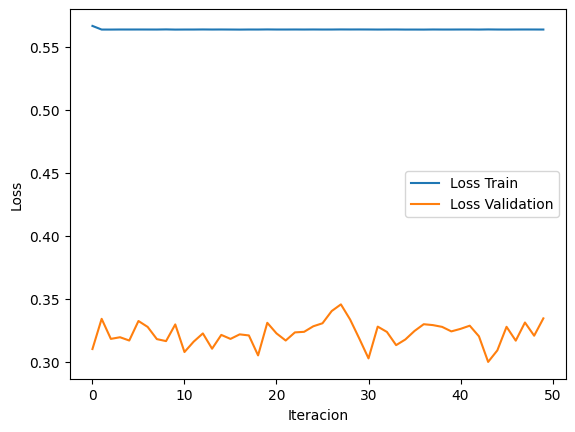

In [0]:
plt.plot(historia.history['loss'],label='Loss Train')
plt.plot(historia.history['val_loss'],label='Loss Validation')
plt.xlabel('Iteracion')
plt.ylabel('Loss')
plt.legend()

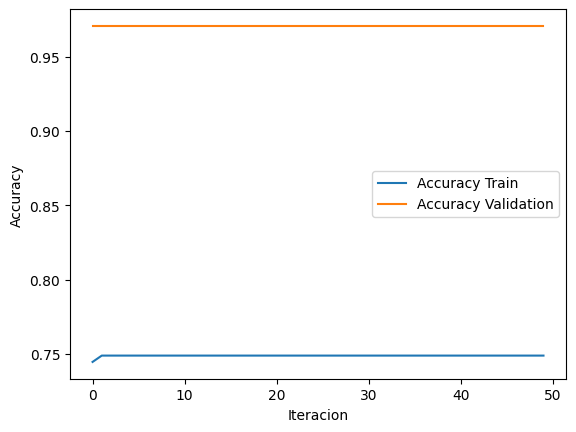

In [0]:
plt.plot(historia.history['accuracy'],label='Accuracy Train')
plt.plot(historia.history['val_accuracy'],label='Accuracy Validation')
plt.xlabel('Iteracion')
plt.ylabel('Accuracy')
plt.legend()

#### 7.Performance del Modelo
Verificamos el rendimiento para el set de test , y comparamos con el de 
entrenamiento y validacion.
Este rendimiento es simplemente el LOSS obtenido con cada subset

In [0]:
# Calculo de Loss Binary para train, val, test
loss_tr = modelo.evaluate(x=x_tr, y=y_tr, verbose=0) #verbose=0 No se imprime el progreso
loss_vl = modelo.evaluate(x=x_vl, y=y_vl, verbose=0) #No se imprime el progreso
loss_ts = modelo.evaluate(x=x_ts, y=y_ts, verbose=0) #No se imprime el progreso

# Los valores de pérdida son los primeros elementos de las listas devueltas por evaluate()
loss_tr_value = loss_tr[0]
loss_vl_value = loss_vl[0]
loss_ts_value = loss_ts[0]

# Imprimir resultados en pantalla
print('Comparativo rendimiento:')
print(f'Loss train {loss_tr_value:.3f}')
print(f'Loss val {loss_vl_value:.3f}')
print(f'Loss test {loss_ts_value:.3f}')

Comparativo rendimiento:
Loss train -14.418
Loss val -17.533
Loss test -26.055


#### 8. Predicciones en el Datos de Test con el Modelo Entrenado

In [0]:
def predecir(x, model):
    '''Genera la prediccion OUTPUT_LENGTH de tiempo a futuro con el modelo entrenado
    Entrada: 
    X: batch de datos para ingresar al modelo
    model: Red LSTM

    Salida:
    y_pred:prediccion en la escala original (tamano de Bacthes)
    '''
    y_pred = modelo.predict(x,verbose=0)

    # Llevar la prediccion a la escala original
    # train_std=0
    # train_mean=0
    # y_pred_inversa = y_pred * train_std + train_mean

    return y_pred.flatten()

In [0]:
# Calcular prediciones sobre el datos de TEST
y_ts_pred = predecir(x_ts, modelo)


In [0]:
x_ts[0]

array([[1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1]])

In [0]:
len(y_ts_pred)

755

Opcional : En caso sea problema de Regresion , se puede tambien graficar la grafica de errores del Modelo, osea en cuantas unidades se equivoco el #modelo al momento de predecir

In [0]:
## En caso sea problema de Regresion , se puede tambien graficar la grafica de errores del Modelo, osea en cuantas unidades se equivoco el #modelo al momento de predecir
N = len(y_ts)
ndato=np.linspace(1,N,N)

#Calculo de errores simples
errores = y_ts.flatten()-y_ts_pred
plt.plot(errores)

### Pronostico al Futuro usando la Red LSTM entrenada

In [0]:
datos_cong_balanceado.index.max()

Timestamp('2024-04-23 23:55:28')

In [0]:
#future=pd.date_range(datos_cong_balanceado.index.max() + pd.Timedelta(minutes=5), datos_cong_balanceado.index.max() + pd.Timedelta(days=1) , #freq='5T')
datos_cong_balanceado["congestion"][datos_cong_balanceado.index.max() - pd.Timedelta(days=1) :datos_cong_balanceado.index.max()].head()

instant_date_t
2024-04-22 23:55:28    1
2024-04-23 00:00:28    1
2024-04-23 00:05:28    1
2024-04-23 00:10:28    1
2024-04-23 00:15:28    1
Freq: 5min, Name: congestion, dtype: int64

In [0]:
# Seleccionamos los datos del Ultimo dia de datos, para hacer la prediccion al futuro usando el Modelo Entrenado LSTM(fue entrenado con 50 #pasos atras)
ultimosDias = datos_cong_balanceado["congestion"][datos_cong_balanceado.index.max() - pd.Timedelta(days=1) :datos_cong_balanceado.index.max()]

In [0]:
ultimosDias.values

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0])

In [0]:
#Filtrar solo la ultima fila del array, lo que representaria los ultimas fechas del dataset
reframed.values[-1]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [0]:
#De este conjunto “ultimosDias” tomamos sólo la última fila, pues es la que correspondería a la última semana de noviembre y la dejamos en el #formato correcto para la red neuronal con reshape:
values = reframed.values
x_test = reframed.values[-1]
x_test = x_test.reshape((x_test.shape[0], 1))
x_test

array([[0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.]])

In [0]:
x_ts[0].shape

(50, 1)

In [0]:
x_test.shape

(50, 1)

Ahora crearemos una función para ir “rellenando” el desplazamiento que hacemos por cada predicción. Esto es porque queremos predecir los pasos adelante (en este caso 1 dia siguiente).

In [0]:
import numpy as np

# Función para actualizar la secuencia con el nuevo valor predicho
def actualizarSecuencia(x_test, nuevo_valor):
    # Desplazar los valores a la izquierda
    for i in range(x_test.shape[0] - 1):
        x_test[i] = x_test[i + 1]
    # Añadir el nuevo valor predicho al final de la secuencia
    x_test[-1] = nuevo_valor
    return x_test

def agregarNuevoValor(x_test,nuevoValor):
    for i in range(x_test.shape[2]-1):
        x_test[0][0][i] = x_test[0][0][i+1]
    x_test[0][0][x_test.shape[2]-1]=nuevoValor
    return x_test

In [0]:
x_test

array([[0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.]])

In [0]:
modelo.predict(x_test)[0]

2/2 [==============================] - 0s 4ms/step


array([0.4461722], dtype=float32)

In [0]:

# Número de pasos hacia el futuro que quieres predecir
n_steps = 150

# Lista para almacenar los resultados de las predicciones
resultados = []

# Bucle para hacer las predicciones
for _ in range(n_steps):
    # Hacer una predicción sobre la secuencia actual de x_test
    prediccion = modelo.predict(x_test)
    # Almacenar la predicción
    resultados.append(prediccion[0])
    # Actualizar la secuencia de entrada con el nuevo valor predicho
    x_test = actualizarSecuencia(x_test, prediccion[0])

# Mostrar los resultados de las predicciones
print("Predicciones futuras:", resultados)

2/2 [==============================] - 0s 4ms/step
Predicciones futuras: [array([0.6794167], dtype=float32), array([0.6794167], dtype=float32), array([0.6794167], dtype=float32), array([0.6794167], dtype=float32), array([0.6794167], dtype=float32), array([0.6794167], dtype=float32), array([0.6794167], dtype=float32), array([0.6794167], dtype=float32), array([0.6794167], dtype=float32), array([0.6794167], dtype=float32), array([0.6794167], dtype=float32), array([0.6794167], dtype=float32), array([0.6794167], dtype=float32), array([0.6794167], dtype=float32), array([0.6794167], dtype=float32), array([0.6794167], dtype=float32), array([0.6794167], dtype=float32), array([0.6794167], dtype=float32), array([0.6794167], dtype=float32), array([0.6794167], dtype=float32), array([0.6794167], dtype=float32), array([0.6794167], dtype=float32), array([0.6794167], dtype=float32), array([0.6794167], dtype=float32), array([0.6794167], dtype=float32), array([0.6794167], dtype=float32), array([0.6794167

In [0]:
adimen = [x for x in resultados]

In [0]:
adimen

[array([0.6794167], dtype=float32),
 array([0.6794167], dtype=float32),
 array([0.6794167], dtype=float32),
 array([0.6794167], dtype=float32),
 array([0.6794167], dtype=float32),
 array([0.6794167], dtype=float32),
 array([0.6794167], dtype=float32),
 array([0.6794167], dtype=float32),
 array([0.6794167], dtype=float32),
 array([0.6794167], dtype=float32),
 array([0.6794167], dtype=float32),
 array([0.6794167], dtype=float32),
 array([0.6794167], dtype=float32),
 array([0.6794167], dtype=float32),
 array([0.6794167], dtype=float32),
 array([0.6794167], dtype=float32),
 array([0.6794167], dtype=float32),
 array([0.6794167], dtype=float32),
 array([0.6794167], dtype=float32),
 array([0.6794167], dtype=float32),
 array([0.6794167], dtype=float32),
 array([0.6794167], dtype=float32),
 array([0.6794167], dtype=float32),
 array([0.6794167], dtype=float32),
 array([0.6794167], dtype=float32),
 array([0.6794167], dtype=float32),
 array([0.6794167], dtype=float32),
 array([0.6794167], dtype=fl

<AxesSubplot:>

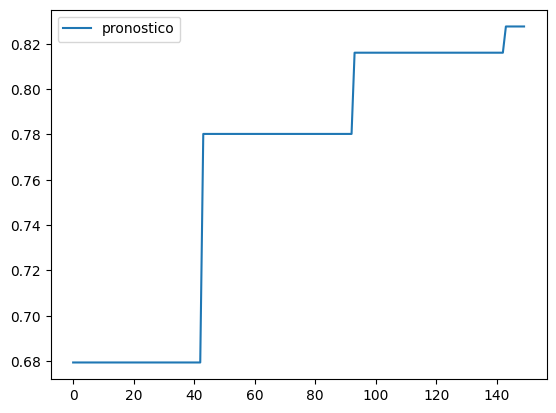

In [0]:
prediccion_24abril = pd.DataFrame(adimen)
prediccion_24abril.columns = ['pronostico']
prediccion_24abril.plot()

##  Time Series how Problem de Aprendizaje supervisado 

1. Ejemplo de explicacion como podriamos pasar de problema de serie temporal a aprendizaje supervisado

In [0]:
from pandas import DataFrame
df = DataFrame()
df['t'] = [x for x in range(10)]
df['t-1'] = df['t'].shift(1)  # 1 un paso atras, =1 un paso adelante
df['t-2'] = df['t'].shift(2)
print(df)

   t      t-1      t-2
0  0      NaN      NaN
1  1 0.000000      NaN
2  2 1.000000 0.000000
3  3 2.000000 1.000000
4  4 3.000000 2.000000
5  5 4.000000 3.000000
6  6 5.000000 4.000000
7  7 6.000000 5.000000
8  8 7.000000 6.000000
9  9 8.000000 7.000000


In [0]:
values = [x for x in range(10)]
data = series_to_supervised(values, 3)
print(data)

   var1(t-3)  var1(t-2)  var1(t-1)  var1(t)
3   0.000000   1.000000   2.000000        3
4   1.000000   2.000000   3.000000        4
5   2.000000   3.000000   4.000000        5
6   3.000000   4.000000   5.000000        6
7   4.000000   5.000000   6.000000        7
8   5.000000   6.000000   7.000000        8
9   6.000000   7.000000   8.000000        9


In [0]:
raw = DataFrame()
raw['ob1'] = [x for x in range(10)]
raw['ob2'] = [x for x in range(50, 60)]
values = raw.values
values
#data = series_to_supervised(values)
#print(data)

array([[ 0, 50],
       [ 1, 51],
       [ 2, 52],
       [ 3, 53],
       [ 4, 54],
       [ 5, 55],
       [ 6, 56],
       [ 7, 57],
       [ 8, 58],
       [ 9, 59]])

In [0]:
data = series_to_supervised(values)
print(data)

   var1(t-1)  var2(t-1)  var1(t)  var2(t)
1   0.000000  50.000000        1       51
2   1.000000  51.000000        2       52
3   2.000000  52.000000        3       53
4   3.000000  53.000000        4       54
5   4.000000  54.000000        5       55
6   5.000000  55.000000        6       56
7   6.000000  56.000000        7       57
8   7.000000  57.000000        8       58
9   8.000000  58.000000        9       59


Cargamos los datos a Analizar y pasar de Time Series a Supervised Learning

In [0]:
#1. Leemos los datos de PROCEESED la tabla Delta 
# df_delta2 = spark.read.format("delta").load("/mnt/datalakemlopsd4m/presentation/proyectocongestion_presentation/tablacaracteristicas_congestion_tabladelta_v3")

df_delta2 = spark.read.format("delta").load("/mnt/datalakemlopsd4m/presentation/proyectocongestion_presentation/data_congestion_serietemp_balanceada")

datos_cong_balanceado = df_delta2.toPandas()
datos_cong_balanceado.head()

,instant_date_t,congestion,eq_id,x,y,z,bearing_t,speed_t,gear_t,pitch_t,roll_t,n_sat,tramosidsnew_t,id_trabaj_t,tempeje1_t,tempeje2_t,tempeje3_t,tempeje4_t,tempeje5_t,tempeje6_t,presllanta1_t,presllanta2_t,presllanta3_t,presllanta4_t,presllanta5_t,presllanta6_t,isload_t,tonelaje_t,marcha_t,latitude_t,longitud_t,precisiongps_t,direccion_t,combustibleint_t,frecuencia_t,templlanta1_t,templlanta2_t,templlanta3_t,templlanta4_t,templlanta5_t,templlanta6_t,bateriasensorllanta1_t,bateriasensorllanta2_t,bateriasensorllanta3_t,bateriasensorllanta4_t,bateriasensorllanta5_t,bateriasensorllanta6_t,segment_angle_t,fuel_rate_t,id_equipment,id_path,id_worker,start_xcoorint,start_ycoorint,start_zcoorint,end_xcoorint,end_ycoorint,end_zcoorint,alert_level,id_equipment_congestion,id_equipo,ENG_SPD,BOOST_PRES,SYS_VOLTAGE,ENG_OIL_PRES,THROTTL_POS,GROUND_SPD,AMB_AIR_TEMP,AIR_FLTR,HI_BOOST_PRES,ENG_COOL_TEMP,RT_LT_EXH_TEMP,LO_BOOST_PRES,LCKUP_SLIP,TRN_LUBE_TEMP,DIFF_LUBE_PRES,DIFF_TEMP,AUTO_LUBE,TRN_OUT_SPD,TC_OUT_TEMP,Gear,BRK/AIR_PRES,BRK_STROKE,RETARDER,RETARDER_MODE,RTF_LTF_BRKTEMP,RTR_LTR_BRKTEMP,RT_F_BRK_TEMP,RT_R_BRK_TEMP,LT_R_BRK_TEMP,SERV_BRK_STAT,PAYLOAD,Z_Coor,Tire_Press_N4,Hourmeter_MSPU,Lon_Coor,Speed_GPS,Direction,Lat_Coor,Tire_Press_N6,Lat,year,mes,dia,hora,minuto
0,2024-04-07 20:22:07,0,61,5747788,6698336,64520,50,19,0,189,-168,12,-1,673,86,86,85,85,0,0,0,0,0,0,0,0,1,1383,0,-15207896,-75111030,400,50,88,2,0,0,0,0,0,0,0,0,0,0,0,0,0,204,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,61,698.691243,4.000000,0.000000,465.000000,0.000000,0.000000,30.790000,0.000000,0.000000,87.000000,2.000000,0.000000,0.920000,94.000000,0.000000,82.000000,0.000000,0.000000,86.000000,0.000000,829.000000,0.000000,0.000000,3.000000,0.000000,0.000000,86.000000,85.000000,85.000000,0.000000,138.300000,645.107834,-75.110000,182.640000,-15.200000,-15.207896,-75.111032,48807509.529940,831867650.000000,64510.783433,2024,4,23,16,7
1,2024-04-07 20:22:08,0,199,5869496,6644852,76607,144,0,0,52,504,19,-1,-1,56,59,61,62,0,0,0,0,0,0,0,0,0,0,0,-15212737,-75099700,300,144,66,2,0,0,0,0,0,0,0,0,0,0,0,0,0,170,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,199,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,4,19,16,38
2,2024-04-07 20:22:09,0,199,5858844,6644509,78579,221,13,0,25,73,12,-1,-1,50,53,57,57,0,0,0,0,0,0,0,0,0,0,0,-15212767,-75100692,350,221,78,2,0,0,0,0,0,0,0,0,0,0,0,0,0,168,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,199,699.534432,0.000000,0.000000,444.000000,0.000000,0.000000,18.790000,0.000000,0.000000,62.000000,12.000000,0.000000,1.070000,59.000000,0.000000,28.000000,0.000000,0.000000,54.000000,0.000000,737.000000,0.000000,0.000000,1.000000,-3.000000,0.000000,50.000000,57.000000,57.000000,0.000000,0.000000,785.780000,-75.100000,0.000000,-15.210000,-15.212768,-75.100688,48918576.000000,831813800.000000,78579.000000,2024,4,8,21,19
3,2024-04-07 20:22:10,0,199,5888426,6701673,79886,66,2987,6,287,213,16,-1,324,86,90,94,94,0,0,0,0,0,0,0,0,0,0,6,-15207600,-75097935,350,66,85,2,0,0,0,0,0,0,0,0,0,0,0,0,0,1161,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,199,1397.085295,75.183778,0.000000,479.000000,71.657043,30.461217,25.500000,0.500000,0.000000,85.000000,-6.718378,0.000000,1.268819,94.640811,155.718378,83.640811,0.000000,1648.951078,89.000000,6.000000,753.028644,0.000000,0.000000,2.000000,-3.640811,1.000000,87.359189,94.640811,93.640811,0.000000,0.000000,799.805774,-75.090000,51.485078,-15.200000,-15.207498,-75.097749,48950156.109478,831872112.648898,7

Ajuste de los datos para problemas de Time Series(Establecer la Frecuencia )

In [0]:
# #2. Ajuste de los datos a Series Temporales
# #2.1 Se establece la columna 'Time' como el índice del DataFrame "datos"
datos_cong_balanceado = datos_cong_balanceado.set_index('instant_date_t')

# #2.3 Ordenamos el dataset de forma ascendente segun el datetime
datos_cong_balanceado.sort_index(inplace=True)

#2.4 Identificamos la periocidad de la serie temporal
df_time_diffs = datos_cong_balanceado.index.to_series().diff().dt.total_seconds()

# # 2.4.1 Contar cuántas diferencias de tiempo tienen cada valor específico
# diferencias_frecuencias = df_time_diffs.value_counts().sort_index()
# # 2.4.2 Mostrar los recuentos
# print(diferencias_frecuencias)

#3. Eliminamos o Filtramos las filas donde la diferencia es distinta de cero (Con ello eliminamos las filas o registros de fechas duplicadas)
datos_cong_balanceado = datos_cong_balanceado[df_time_diffs != 0]

#4. # Reinterpolar el dataset con una periosidad en especifico
# 'S' o 'seg' : Segundo, 'T' o 'min': Minuto,'H' o 'Hr': Hora,'D': Día,'W': Semana,'M': Mes,'Q': Trimestre,'Y': Año
#datos_cong_balanceado = datos_cong_balanceado.asfreq(freq='5T', method='bfill')
datos_cong_balanceado = datos_cong_balanceado.asfreq(freq='6s', method='bfill')

# Filtramos los valores de x, y, z que son 0s
mask = (datos_cong_balanceado['x'] == 0) & (datos_cong_balanceado['y'] == 0) & (datos_cong_balanceado['z'] == 0)
datos_cong_balanceado = datos_cong_balanceado[~mask]

datos_cong_balanceado.head()

,congestion,eq_id,x,y,z,bearing_t,speed_t,gear_t,pitch_t,roll_t,n_sat,tramosidsnew_t,id_trabaj_t,tempeje1_t,tempeje2_t,tempeje3_t,tempeje4_t,tempeje5_t,tempeje6_t,presllanta1_t,presllanta2_t,presllanta3_t,presllanta4_t,presllanta5_t,presllanta6_t,isload_t,tonelaje_t,marcha_t,latitude_t,longitud_t,precisiongps_t,direccion_t,combustibleint_t,frecuencia_t,templlanta1_t,templlanta2_t,templlanta3_t,templlanta4_t,templlanta5_t,templlanta6_t,bateriasensorllanta1_t,bateriasensorllanta2_t,bateriasensorllanta3_t,bateriasensorllanta4_t,bateriasensorllanta5_t,bateriasensorllanta6_t,segment_angle_t,fuel_rate_t,id_equipment,id_path,id_worker,start_xcoorint,start_ycoorint,start_zcoorint,end_xcoorint,end_ycoorint,end_zcoorint,alert_level,id_equipment_congestion,id_equipo,ENG_SPD,BOOST_PRES,SYS_VOLTAGE,ENG_OIL_PRES,THROTTL_POS,GROUND_SPD,AMB_AIR_TEMP,AIR_FLTR,HI_BOOST_PRES,ENG_COOL_TEMP,RT_LT_EXH_TEMP,LO_BOOST_PRES,LCKUP_SLIP,TRN_LUBE_TEMP,DIFF_LUBE_PRES,DIFF_TEMP,AUTO_LUBE,TRN_OUT_SPD,TC_OUT_TEMP,Gear,BRK/AIR_PRES,BRK_STROKE,RETARDER,RETARDER_MODE,RTF_LTF_BRKTEMP,RTR_LTR_BRKTEMP,RT_F_BRK_TEMP,RT_R_BRK_TEMP,LT_R_BRK_TEMP,SERV_BRK_STAT,PAYLOAD,Z_Coor,Tire_Press_N4,Hourmeter_MSPU,Lon_Coor,Speed_GPS,Direction,Lat_Coor,Tire_Press_N6,Lat,year,mes,dia,hora,minuto
instant_date_t,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2024-03-27 01:15:34,1,61,5860974,6645449,80200,0,0,0,0,0,0,-1,671,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,100,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,3,27,1,15
2024-03-27 01:15:40,1,61,5860974,6645449,80200,0,0,0,0,0,0,-1,671,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,100,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,3,27,1,15
2024-03-27 01:15:46,1,61,5857614,6647093,78890,0,12,0,52,25,12,-1,671,38,37,40,39,0,0,0,0,0,0,0,0,0,0,0,-15212533,-75100807,419,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,562,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2024,3,27,1,15
2024-03-27 01:15:52,1,61,5857614,6647093,78870,0,3,0,52,24,12,-1,671,38,37,40,39,0,0,0,0,0,0,0,0,0,0,0,-15212533,-75100807,390,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,587,198.000000,13072.000000,691.000000,5860588.000000,6772271.000000,74430.000000,5871652.000000,6770008.000000,75330.000000,2.000000,61.000000,61,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00

In [0]:
datos_cong_balanceado.shape

(353323, 105)

In [0]:
datos_cong_balanceado['congestion'].value_counts()

congestion
1    366759
0     35679
Name: count, dtype: int64

In [0]:
#Va
datos_cong_balanceado['congestion'].value_counts()

congestion
1    272718
0     80605
Name: count, dtype: int64

Eleccion de si es Modelo Univariado o Multivariado (Poner la columna a Predecir en la ultima columna )

In [0]:
#datos_df = datos_cong_balanceado['congestion']  # Modelo Univariado


#En Multivariado, poner la variable a predecir, en la columna final
# c_variables = ['id_equipo','id_worker','id_path','n_sat','isload_t','marcha_t','precisiongps_t','x','y','z','direccion_t'
# ,'speed_t','pitch_t','roll_t','segment_angle_t','tonelaje_t','fuel_rate_t','combustibleint_t'
# ,'LCKUP_SLIP','BRK/AIR_PRES','RTF_LTF_BRKTEMP','RTR_LTR_BRKTEMP','RT_F_BRK_TEMP','RT_R_BRK_TEMP','LT_R_BRK_TEMP','SERV_BRK_STAT','Tire_Press_N4','Tire_Press_N6','Hourmeter_MSPU','Direction','congestion']

c_variables = ['x','speed_t','congestion']


datos_df = datos_cong_balanceado[c_variables]  # Modelo Multivariado
datos_df.head()

,x,speed_t,congestion
instant_date_t,,,
2024-03-27 01:15:34,5860974,0,1
2024-03-27 01:15:40,5860974,0,1
2024-03-27 01:15:46,5857614,12,1
2024-03-27 01:15:52,5857614,3,1
2024-03-27 01:15:58,5857614,3,1


Escalar/Normalizar los datos 
- Es requerido para garantizar que todas las caracteristicas se encuentren en el mismo rango
de valores, lo que facilita el entrenamiento del Modelo y las predicciones

In [0]:
import numpy as np

def escalar_por_variables_especificas(dataframe, variables_a_escalar, medias, desviaciones_estandar):
  """
  Escala solo las variables especificadas en un dataframe de forma independiente.

  Args:
    dataframe: El dataframe que se va a escalar.
    variables_a_escalar: Una lista que contiene los nombres de las variables que se van a escalar.
    medias: Un diccionario que contiene la media de cada variable.
    desviaciones_estandar: Un diccionario que contiene la desviación estándar de cada variable.

  Returns:
    El dataframe escalado.
  """
  dataframe_escalado = dataframe.copy()
  for columna in dataframe.columns:
    if columna in variables_a_escalar:
      dataframe_escalado[columna] = (dataframe[columna] - medias[columna]) / desviaciones_estandar[columna]
  return dataframe_escalado

In [0]:

# Definir la lista de variables a escalar
variables_a_escalar = ["x", "speed_t"]  # Reemplazar con los nombres reales de las columnas

# Calcular medias y desviaciones estándar para todas las variables
medias = datos_df.mean()
desviaciones_estandar = datos_df.std()

# Escalar solo las variables especificadas en el dataframe train
df_escalado = escalar_por_variables_especificas(datos_df, variables_a_escalar, medias, desviaciones_estandar)

Generacion del DataSet Supervisado
- Función de Python llamada series_to_supervised()

In [0]:
# Función de Python llamada series_to_supervised() que toma una serie temporal univariada o multivariada y la encuadra como un #conjunto de datos de aprendizaje supervisado.
import pandas as pd
 
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    """
    Frame a time series as a supervised learning dataset.
    Arguments:
    data: Secuencia de observaciones como una lista o matriz NumPy 2D.
    n_in : número de observaciones de retraso como entrada ( X ). Los valores pueden estar entre [1..len(data)] Opcional. El valor predeterminado es 1.
    n_out : Número de observaciones como salida ( y ). Los valores pueden estar entre [0..len(data)-1]. Opcional. El valor predeterminado es 1.
    dropnan : valor booleano para eliminar o no filas con valores NaN. Opcional. El valor predeterminado es Verdadero.

    Returns:
    Pandas DataFrame of series framed for supervised learning.
    """
    n_vars = 1 if type(data) is list else data.shape[1]
    df = pd.DataFrame(data)
    cols, names = list(), list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))    # Aplicas los pasos hacia atras 
        names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))   # Aplicas los pasos hacia adelante
        if i == 0:
            names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
        else:
            names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
    # put it all together
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)    #Eliminamos las filas Nulas de nuestro df generado(Porque no sirven en la serie temporal)
    return agg

In [0]:
# Crear los datasets de entrenamiento, prueba y validación y verificar sus tamaños
numero_pasos_atras = 1  # Hiperparámetro
numero_pasos_futuro = 1   # Modelo uni-step igual a 1 paso,   MUltivariado seria mayor a 1 paso al futuro

# tr_s = series_to_supervised(tr.values, numero_pasos_atras , numero_pasos_futuro)
# vl_s = series_to_supervised(vl.values, numero_pasos_atras, numero_pasos_futuro)
# ts_s = series_to_supervised(ts.values, numero_pasos_atras, numero_pasos_futuro)

datos_df_s = series_to_supervised(datos_df.values, numero_pasos_atras, numero_pasos_futuro)

# Asignar nombres originales a las columnas
original_columns = datos_df.columns

new_columns = []
for i in range(numero_pasos_atras, 0, -1):
    new_columns += [f'{col}(t-{i})' for col in original_columns]
for i in range(0, numero_pasos_futuro):
    if i == 0:
        new_columns += [f'{col}(t)' for col in original_columns]
    else:
        new_columns += [f'{col}(t+{i})' for col in original_columns]

datos_df_s.columns = new_columns
datos_df_s.head()

,x(t-1),speed_t(t-1),congestion(t-1),x(t),speed_t(t),congestion(t)
1,5860974.000000,0.000000,1.000000,5860974,0,1
2,5860974.000000,0.000000,1.000000,5857614,12,1
3,5857614.000000,12.000000,1.000000,5857614,3,1
4,5857614.000000,3.000000,1.000000,5857614,3,1
5,5857614.000000,3.000000,1.000000,5857614,0,1


In [0]:
datos_df_s.head()

,var1(t-2),var2(t-2),var3(t-2),var1(t-1),var2(t-1),var3(t-1),var1(t),var2(t),var3(t)
2,5860974.000000,0.000000,1.000000,5860974.000000,0.000000,1.000000,5857614,12,1
3,5860974.000000,0.000000,1.000000,5857614.000000,12.000000,1.000000,5857614,3,1
4,5857614.000000,12.000000,1.000000,5857614.000000,3.000000,1.000000,5857614,3,1
5,5857614.000000,3.000000,1.000000,5857614.000000,3.000000,1.000000,5857614,0,1
6,5857614.000000,3.000000,1.000000,5857614.000000,0.000000,1.000000,5857614,11,1


Solo nos quedamos en la ultima columna con la columna a predecir (Las demas que estan en el tiempo T se eliminan)

In [0]:
# Solo nos quedariamos con la variable congestion(t)  como target
columns_to_drop = ['x(t)', 'speed_t(t)']
datos_df_s.drop(columns=columns_to_drop, inplace=True)

In [0]:
datos_df_s.head()

,x(t-1),speed_t(t-1),congestion(t-1),congestion(t)
1,5860974.000000,0.000000,1.000000,1
2,5860974.000000,0.000000,1.000000,1
3,5857614.000000,12.000000,1.000000,1
4,5857614.000000,3.000000,1.000000,1
5,5857614.000000,3.000000,1.000000,1


In [0]:
datos_df_s.shape

(353321, 7)

Separamos los datos en Train, Validation, Test

In [0]:
#Funcion para generar las particiones, siguiendo la secuencia de las series temporales
def train_val_test_split(serie, tr_size =0.8, vl_size=0.1, ts_size=0.1):
    # Definir nunmero de datos en cada subserie
    N = serie.shape[0]   #Serie seria el df, con las columnas que intervendran en el Modelo
    Ntrain = int(tr_size*N)  # Numero de datos de entrenamiento
    Nval = int(vl_size*N)
    Ntest = int(ts_size*N)

    #Realizar la particion
    train = serie[0:Ntrain]
    val = serie[Ntrain:Nval+Ntrain]
    test = serie[Nval+Ntrain:]

    return train, val, test


# Prueba de la funcion 
tr, vl, ts  = train_val_test_split(datos_df_s)

print(f'Shape del Set de Entrenamiento, {tr.shape}')
print(f'Shape del Set de Validacion, {vl.shape}')
print(f'Shape del Set de Test, {ts.shape}')

Shape del Set de Entrenamiento, (282657, 4)
Shape del Set de Validacion, (35332, 4)
Shape del Set de Test, (35333, 4)


Separamos las X(Variables predictoras) e Y(variable target), para luego poner en X_train, etc

In [0]:
def separar_X_y(df, target_col):
    X = df.drop(columns=[target_col])
    y = df[target_col]
    return X, y

# Separar características y objetivo para cada conjunto
X_train, y_train = separar_X_y(tr, 'congestion(t)')
X_val, y_val = separar_X_y(vl, 'congestion(t)')
X_test, y_test = separar_X_y(ts, 'congestion(t)')

In [0]:
datos_df.head(10)

,x,speed_t,congestion
instant_date_t,,,
2024-03-27 01:15:34,5860974,0,1
2024-03-27 01:15:40,5860974,0,1
2024-03-27 01:15:46,5857614,12,1
2024-03-27 01:15:52,5857614,3,1
2024-03-27 01:15:58,5857614,3,1
2024-03-27 01:16:04,5857614,0,1
2024-03-27 01:16:10,5857614,11,1
2024-03-27 01:16:16,5857614,16,1
2024-03-27 01:16:22,5857614,11,1


In [0]:
X_train.head()

,x(t-1),speed_t(t-1),congestion(t-1)
1,5860974.000000,0.000000,1.000000
2,5860974.000000,0.000000,1.000000
3,5857614.000000,12.000000,1.000000
4,5857614.000000,3.000000,1.000000
5,5857614.000000,3.000000,1.000000


In [0]:
X_train.shape

(282656, 6)

La red LSTM espera que los datos de entrada (X) se proporcionen con una estructura de matriz específica en forma de: [muestras, pasos de tiempo, características]

In [0]:
import numpy as np
n_features = X_train.shape[1]  # número de características predictoras
# Función para reshape de X para LSTM
def reshape_X_for_lstm(X, numero_pasos_atras, n_features):
    n_samples = X.shape[0] - numero_pasos_atras - numero_pasos_futuro + 1
    X_lstm = np.zeros((n_samples, numero_pasos_atras, n_features))
    for i in range(n_samples):
        X_lstm[i] = X.iloc[i:i+numero_pasos_atras, :].values
    return X_lstm

# Aplicar reshape para XS( X_train, X_val, X_test) para LSTM
X_train_lstm = reshape_X_for_lstm(X_train, numero_pasos_atras, n_features)
X_val_lstm = reshape_X_for_lstm(X_val, numero_pasos_atras, n_features)
X_test_lstm = reshape_X_for_lstm(X_test, numero_pasos_atras, n_features)

# Función para reshape para Ys () para LSTM
def reshape_y_for_lstm(y, numero_pasos_futuro):
    return y.iloc[numero_pasos_atras + numero_pasos_futuro - 1:].values.reshape(-1, numero_pasos_futuro, 1)

# Aplicar reshape para y_train, y_val, y_test
y_train_lstm = reshape_y_for_lstm(y_train, numero_pasos_futuro)
y_val_lstm = reshape_y_for_lstm(y_val, numero_pasos_futuro)
y_test_lstm = reshape_y_for_lstm(y_test, numero_pasos_futuro)

# Verificar las formas después del reshape para LSTM
print("Shape de X_train_lstm:", X_train_lstm.shape)
print("Shape de y_train_lstm:", y_train_lstm.shape)
print("Shape de X_val_lstm:", X_val_lstm.shape)
print("Shape de y_val_lstm:", y_val_lstm.shape)
print("Shape de X_test_lstm:", X_test_lstm.shape)
print("Shape de y_test_lstm:", y_test_lstm.shape)

Shape de X_train_lstm: (282656, 1, 3)
Shape de y_train_lstm: (282656, 1, 1)
Shape de X_val_lstm: (35331, 1, 3)
Shape de y_val_lstm: (35331, 1, 1)
Shape de X_test_lstm: (35332, 1, 3)
Shape de y_test_lstm: (35332, 1, 1)


In [0]:
X_train_lstm[:5]

array([[[5.860974e+06, 0.000000e+00, 1.000000e+00]],

       [[5.860974e+06, 0.000000e+00, 1.000000e+00]],

       [[5.857614e+06, 1.200000e+01, 1.000000e+00]],

       [[5.857614e+06, 3.000000e+00, 1.000000e+00]],

       [[5.857614e+06, 3.000000e+00, 1.000000e+00]]])

In [0]:
X_train_lstm[2]

array([[5.857614e+06, 1.200000e+01, 1.000000e+00]])

#### Metodos para pasar a formato de input para Redes Neuronales LSTM
Ambos métodos pueden ser válidos dependiendo del contexto y la estructura de los datos.

(282653, 2, 7), (282653, 1, 1) para entrenamiento:

Aquí, cada muestra tiene 2 pasos de tiempo y 7 características para las variables predictoras, y un solo valor de salida. Esto es adecuado si estás modelando datos donde tienes múltiples pasos de tiempo y varias características.


(282653, 14), (282653,) para entrenamiento:

En este caso, todas las características se aplanan en una sola dimensión, lo que significa que tratas todas las características como una secuencia única de datos por muestra. Esto puede ser útil en algunos casos donde no necesitas modelar explícitamente múltiples pasos de tiempo, pero simplemente quieres predecir un solo valor en el siguiente paso de tiempo.

In [0]:
X_train_lstm.shape

(282656, 1, 3)

In [0]:
# Construccion del Modelo
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import RMSprop, Adam
import tensorflow as tf

# Fijar Valores parametros , para asegurar la reproducibilidad de los datos inicializados
tf.random.set_seed(123) # Semilla(inicializacion de los parametros o pesos de misma manera)
tf.config.experimental.enable_op_determinism() # Cada vez se ejecute de misma manera

# El Modelo
N_UNITS = 50 # Tamaño del estado oculto de la celda de Memoria de LSTM
INPUT_SHAPE = (X_train_lstm.shape[1], X_train_lstm.shape[2]) #pasos atras x n features (feature)

modelo = Sequential()
modelo.add(LSTM(N_UNITS, input_shape=INPUT_SHAPE))
modelo.add(Dense(numero_pasos_futuro, activation='sigmoid')) # linear: problema regresion, sigmoid:clasificacion binaria, softmax:multiclase

#RSME: Para problemas de regresion, para tener errores en las mismas unidades de la variable target
# def root_mean_squared_error(y_true,y_pred):
#     rmse=tf.math.sqtr(tf.math.reduce_mean(tf.square(y_pred-y_true)))
#     return rmse

# Optimizador para problema de regresion
# optimizador = RMSprop(learning_rate=0.05)

#Compilation


# Compilar el modelo
modelo.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy','AUC'])

# Entrenamiento del Modelo
EPOCHS = 50 # Numero de epocas de entrenamiento
BATCH_SIZE = 256 # Numero de lotes que van ingresando al Modelo(Algoritmo)
historia = modelo.fit(
    x = X_train_lstm,
    y = y_train_lstm,
    batch_size = BATCH_SIZE,
    epochs = EPOCHS,
    validation_data = (X_val_lstm, y_val_lstm),
    verbose=2  #Imprime en pantalla con va el entrenamiento
)

Epoch 1/50
1105/1105 - 7s - loss: 0.6063 - accuracy: 0.6916 - auc: 0.4998 - val_loss: 0.3201 - val_accuracy: 0.9707 - val_auc: 0.5000 - 7s/epoch - 6ms/step
Epoch 2/50
1105/1105 - 4s - loss: 0.5636 - accuracy: 0.7488 - auc: 0.5000 - val_loss: 0.3210 - val_accuracy: 0.9707 - val_auc: 0.5000 - 4s/epoch - 3ms/step
Epoch 3/50
1105/1105 - 4s - loss: 0.5636 - accuracy: 0.7488 - auc: 0.5013 - val_loss: 0.3301 - val_accuracy: 0.9707 - val_auc: 0.5000 - 4s/epoch - 3ms/step
Epoch 4/50
1105/1105 - 4s - loss: 0.5636 - accuracy: 0.7488 - auc: 0.5005 - val_loss: 0.3310 - val_accuracy: 0.9707 - val_auc: 0.5000 - 4s/epoch - 3ms/step
Epoch 5/50
1105/1105 - 4s - loss: 0.5637 - accuracy: 0.7488 - auc: 0.5001 - val_loss: 0.3207 - val_accuracy: 0.9707 - val_auc: 0.5000 - 4s/epoch - 3ms/step
Epoch 6/50
1105/1105 - 4s - loss: 0.5637 - accuracy: 0.7488 - auc: 0.4994 - val_loss: 0.3243 - val_accuracy: 0.9707 - val_auc: 0.5000 - 4s/epoch - 3ms/step
Epoch 7/50
1105/1105 - 4s - loss: 0.5637 - accuracy: 0.7488 - au

In [0]:
import pickle